In [1]:
#load libraries and setup file
import sys,os
root_path = os.path.abspath(os.path.join('..'))
print(root_path)
if root_path not in sys.path:
    sys.path.append(root_path)
%run -i "../lib/utils/ipynb_setup.py"
%load_ext autoreload
%autoreload 2
%matplotlib inline

#plotting
import matplotlib.pyplot as pl
import seaborn as sns
sns.set_style("ticks", {'axes.grid' : True})
# pl.rc("figure", facecolor="white",figsize = (8,8))
pl.rc("figure", facecolor="gray",figsize = (8,8))
pl.rc('text', usetex=False)
pl.rc('text.latex', preamble=r'\usepackage{amsmath}')
pl.rc('lines',markeredgewidth = 2)
pl.rc('font',size = 12)

/home/mptouzel/Dropbox/scripts/Projects/topicmod/code


In [2]:
fig_dir='../../output/figures/'
data_dir='../../output/data/'
models_dir='../../output/stm_models/'
# from lib.lib import *

In [37]:
print([t for t in df.columns])

['responseid', 'status', 'intcode', 'interview_start', 'interview_end', 'temptime', 'lang', 'prov', 'd1', 'd3', 'age', 'qmip', 'qmip_01', 'qmip_02', 'qmip_03', 'qmip_04', 'qmip_05', 'qmip_06', 'qmip_07', 'qmip_08', 'qmip_09', 'qmip_10', 'qmip_11', 'qmip_12', 'qmip_13', 'qmip_14', 'qmip_15', 'qmip_16', 'qmip_17', 'qmip_18', 'qmip_19', 'qmip_20', 'qmip_21', 'qmip_22', 'qmip_96', 'qmip_98', 'p1', 'p2_1', 'p2_2', 'p2_3', 'p2_4', 'p2_5', 'p2_6', 'p2_7', 'p2_8', 'p3_1', 'p3_2', 'p3_3', 'p3_4', 'p3_5', 'p4a_1', 'p4a_2', 'p4a_3', 'p4a_4', 'p4a_5', 'p4b_6', 'p4b_7', 'p4b_8', 'p4b_9', 'p4b_10', 'p4b_11', 'pk1', 'pk2', 'e2', 'e5', 'e6', 'e7', 'e8', 'a1', 'a2', 'a3', 'a4', 'a5', 'po1', 'po2', 'po3a', 'po3a_01', 'po3a_02', 'po3a_03', 'po3a_04', 'po3a_05', 'po3a_06', 'po3a_07', 'po3a_08', 'po3a_09', 'po3a_10', 'po3a_11', 'po3a_12', 'po3a_13', 'po3a_14', 'po3a_15', 'po3a_16', 'po3a_17', 'po3a_18', 'po3a_19', 'po3a_96', 'po3a_97', 'po3a_98', 'po3b', 'po3b_01', 'po3b_02', 'po3b_03', 'po3b_04', 'po3b_05

Get Corpus

In [44]:
df=pd.read_spss('../../data/carbon_tax/MW14523_032B_CLIENT.sav')
# df.A2_7
# df.PO3A_7
# df.PO3B_7
# df.PO3C_7


0                                                            
1                                                            
2                                                            
3                                                            
4                                                            
                                ...                          
1003                                                         
1004                                                         
1005                                                         
1006                                                         
1007    Je n'ai pas de raison. Je n'y connais pas grand chose
Name: PO3C_7, Length: 1008, dtype: object

Mostly human activity                              592
Mostly natural patterns                            127
Not sure                                           127
Neither because climate change is not happening      2
Name: A2_7, dtype: int64

In [15]:
from lib.lib import clean_corpus,get_resdf,translate_responses,convert_type
if True:
    #load dataset
    df=pd.read_stata('../../data/carbon_tax/CCOP_wave1.dta')

    #format covariate metadata
    included_fields={'responseid':'id','lang':'lang','d1':'sex','d3':'ageyear','prov':'prov','d10':'livingenv','d11':'partisanship','d13':'caruse','v3':'partyvote'}
    covdf=df.loc[:,included_fields.keys()].rename(columns=included_fields)
    covdf=convert_type(covdf)
    
    #pick question for pull responses from
    question_label = 'carbontax_q3'
    question_num='3' #carbon tax
    restypelist=['support','oppose','notsure']
    idx_labellist=list('abc')
    qstem='po'
    qlabellist=[qstem+str(question_num)+let for let in idx_labellist]
    resp_dict=dict(zip(qlabellist,restypelist))
    resdf=get_resdf(df,resp_dict)
    
    fdf=pd.merge(resdf,covdf,on='id')

    #translate french responses
    fdf['resclean']=fdf.res.values
    if True:
        fdf.loc[fdf.lang=='FR',['res', 'resclean']]=pd.read_csv(data_dir+question_label+'_translations',index_col = 0)
    else:
        fdf.loc[fdf.lang=='FR','resclean'] = translate_responses(fdf.loc[fdf.lang=='FR','res'])
        fdf.loc[fdf.lang=='FR',['res', 'resclean']].to_csv(data_dir+question_label+'_translations')
#     fdf.loc[fdf.lang=='FR',['res','resclean']].head()
    
    #clean corpus
    wordfixfile='../../data/carbon_tax/CCOP_wave1_nonwords_tabseparated.csv' 
    cleaned_responses, vocabulary = clean_corpus(fdf.resclean, wordfixfile=wordfixfile)#,reduce_to_stems_flag=False)
    fdf.resclean = cleaned_responses
    fdf=fdf[~(fdf.resclean=='')]
    fdf.to_csv(data_dir+question_label+'_data.csv',sep='\t',index=False)
else:
    fdf=pd.read_csv(data_dir+question_label+'_data.csv',sep='\t')
#when adding new responses, set reduce_to_stems_flag=False and scan the output vocabulary for nonwords to add to wordfixfile with their correction
# pd.options.display.max_rows=1500
# pd.options.display.max_colwidth=150
# print(cleaned_responses.to_string())
# vocabulary

oppose     1596
support    1340
notsure     377
Name: restype, dtype: int64


## Premodel analysis

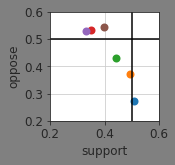

In [335]:
if False:
    fig,axa=pl.subplots(figsize=(2,2))
    field_name = 'agedec'
    value_list=[ '<19','19-29', '30-39', '40-49', '50-59','60+'] #order by age
    pycolors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

    for vit,val in enumerate(value_list):
        datatmp=fdf.loc[fdf[field_name]==val,'restype'].value_counts()[restypelist]
        datatmp=datatmp/datatmp.sum()
        axa.plot([datatmp[0]],[datatmp[1]],'o',color=pycolors[vit])
    #     fig,axa=pl.subplots()
    #     axa.bar(np.arange(3),datatmp,color=pycolors[vit])
    #     axa.set_xticks(np.arange(3),restypelist,rotation=-45,fontsize=7,ha='left',rotation_mode='anchor')
    axa.plot([0.2,0.6],[0.5]*2,'k-')
    axa.plot([0.5]*2,[0.2,0.6],'k-')

    axa.set_xlabel('support')
    axa.set_ylabel('oppose')
    axa.set_xlim(0.2,0.6)
    axa.set_ylim(0.2,0.6)
    axa.set_aspect('equal')

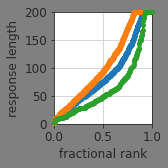

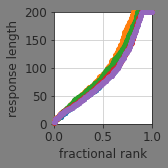

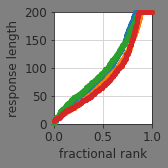

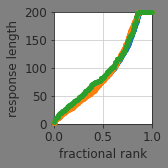

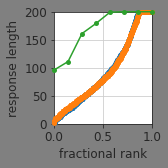

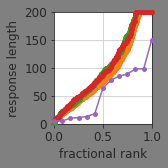

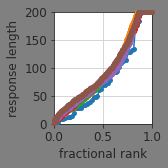

In [336]:
if False:
    from matplotlib.ticker import NullFormatter
    pycolors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    dbin=5
    binvec=np.arange(0,201,dbin)

    for fit,field_name in enumerate(['restype','prov','partisanship','caruse','sex','livingenv','agedec']):
        value_list=list(fdf[field_name].unique())
        if field_name == 'restype':
            value_list=restypelist
        if field_name == 'prov':
            value_list=['BC','AB','SK','ON','QC'] #order geographically
        if field_name == 'agedec':
            value_list=[ '<19','19-29', '30-39', '40-49', '50-59','60+'] #order by age
        figl,axl=pl.subplots(1,1,figsize=(2.5,2.5))#,gridspec_kw={'wspace':0,'hspace':0})
        for vit,val in enumerate(value_list):
    #         counts,binvec=np.histogram(fdf.loc[fdf[field_name]==val,'res'].apply(lambda x:len(str(x))).values,bins=binvec)
    #         axl[vit].plot(binvec[1:],counts/np.sum(counts)/dbin,'.-',color=pycolors[vit],clip_on=True,zorder=4)
    #         axl[vit].set_xlim(1,200)
    #         axl[vit].set_ylim(0,0.05)
            tmpdat=fdf.loc[fdf[field_name]==val,'res'].apply(lambda x:len(str(x))).values
            axl.plot(np.linspace(0,1,len(tmpdat)),np.sort(tmpdat),'.-',color=pycolors[vit],clip_on=False,zorder=4)
            axl.set_aspect('auto')
    #             axl[0,vit].set_xscale('log')
            axl.set_xlim(0,1)
            axl.set_ylim(0,200)
            axl.set_ylabel('response length')
            axl.set_xlabel('fractional rank')
    #         axl[vit].set_yticklabels([])
    #         axl[vit].xaxis.set_major_formatter(NullFormatter())
        figl.tight_layout()
        figl.savefig(fig_dir+"premodel_"+field_name+"_response_length.png", transparent=True,bbox_inches="tight",dpi=300)


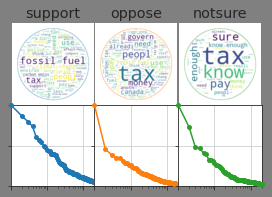

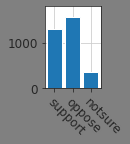

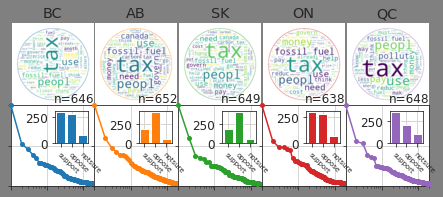

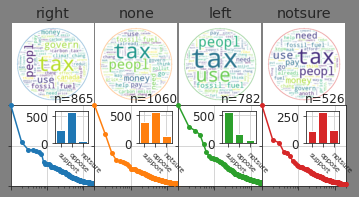

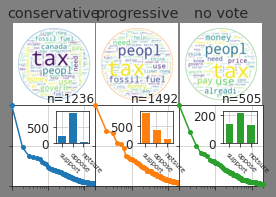

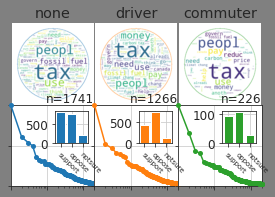

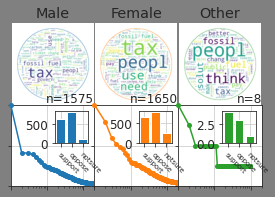

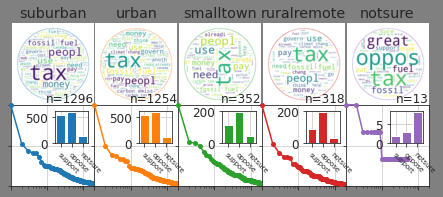

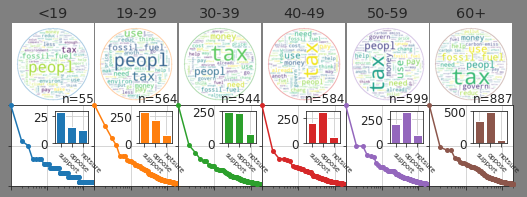

In [17]:
if True:
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    from wordcloud import WordCloud
    from matplotlib.ticker import NullFormatter
    x,y =np.ogrid[:300,:300]
    mask = (x -150)**2+(y-150)**2>130**2
    mask=255*mask.astype(int)
    pycolors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    for fit,field_name in enumerate(['restype','prov','partisanship','partyvote','caruse','sex','livingenv','agedec']):
        value_list=list(fdf[field_name].unique())
        if field_name == 'restype':
            value_list=restypelist
        if field_name == 'prov':
            value_list=['BC','AB','SK','ON','QC'] #order geographically
        if field_name == 'agedec':
            value_list=[ '<19','19-29', '30-39', '40-49', '50-59','60+'] #order by age
                        
        figw,axw=pl.subplots(2,len(value_list),figsize=(1.5*len(value_list),3),gridspec_kw={'wspace':0,'hspace':0})
        for vit,val in enumerate(value_list):
            wc=WordCloud(background_color='white', mask=mask, contour_color=pycolors[vit],contour_width=0.1,relative_scaling=1)
            wc.generate(' '.join(fdf.loc[fdf[field_name]==val,'resclean']))
            axw[0,vit].imshow(wc,interpolation='bilinear')
            axw[0,vit].set_title(val)
            axw[0,vit].axis('off')
            axw[1,vit].plot(np.arange(1,len(wc.words_.values())+1),wc.words_.values(),'.-',color=pycolors[vit],clip_on=False,zorder=4)
            axw[1,vit].set_aspect('auto')
            axw[1,vit].set_xscale('log')
            axw[1,vit].set_xlim(1,200)
            axw[1,vit].set_ylim(0,1)
            axw[1,vit].set_yticklabels([])
            axw[1,vit].xaxis.set_major_formatter(NullFormatter())

            if field_name=='restype' and vit==0:
                figres,axres=pl.subplots(figsize=(1,1.5))
                axres.bar(np.arange(len(restypelist)),fdf.restype.value_counts()[restypelist],tick_label=restypelist)
                axres.set_ylim(0,1800)
                axres.set_xticks(np.arange(3),restypelist,rotation=-45,fontsize=12,ha='left',rotation_mode='anchor')
                figres.savefig(fig_dir+"premodel_"+field_name+"_responses.png", transparent=True,bbox_inches="tight",dpi=300)
            elif field_name!='restype':
                ax = inset_axes(axw[1,vit],width='40%',height='40%',loc=1)
                datatmp=fdf.loc[fdf[field_name]==val,'restype'].value_counts()[restypelist]
                ax.bar(np.arange(3),datatmp,color=pycolors[vit])
                ax.set_xticks(np.arange(3),restypelist,rotation=-45,fontsize=7,ha='left',rotation_mode='anchor')
                axw[1,vit].text(1,1,'n='+str(datatmp.sum()),ha='right',va='bottom',transform=axw[1,vit].transAxes)
                
#                 if field_name == 'agedec':
#                     axa.plot(datatmp[0],datatmp[0],'o',color=pycolors[vit])

#                 ax.set_ylim(0,1000)
#                 ax.set_yticks([1000])
        figw.savefig(fig_dir+"premodel_"+field_name+"_wordclouds.png", transparent=True,bbox_inches="tight",dpi=300)
    
        figl,axl=pl.subplots(1,len(value_list),figsize=(1.5*len(value_list),1.5),gridspec_kw={'wspace':0,'hspace':0})
        for vit,val in enumerate(value_list):
            counts,binvec=np.histogram(fdf.loc[fdf[field_name]==val,'res'].apply(len).values,bins=binvec)
            axl[0,vit].plot(binsvec,counts/np.sum(counts),'.-',color=pycolors[vit],clip_on=False,zorder=4)
            axl[0,vit].set_aspect('auto')
#             axl[0,vit].set_xscale('log')
            axl[0,vit].set_xlim(1,200)
            axl[0,vit].set_ylim(0,0.5)
            axl[0,vit].set_yticklabels([])
            axl[0,vit].xaxis.set_major_formatter(NullFormatter())
        

# STM

## Preprocessing

In [18]:
fdf=pd.read_csv(data_dir+question_label+'_data.csv',sep='\t')
fdf.head()

,id,res,restype,lang,sex,prov,livingenv,partisanship,caruse,partyvote,agedec,resclean
0,27,We already have too much tax on gas.,oppose,EN,Male,ON,suburban,right,none,conservative,60+,alreadi much tax ga
1,28,It will likely not be effective and the scienc...,oppose,EN,Male,ON,suburban,right,driver,conservative,30-39,like effect scienc uncertain
2,29,"The people who will be paying, the average low...",oppose,EN,Female,SK,urban,none,driver,conservative,40-49,peopl pay averag low middl class peopl suffer ...
3,30,the government is making to much money,oppose,EN,Male,AB,urban,none,none,progressive,19-29,govern make much money
4,31,job killer,oppose,EN,Male,AB,smalltown,right,driver,conservative,30-39,job killer


In R, so need to interface

In [19]:
import rpy2
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter
from rpy2.robjects.lib import grdevices
from IPython.display import Image,display
pandas2ri.activate()

check versions

In [20]:
from platform import python_version
print(python_version())
for row in rpy2.situation.iter_info():
    print(row)
print(list(robjects.r(".libPaths()") ))

3.9.7
rpy2 version:
3.4.5
Python version:
3.9.7 (default, Sep 16 2021, 13:09:58) 
[GCC 7.5.0]
Looking for R's HOME:
    Environment variable R_HOME: /usr/lib/R
    Calling `R RHOME`: /usr/lib/R
    Environment variable R_LIBS_USER: None
R's additions to LD_LIBRARY_PATH:
/usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server
R version:
    In the PATH: R version 4.2.1 (2022-06-23) -- "Funny-Looking Kid"
    Loading R library from rpy2: OK
Additional directories to load R packages from:
None
C extension compilation:
  include:
  ['/usr/share/R/include']
  libraries:
  ['R', 'pcre2-8', 'lzma', 'bz2', 'z', 'rt', 'dl', 'm', 'icuuc', 'icui18n']
  library_dirs:
  ['/usr/lib/R/lib']
  extra_compile_args:
  []
  extra_link_args:
  ['-Wl,--export-dynamic', '-fopenmp', '-Wl,-Bsymbolic-functions', '-Wl,-z,relro']
['/home/mptouzel/R/x86_64-pc-linux-gnu-library/4.2', '/usr/local/lib/R/site-library', '/usr/lib/R/site-library', '/usr/lib/R/library']


In [21]:
pandas2ri.activate()
robjects.r("library('stm')"); 
#need to install stm ver. 1.3.6 R-package and its dependencies
#preprocessing: tm R-package,
#stm: quanteda R-package, ...
#n.b. might have to install xml2: sudo apt-get install libxml2-dev

#redefine topicquality function to output data
robjects.r('topicQuality <- function(model, documents, xlab="Semantic Coherence", ylab="Exclusivity", labels=1:ncol(model$theta), M=10,...){ \n'+\
  'args <- asSTMCorpus(documents) \n'+\
  'documents <- args$documents \n'+\
  'if(length(model$beta$logbeta)<2){ \n'+\
  '  semcoh <- semanticCoherence(model,documents=documents, M=M) \n'+\
  '  exclusivity <- exclusivity(model, M=M) \n'+\
  '  plot(0, 0, xlab=xlab, ylab=ylab, col="white", xlim=c(min(semcoh), max(semcoh)), \n'+\
  '       ylim=c(min(exclusivity), max(exclusivity)),...) \n'+\
  '  for(i in 1:length(labels)){ \n'+\
  '    text(semcoh[i], exclusivity[i], paste("Topic", labels[i])) \n'+\
  '  } \n'+\
  '  return(list(semcoh,exclusivity)) \n'+\
  '} \n'+\
  'if(length(model$beta$logbeta)>1){ \n'+\
  '  semcoh <- semanticCoherence(model,documents=documents, M=M) \n'+\
  '  for(i in 1:length(labels)){ \n'+\
  '    print(paste("Topic", i, "has", semcoh[i], "semantic coherence")) \n'+\
  '  } \n'+\
  '} \n'+\
'}');

def pre_process_stm(resp_data, occurs_in_morethan=1):
    with localconverter(robjects.default_converter + pandas2ri.converter):
        robjects.globalenv['doc_df'] = robjects.conversion.py2rpy(resp_data)

    robjects.r("processed_corpus_temp = textProcessor(doc_df$resclean, metadata=doc_df, lowercase=TRUE)");
    robjects.r(
        'processed_corpus = prepDocuments(processed_corpus_temp$documents,'+\
                                     'processed_corpus_temp$vocab,'+\
                                     'processed_corpus_temp$meta,'+\
                                     'lower.thresh='+str(occurs_in_morethan)+') \n'+\
        'rm(processed_corpus_temp); invisible(gc())'
    );
    
def batch_run_and_save(params,plot_flag = True,models_dir=models_dir):        
    for K in params['Krange']:
        for seed in params['seedlist']:
            run_name=params['batch_name']+'_K_'+str(K)+'_seed_'+str(seed)
            #run inference
            robjects.r("fitobj<-stm(documents=processed_corpus$documents,vocab=processed_corpus$vocab,K="+str(K)+\
                ",prevalence="+params['model_str']+", max.em.its=500,data=processed_corpus$meta,seed="+str(seed)+"," +\
                "sigma.prior = "+str(params['sigma_prior'])+\
            ")")
            robjects.r('save(fitobj, file = "'+models_dir+run_name+'.rda")')
            robjects.r('rm(fitobj)')
            if plot_flag:
                load_singlerun_and_plot(K,run_name)
    np.save(models_dir+params['batch_name']+'.npy',params)

def load_singlerun_and_plot(K,run_name,models_dir=models_dir,fig_dir=fig_dir,data_dir=data_dir):
    robjects.r('load(file = "'+models_dir+run_name+'.rda")')

#         #wordcloud
#         with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=1024, res=150) as img:
#             robjects.r.cloud(robjects.globalenv['fitobj'])
#         img_obj=Image(data=img.getvalue())
#         open(fig_dir+batch_name+str(K)+"_wordcloud.jpeg", "wb").write(img_obj.data)

    #topic wordlists
    shownwords=10
    test1=robjects.r('labelTopics(fitobj,n='+str(shownwords)+')')
    topicwords=pd.Series(np.asarray(test1.rx[1][0]).reshape((shownwords,K)).T.tolist(),index=range(1,K+1))
    topicwords.index.name='topicid'
    topicwords.to_csv(data_dir+run_name+'_topicwordlists.csv')

    #prevalence plot
    with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=1024, res=150) as img:
        robjects.r.plot(robjects.globalenv['fitobj'])
    img_obj=Image(data=img.getvalue())
    open(fig_dir+run_name+"_topicprevalence.jpeg", "wb").write(img_obj.data)
#     display(img_obj)

    #correlation matrix
    corrdata=robjects.r.topicCorr(robjects.globalenv['fitobj'])
    import scipy.cluster.hierarchy as sch
    d=sch.distance.pdist(corrdata[2])
    L=sch.linkage(d,method='complete')
    ind=sch.fcluster(L,0.5*d.max(),'distance')
    new_order = np.array([np.arange(K)[i] for i in list((np.argsort(ind)))])
    fig,ax=pl.subplots()
    ax.grid(False)
    p=ax.imshow(corrdata[2][:,new_order][new_order],cmap='RdBu',vmin=-1,vmax=1)
    ax.set_yticks(np.arange(K));
    ax.set_yticklabels(new_order+1);
    ax.set_xticks(np.arange(K));
    ax.set_xticklabels(new_order+1);
    cb=fig.colorbar(p,fraction=0.046,pad=0.04)
    cb.set_label(r'$\rho$',rotation=0)
    fig.savefig(fig_dir+run_name+"_corrmatrices.png", transparent=True,bbox_inches="tight",dpi=300)

    #correlation graph
    with grdevices.render_to_bytesio(grdevices.jpeg,width=512, height=512, res=150) as img:
        robjects.r.plot(corrdata)
    img_obj=Image(data=img.getvalue())
    open(fig_dir+run_name+"_corrgraph.jpeg", "wb").write(img_obj.data)
    
def load_plot_batch(params,models_dir=models_dir,fig_dir=fig_dir,data_dir=data_dir):

    #load data
    qual_data={}
    for K in params['Krange']:
        qual_data[K]={}
        for seed in params['seedlist']:
            qual_data[k][seed]={}
            run_name=params['batch_name']+'_K_'+str(K)+'_seed_'+str(seed)
            robjects.r('load(file = "'+models_dir+run_name+'.rda")')

            #topic quality
            with grdevices.render_to_bytesio(grdevices.jpeg,width=512, height=512, res=150) as img:
                datatmp=robjects.r.topicQuality(model=robjects.globalenv['fitobj'],documents=robjects.r("processed_corpus$documents"))
                qual_data[K][seed]['excl']=datatmp[1]
                qual_data[K][seed]['semcoh']=datatmp[0]
    
    #plot for each seed
    colors=pl.get_cmap('viridis',len(params['Krange']))(range(len(params['Krange'])))
    if params['batch_name'][0]=='o':
        mkr='o' 
    elif params['batch_name'][0]=='s':
        mkr='s'
    else:
        mkr='v'
    for seed in params['seedlist']:
        figse,axse=pl.subplots(figsize=(3,2))
        for kit,K in enumerate(params['Krange']):
            p=axse.plot(qual_data[K][seed]['semcoh'], qual_data[K][seed]['excl'],mkr,mew=0,color=colors[kit],label=str(K),alpha=0.5)
            axse.plot([np.mean(qual_data[K][seed]['semcoh'])], [np.mean(qual_data[K][seed]['excl'])],mkr,color=colors[kit],mec='k',mew=1,zorder=4)
        axse.set_xlabel('semantic coherence')
        axse.set_ylabel('exclusivity')
        axse.set_ylim(8.4,10)
        axse.set_xlim(-300,-100)
        axse.legend(frameon=False,loc='center left',bbox_to_anchor=(1.04,0.5))
        figse.savefig(fig_dir+batch_name+"_excl_semcoh.png", transparent=True,bbox_inches="tight",dpi=300)
    np.save(data_dir+batch_name+'_batch_data.npy',qual_data)

R[write to console]: stm v1.3.6 successfully loaded. See ?stm for help. 
 Papers, resources, and other materials at structuraltopicmodel.com



### Run Batch

Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
Removing 585 of 1281 terms (585 of 9840 tokens) due to frequency 
Removing 5 Documents with No Words 
Your corpus now has 1295 documents, 696 terms and 9255 tokens.Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.719) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.633, relative change = 1.499e-02) 
............................................................

Topic 1: use, fuel, carbon, help, emiss 
 Topic 2: peopl, tax, reduc, fossil, chang 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.579, relative change = 1.440e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.579, relative change = 1.366e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.579, relative change = 1.308e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteratio

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.577, relative change = 1.545e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.577, relative change = 1.596e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.577, relative change = 1.654e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.576, relative change = 1.722e-05) 
Topic 1: use, fu

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.571, relative change = 4.736e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.571, relative change = 4.636e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.570, relative change = 4.512e-05) 
Topic 1: use, fuel, reduc, carbon, help 
 Topic 2: peopl, tax, fossil, chang, environ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iterat

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.565, relative change = 4.223e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.565, relative change = 4.317e-05) 
Topic 1: use, fuel, reduc, carbon, help 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.564, relative change = 4.384e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Ite

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 155 (approx. per word bound = -5.559, relative change = 2.266e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -5.559, relative change = 2.217e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -5.559, relative change = 2.181e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 186 (approx. per word bound = -5.556, relative change = 1.319e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.556, relative change = 1.255e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.556, relative change = 1.196e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -5.5

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -5.554, relative change = 1.294e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 218 (approx. per word bound = -5.554, relative change = 1.274e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.554, relative change = 1.252e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 220 (approx. per word bound = -5.554, relative change = 1.230e-05) 
Topic 1: use

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 248 (approx. per word bound = -5.551, relative change = 1.538e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.551, relative change = 1.526e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.551, relative change = 1.517e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.549, relative change = 2.031e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 280 (approx. per word bound = -5.549, relative change = 2.040e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 281 (approx. per word bound = -5.548, relative change = 2.026e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.719) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.633, relative change = 1.499e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.607, relative change = 4.608e-03) 
...........................................................................................................
Completed E-Step (0 se

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.579, relative change = 1.366e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.579, relative change = 1.308e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.579, relative change = 1.261e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 35 (approx. per word bound = -5.579, relative change = 1.229e-05) 
Topic 1: use, fu

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.577, relative change = 1.596e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.577, relative change = 1.654e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.576, relative change = 1.722e-05) 
Topic 1: use, fuel, carbon, help, emiss 
 Topic 2: peopl, tax, fossil, reduc, chang 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteratio

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.571, relative change = 4.636e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.570, relative change = 4.512e-05) 
Topic 1: use, fuel, reduc, carbon, help 
 Topic 2: peopl, tax, fossil, chang, environ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.570, relative change = 4.373e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iterat

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.565, relative change = 4.317e-05) 
Topic 1: use, fuel, reduc, carbon, help 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.564, relative change = 4.384e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.564, relative change = 4.422e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Ite

 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -5.559, relative change = 2.217e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -5.559, relative change = 2.181e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.559, relative change = 2.156e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -5.5

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.556, relative change = 1.255e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.556, relative change = 1.196e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -5.556, relative change = 1.145e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -5.556, relative change = 1.103e-05) 
Topic 1: use

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 218 (approx. per word bound = -5.554, relative change = 1.274e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.554, relative change = 1.252e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 220 (approx. per word bound = -5.554, relative change = 1.230e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.551, relative change = 1.526e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.551, relative change = 1.517e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 251 (approx. per word bound = -5.551, relative change = 1.512e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 280 (approx. per word bound = -5.549, relative change = 2.040e-05) 
Topic 1: use, fuel, reduc, fossil, carbon 
 Topic 2: peopl, tax, chang, environ, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 281 (approx. per word bound = -5.548, relative change = 2.026e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 282 (approx. per word bound = -5.548, relative change = 1.987e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.837) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.691, relative change = 2.508e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.640, relative change = 9.020e-03) 
...........................................................................................................
Completed E-Step (0 s

 Topic 2: use, reduc, environ, less, altern 
 Topic 3: peopl, tax, fossil, chang, help 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.579, relative change = 2.960e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.579, relative change = 2.840e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.579, relative change = 2.743e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Itera

 Topic 3: peopl, tax, fossil, chang, help 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.576, relative change = 1.573e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.576, relative change = 1.598e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.575, relative change = 1.622e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.575, rel

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.573, relative change = 1.695e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -5.573, relative change = 1.680e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.573, relative change = 1.666e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.572, relative change = 1.655e-05) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.569, relative change = 2.675e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.569, relative change = 2.747e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.569, relative change = 2.821e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.569, relative change = 2.900e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -5.563, relative change = 3.745e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.563, relative change = 3.653e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.563, relative change = 3.566e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.563, relative change = 3.492e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 181 (approx. per word bound = -5.557, relative change = 4.306e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.557, relative change = 4.354e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.557, relative change = 4.394e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.556, relative change = 4.429e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.550, relative change = 3.388e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.550, relative change = 3.341e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.550, relative change = 3.297e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.550, relative change = 3.252e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 241 (approx. per word bound = -5.544, relative change = 5.076e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 242 (approx. per word bound = -5.544, relative change = 5.146e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.544, relative change = 5.182e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.543, relative change = 5.196e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 271 (approx. per word bound = -5.537, relative change = 3.900e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound = -5.536, relative change = 3.884e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.536, relative change = 3.876e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.536, relative change = 3.872e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.531, relative change = 2.994e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.531, relative change = 2.961e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.530, relative change = 2.931e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.530, relative change = 2.911e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 331 (approx. per word bound = -5.526, relative change = 3.075e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 332 (approx. per word bound = -5.526, relative change = 2.928e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 333 (approx. per word bound = -5.526, relative change = 2.777e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 334 (approx. per word bound = -5.526, relative change = 2.632e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 361 (approx. per word bound = -5.523, relative change = 1.599e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.523, relative change = 1.575e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.523, relative change = 1.544e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.523, relative change = 1.514e-05) 
............

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.837) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.691, relative change = 2.508e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.640, relative change = 9.020e-03) 
...........................................................................................................
Completed E-Step (0 s

 Topic 2: use, reduc, environ, less, altern 
 Topic 3: peopl, tax, fossil, chang, help 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.579, relative change = 2.960e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.579, relative change = 2.840e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.579, relative change = 2.743e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Itera

 Topic 3: peopl, tax, fossil, chang, help 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.576, relative change = 1.574e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.576, relative change = 1.598e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.575, relative change = 1.622e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.575, rel

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.573, relative change = 1.696e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -5.573, relative change = 1.679e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.573, relative change = 1.666e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.572, relative change = 1.655e-05) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.569, relative change = 2.675e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.569, relative change = 2.746e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.569, relative change = 2.821e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.569, relative change = 2.900e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -5.563, relative change = 3.744e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.563, relative change = 3.651e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.563, relative change = 3.566e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.563, relative change = 3.492e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 181 (approx. per word bound = -5.557, relative change = 4.306e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.557, relative change = 4.353e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.557, relative change = 4.396e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.556, relative change = 4.429e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.550, relative change = 3.388e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.550, relative change = 3.341e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.550, relative change = 3.296e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.550, relative change = 3.252e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 241 (approx. per word bound = -5.544, relative change = 5.080e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 242 (approx. per word bound = -5.544, relative change = 5.145e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.544, relative change = 5.182e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.543, relative change = 5.197e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 271 (approx. per word bound = -5.537, relative change = 3.897e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound = -5.536, relative change = 3.884e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.536, relative change = 3.875e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.536, relative change = 3.873e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.531, relative change = 2.994e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.531, relative change = 2.961e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.530, relative change = 2.932e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.530, relative change = 2.911e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 331 (approx. per word bound = -5.526, relative change = 3.075e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 332 (approx. per word bound = -5.526, relative change = 2.926e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 333 (approx. per word bound = -5.526, relative change = 2.777e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 334 (approx. per word bound = -5.526, relative change = 2.634e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 361 (approx. per word bound = -5.523, relative change = 1.599e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.523, relative change = 1.575e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.523, relative change = 1.542e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.523, relative change = 1.512e-05) 
............

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.872) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.718, relative change = 2.619e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.652, relative change = 1.156e-02) 
...........................................................................................................
Completed E-Step (0 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.567, relative change = 6.262e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.567, relative change = 6.033e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.567, relative change = 5.821e-05) 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.557, relative change = 7.851e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.556, relative change = 8.006e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.556, relative change = 8.151e-05) 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.545, relative change = 6.601e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.544, relative change = 6.598e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -5.544, relative change = 6.589e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.536, relative change = 4.780e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.536, relative change = 4.681e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.535, relative change = 4.581e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.535, relative change = 4.486e-05) 
Topic 1: red

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -5.530, relative change = 3.618e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.529, relative change = 3.650e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.529, relative change = 3.708e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.529, relative change = 3.799e-05) 
............

Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, money 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -5.522, relative change = 3.523e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.522, relative change = 3.333e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.521, relative change = 3.145e-05) 
........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 205 (approx. per word bound = -5.517, relative change = 2.941e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, money 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, pollut, mak 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 206 (approx. per word bound = -5.517, relative change = 2.880e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 207 (approx. per word bound = -5.517, relative change = 2.828e-05) 
......................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 234 (approx. per word bound = -5.512, relative change = 3.833e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 235 (approx. per word bound = -5.512, relative change = 3.907e-05) 
Topic 1: chang, environ, help, way, encourag 
 Topic 2: carbon, reduc, emiss, climat, energi 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, pollut, think, pay, mak 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 236 (approx. per word bound = -5.511, relative change = 3.998e-05) 
...................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.505, relative change = 2.697e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 264 (approx. per word bound = -5.505, relative change = 2.340e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 265 (approx. per word bound = -5.505, relative change = 2.026e-05) 
Topic 1: chang, environ, help, climat, way 
 Topic 2: reduc, carbon, emiss, money, put 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, pollut, think, pay, mak 
.........................................................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.872) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.718, relative change = 2.619e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.652, relative change = 1.156e-02) 
...........................................................................................................
Completed E-Step (0 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.567, relative change = 6.262e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.567, relative change = 6.033e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.567, relative change = 5.821e-05) 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.557, relative change = 7.855e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.556, relative change = 8.006e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.556, relative change = 8.149e-05) 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.545, relative change = 6.603e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.544, relative change = 6.597e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -5.544, relative change = 6.586e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, pollut 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
..........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.536, relative change = 4.786e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.536, relative change = 4.676e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.535, relative change = 4.584e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.535, relative change = 4.485e-05) 
Topic 1: red

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -5.530, relative change = 3.620e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.529, relative change = 3.651e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.529, relative change = 3.711e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.529, relative change = 3.803e-05) 
............

Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, money 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, mak, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -5.522, relative change = 3.525e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.522, relative change = 3.327e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.521, relative change = 3.147e-05) 
........................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 205 (approx. per word bound = -5.517, relative change = 2.945e-05) 
Topic 1: reduc, chang, environ, help, way 
 Topic 2: carbon, emiss, climat, energi, money 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, think, pay, pollut, mak 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 206 (approx. per word bound = -5.517, relative change = 2.881e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 207 (approx. per word bound = -5.517, relative change = 2.826e-05) 
......................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 234 (approx. per word bound = -5.512, relative change = 3.837e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 235 (approx. per word bound = -5.512, relative change = 3.913e-05) 
Topic 1: chang, environ, help, way, encourag 
 Topic 2: carbon, reduc, emiss, climat, energi 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, pollut, think, pay, mak 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 236 (approx. per word bound = -5.511, relative change = 4.003e-05) 
...................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.505, relative change = 2.696e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 264 (approx. per word bound = -5.505, relative change = 2.343e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 265 (approx. per word bound = -5.505, relative change = 2.023e-05) 
Topic 1: chang, environ, help, climat, way 
 Topic 2: reduc, carbon, emiss, money, put 
 Topic 3: use, fuel, tax, fossil, need 
 Topic 4: peopl, pollut, think, pay, mak 
.........................................................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.969) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.764, relative change = 3.436e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.684, relative change = 1.395e-02) 
...........................................................................................................
Completed E-Step (0

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.572, relative change = 7.435e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.572, relative change = 7.298e-05) 
Topic 1: money, mak, govern, make, caus 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.571, relative change = 7.140e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.563, relative change = 4.745e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.563, relative change = 4.615e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.563, relative change = 4.524e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.563, relative change = 4.486e-05) 
Topic 1: money, 

Topic 1: money, mak, govern, caus, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.556, relative change = 4.822e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -5.556, relative change = 4.771e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.556, relative change = 4.692e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.551, relative change = 2.436e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.551, relative change = 2.435e-05) 
Topic 1: money, mak, govern, caus, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.551, relative change = 2.448e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.547, relative change = 2.288e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.547, relative change = 2.312e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.547, relative change = 2.344e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.546, relative change = 2.381e-05) 
Topic 1: mon

Topic 1: money, mak, caus, govern, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.543, relative change = 1.561e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.543, relative change = 1.556e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.543, relative change = 1.553e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -5.541, relative change = 1.135e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.541, relative change = 1.134e-05) 
Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.541, relative change = 1.144e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.539, relative change = 1.377e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.539, relative change = 1.415e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.539, relative change = 1.433e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.539, relative change = 1.428e-05) 
Topic 1: mon

Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, fossil, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -5.537, relative change = 1.819e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -5.537, relative change = 1.821e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -5.537, relative change = 1.800e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 284 (approx. per word bound = -5.535, relative change = 1.198e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.535, relative change = 1.204e-05) 
Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, altern, pay 
 Topic 5: use, fuel, fossil, help, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.535, relative change = 1.206e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 312 (approx. per word bound = -5.533, relative change = 2.039e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.532, relative change = 2.116e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.532, relative change = 2.206e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.532, relative change = 2.305e-05) 
Topic 1: mon

Topic 1: money, mak, effect, must, caus 
 Topic 2: emiss, need, compani, put, consumpt 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, altern, pay 
 Topic 5: use, fuel, fossil, help, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 341 (approx. per word bound = -5.529, relative change = 1.623e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 342 (approx. per word bound = -5.529, relative change = 1.576e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 343 (approx. per word bound = -5.528, relative change = 1.532e-05) 
.....................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.969) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.764, relative change = 3.436e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.684, relative change = 1.395e-02) 
...........................................................................................................
Completed E-Step (0

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.572, relative change = 7.435e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.572, relative change = 7.298e-05) 
Topic 1: money, mak, govern, make, caus 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.571, relative change = 7.140e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.563, relative change = 4.743e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.563, relative change = 4.613e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.563, relative change = 4.525e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.563, relative change = 4.484e-05) 
Topic 1: money, 

Topic 1: money, mak, govern, caus, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.556, relative change = 4.827e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -5.556, relative change = 4.770e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.556, relative change = 4.696e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.551, relative change = 2.437e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.551, relative change = 2.437e-05) 
Topic 1: money, mak, govern, caus, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.551, relative change = 2.447e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.547, relative change = 2.289e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.547, relative change = 2.311e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.547, relative change = 2.344e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.546, relative change = 2.384e-05) 
Topic 1: mon

Topic 1: money, mak, caus, govern, make 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.543, relative change = 1.566e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.543, relative change = 1.553e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.543, relative change = 1.553e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -5.541, relative change = 1.135e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.541, relative change = 1.134e-05) 
Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, fossil, carbon, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.541, relative change = 1.143e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.539, relative change = 1.376e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.539, relative change = 1.412e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.539, relative change = 1.437e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.539, relative change = 1.427e-05) 
Topic 1: mon

Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, fossil, altern 
 Topic 5: use, fuel, help, climat, pollut 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -5.537, relative change = 1.814e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -5.537, relative change = 1.824e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -5.537, relative change = 1.806e-05) 
......................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 284 (approx. per word bound = -5.535, relative change = 1.199e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.535, relative change = 1.203e-05) 
Topic 1: money, mak, must, caus, govern 
 Topic 2: emiss, need, less, compani, put 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, altern, pay 
 Topic 5: use, fuel, fossil, help, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.535, relative change = 1.205e-05) 
.........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 312 (approx. per word bound = -5.533, relative change = 2.037e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.532, relative change = 2.117e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.532, relative change = 2.208e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.532, relative change = 2.299e-05) 
Topic 1: mon

Topic 1: money, mak, effect, must, caus 
 Topic 2: emiss, need, compani, put, consumpt 
 Topic 3: tax, chang, environ, energi, think 
 Topic 4: peopl, reduc, carbon, altern, pay 
 Topic 5: use, fuel, fossil, help, climat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 341 (approx. per word bound = -5.529, relative change = 1.622e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 342 (approx. per word bound = -5.529, relative change = 1.579e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 343 (approx. per word bound = -5.528, relative change = 1.532e-05) 
.....................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.002) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.798, relative change = 3.392e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.708, relative change = 1.563e-02) 
...........................................................................................................
Completed E-Step (

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.567, relative change = 9.764e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.567, relative change = 9.026e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.566, relative change = 8.448e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, sourc 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, climat, altern,

Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, sourc 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, climat, altern, way 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.556, relative change = 8.762e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.555, relative change = 8.786e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.555, relative change = 8.752e

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -5.545, relative change = 8.591e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.544, relative change = 8.692e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.544, relative change = 8.750e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, good 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, altern, climat, 

Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, altern, way, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.531, relative change = 8.311e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -5.530, relative change = 8.444e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -5.530, relative change = 8

Completing Iteration 137 (approx. per word bound = -5.520, relative change = 5.591e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -5.520, relative change = 5.650e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.520, relative change = 5.667e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.519, relative change = 5.583e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.512, relative change = 4.028e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, way 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: emiss, fossil, need, less, encourag 
 Topic 6: peopl, fuel, altern, support, fossil 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.512, relative change = 3.852e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.512, relative change =

Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.507, relative change = 3.756e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.507, relative change = 3.769e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 193 (approx. per word bound = -5.507, relative change = 3.764e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.506, relative change = 3.716e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.503, relative change = 2.949e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 220 (approx. per word bound = -5.502, relative change = 2.959e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, way, mak 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: emiss, need, less, encourag, compani 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.502, relative change 

 Topic 5: need, less, encourag, compani, better 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 246 (approx. per word bound = -5.498, relative change = 2.120e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 247 (approx. per word bound = -5.498, relative change = 2.081e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 248 (approx. per word bound = -5.497, relative change = 2.073e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.494, relative change = 2.157e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.494, relative change = 2.213e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.494, relative change = 2.256e-05) 
Topic 1: use, tax, energi, pay, price 
 Topic 2: carbon, help, emiss, think, way 
 Topic 3: money, protect, increa, someth, good 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, encourag, compani, better 
 Topic 6: peopl, fuel, fossil, 

Completing Iteration 300 (approx. per word bound = -5.489, relative change = 4.147e-05) 
Topic 1: use, tax, energi, pay, like 
 Topic 2: carbon, help, emiss, price, way 
 Topic 3: money, protect, increa, good, someth 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, compani, encourag, get 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.489, relative change = 3.915e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.489, relative change = 3.664e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Comple

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 327 (approx. per word bound = -5.487, relative change = 1.288e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 328 (approx. per word bound = -5.487, relative change = 1.251e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 329 (approx. per word bound = -5.487, relative change = 1.258e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 330 (approx. per word bound = -5.486, relative change = 1.300e-05) 
Topic 1: use

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 355 (approx. per word bound = -5.483, relative change = 3.139e-05) 
Topic 1: use, tax, energi, pay, like 
 Topic 2: carbon, help, emiss, price, way 
 Topic 3: money, protect, increa, good, someth 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, compani, get, better 
 Topic 6: peopl, fuel, fossil, altern, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 356 (approx. per word bound = -5.483, relative change = 3.358e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 357 (approx. per word bound = -5.483, relative change = 3.6

Completing Iteration 381 (approx. per word bound = -5.474, relative change = 7.855e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 382 (approx. per word bound = -5.474, relative change = 7.417e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 383 (approx. per word bound = -5.473, relative change = 6.997e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 384 (approx. per word bound = -5.473, relative change = 6.586e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.002) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.798, relative change = 3.392e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.708, relative change = 1.563e-02) 
...........................................................................................................
Completed E-Step (

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.567, relative change = 9.764e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.567, relative change = 9.026e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.566, relative change = 8.448e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, sourc 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, climat, altern,

Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, sourc 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, climat, altern, way 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.556, relative change = 8.761e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.555, relative change = 8.785e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.555, relative change = 8.754e

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -5.545, relative change = 8.592e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.544, relative change = 8.693e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.544, relative change = 8.749e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, pollut, good 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, altern, climat, 

Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: fossil, emiss, need, less, encourag 
 Topic 6: peopl, fuel, altern, way, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.531, relative change = 8.309e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -5.530, relative change = 8.442e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -5.530, relative change = 8

Completing Iteration 137 (approx. per word bound = -5.520, relative change = 5.595e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -5.520, relative change = 5.647e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.520, relative change = 5.669e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.519, relative change = 5.583e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, cost 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.512, relative change = 4.019e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, mak, way 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: emiss, fossil, need, less, encourag 
 Topic 6: peopl, fuel, altern, support, fossil 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.512, relative change = 3.856e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.512, relative change =

Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.507, relative change = 3.752e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.507, relative change = 3.780e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 193 (approx. per word bound = -5.507, relative change = 3.759e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.506, relative change = 3.707e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.503, relative change = 2.937e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 220 (approx. per word bound = -5.502, relative change = 2.961e-05) 
Topic 1: use, tax, energi, price, pay 
 Topic 2: carbon, help, think, way, mak 
 Topic 3: money, protect, increa, someth, caus 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: emiss, need, less, encourag, compani 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.502, relative change 

 Topic 5: need, less, encourag, compani, better 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 246 (approx. per word bound = -5.498, relative change = 2.120e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 247 (approx. per word bound = -5.498, relative change = 2.080e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 248 (approx. per word bound = -5.497, relative change = 2.072e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.494, relative change = 2.152e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.494, relative change = 2.219e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.494, relative change = 2.259e-05) 
Topic 1: use, tax, energi, pay, price 
 Topic 2: carbon, help, emiss, think, way 
 Topic 3: money, protect, increa, someth, good 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, encourag, compani, better 
 Topic 6: peopl, fuel, fossil, 

Completing Iteration 300 (approx. per word bound = -5.489, relative change = 4.147e-05) 
Topic 1: use, tax, energi, pay, like 
 Topic 2: carbon, help, emiss, price, way 
 Topic 3: money, protect, increa, good, someth 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, compani, encourag, get 
 Topic 6: peopl, fuel, fossil, altern, support 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.489, relative change = 3.932e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.489, relative change = 3.665e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Comple

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 327 (approx. per word bound = -5.487, relative change = 1.277e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 328 (approx. per word bound = -5.487, relative change = 1.253e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 329 (approx. per word bound = -5.487, relative change = 1.258e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 330 (approx. per word bound = -5.486, relative change = 1.291e-05) 
Topic 1: use

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 355 (approx. per word bound = -5.483, relative change = 3.139e-05) 
Topic 1: use, tax, energi, pay, like 
 Topic 2: carbon, help, emiss, price, way 
 Topic 3: money, protect, increa, good, someth 
 Topic 4: reduc, chang, environ, climat, pollut 
 Topic 5: need, less, compani, get, better 
 Topic 6: peopl, fuel, fossil, altern, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 356 (approx. per word bound = -5.483, relative change = 3.366e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 357 (approx. per word bound = -5.483, relative change = 3.6

Completing Iteration 381 (approx. per word bound = -5.474, relative change = 7.855e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 382 (approx. per word bound = -5.474, relative change = 7.419e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 383 (approx. per word bound = -5.473, relative change = 7.000e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 384 (approx. per word bound = -5.473, relative change = 6.587e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.033) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.837, relative change = 3.258e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.733, relative change = 1.778e-02) 
...........................................................................................................
Completed E-Step 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.563, relative change = 1.172e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.563, relative change = 1.114e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.562, relative change = 1.065e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.562, relative change = 1.019e-04) 
Topic 1: environ

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.550, relative change = 8.842e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.549, relative change = 9.036e-05) 
Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: fuel, reduc, carbon, chang, money 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fossil, altern, find, forc, develop 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. pe

Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, fuel, carbon, chang, money 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fossil, altern, fuel, sourc, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -5.538, relative change = 9.194e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -5.537, relative change = 9.545e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per 

Completing Iteration 106 (approx. per word bound = -5.526, relative change = 4.714e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 107 (approx. per word bound = -5.525, relative change = 4.336e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -5.525, relative change = 4.000e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -5.525, relative change = 3.758e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.517, relative change = 7.889e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 134 (approx. per word bound = -5.517, relative change = 8.012e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 135 (approx. per word bound = -5.516, relative change = 8.064e-05) 
Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, govern, caus 
 Topic 4: reduc, carbon, chang, money, compani 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, enco

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 160 (approx. per word bound = -5.504, relative change = 7.982e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, govern, caus 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, altern, sourc, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 161 (approx. per word bound = -5.504, relative change = 8.103e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (ap

 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, altern, energi, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 186 (approx. per word bound = -5.494, relative change = 7.492e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.493, relative change = 7.489e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.493, relative change = 6.810e-05) 
...........................................................................................................
Completed E-Step

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.489, relative change = 2.214e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.489, relative change = 2.648e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.489, relative change = 3.090e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.489, relative change = 3.357e-05) 
Topic 1: cha

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 239 (approx. per word bound = -5.485, relative change = 2.047e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 240 (approx. per word bound = -5.485, relative change = 2.347e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, energi, altern, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 241 (app

Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, cost, hope 
 Topic 7: fuel, fossil, energi, altern, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 266 (approx. per word bound = -5.479, relative change = 4.964e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 267 (approx. per word bound = -5.479, relative change = 5.167e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 268 (appr

Completed M-Step. 
Completing Iteration 291 (approx. per word bound = -5.470, relative change = 5.276e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 292 (approx. per word bound = -5.470, relative change = 5.127e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 293 (approx. per word bound = -5.469, relative change = 5.020e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 294 (approx. per word bound = -5.469, relative change = 4.966e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

Completed M-Step. 
Completing Iteration 318 (approx. per word bound = -5.464, relative change = 1.473e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 319 (approx. per word bound = -5.464, relative change = 1.375e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 320 (approx. per word bound = -5.464, relative change = 1.237e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: less, increa, caus, govern, save 
 Topic 4: reduc, carbon, emiss, money, compani 
 Topic 5: tax, support, put, good, planet 
 Topic 6: need, way, cost, hope, someth 
 Topic 7: use, fuel, fossil, energi, altern 
.........................................................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.033) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.837, relative change = 3.258e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.733, relative change = 1.778e-02) 
...........................................................................................................
Completed E-Step 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.563, relative change = 1.172e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.563, relative change = 1.114e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.562, relative change = 1.065e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.562, relative change = 1.019e-04) 
Topic 1: environ

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.550, relative change = 8.841e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.549, relative change = 9.035e-05) 
Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: fuel, reduc, carbon, chang, money 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fossil, altern, find, forc, develop 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. pe

Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, fuel, carbon, chang, money 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fossil, altern, fuel, sourc, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -5.538, relative change = 9.196e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -5.537, relative change = 9.546e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per 

Completing Iteration 106 (approx. per word bound = -5.526, relative change = 4.715e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 107 (approx. per word bound = -5.525, relative change = 4.332e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -5.525, relative change = 3.998e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -5.525, relative change = 3.757e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.517, relative change = 7.881e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 134 (approx. per word bound = -5.517, relative change = 8.016e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 135 (approx. per word bound = -5.516, relative change = 8.066e-05) 
Topic 1: environ, climat, pollut, pay, mak 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, govern, caus 
 Topic 4: reduc, carbon, chang, money, compani 
 Topic 5: tax, support, protect, good, planet 
 Topic 6: use, need, way, enco

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 160 (approx. per word bound = -5.504, relative change = 7.980e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, energi, think, price 
 Topic 3: emiss, less, increa, govern, caus 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, altern, sourc, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 161 (approx. per word bound = -5.504, relative change = 8.103e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (ap

 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, altern, energi, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 186 (approx. per word bound = -5.494, relative change = 7.495e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.493, relative change = 7.486e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.493, relative change = 6.816e-05) 
...........................................................................................................
Completed E-Step

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.489, relative change = 2.217e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.489, relative change = 2.646e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.489, relative change = 3.093e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.489, relative change = 3.363e-05) 
Topic 1: cha

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 239 (approx. per word bound = -5.485, relative change = 2.052e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 240 (approx. per word bound = -5.485, relative change = 2.346e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, encourag, cost 
 Topic 7: fuel, fossil, energi, altern, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 241 (app

Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: emiss, less, increa, caus, govern 
 Topic 4: reduc, carbon, money, compani, consumpt 
 Topic 5: tax, support, good, planet, believ 
 Topic 6: use, need, way, cost, hope 
 Topic 7: fuel, fossil, energi, altern, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 266 (approx. per word bound = -5.479, relative change = 4.974e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 267 (approx. per word bound = -5.479, relative change = 5.150e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 268 (appr

Completed M-Step. 
Completing Iteration 291 (approx. per word bound = -5.470, relative change = 5.263e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 292 (approx. per word bound = -5.470, relative change = 5.126e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 293 (approx. per word bound = -5.469, relative change = 5.017e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 294 (approx. per word bound = -5.469, relative change = 4.968e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

Completed M-Step. 
Completing Iteration 318 (approx. per word bound = -5.464, relative change = 1.463e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 319 (approx. per word bound = -5.464, relative change = 1.377e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 320 (approx. per word bound = -5.464, relative change = 1.238e-05) 
Topic 1: chang, environ, climat, pollut, pay 
 Topic 2: peopl, help, think, price, mak 
 Topic 3: less, increa, caus, govern, save 
 Topic 4: reduc, carbon, emiss, money, compani 
 Topic 5: tax, support, put, good, planet 
 Topic 6: need, way, cost, hope, someth 
 Topic 7: use, fuel, fossil, energi, altern 
.........................................................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.076) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.858, relative change = 3.589e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.749, relative change = 1.874e-02) 
...........................................................................................................
Completed E-Step

Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.560, relative change = 1.426e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.560, relative change = 1.339e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.559, relative change = 1.279e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.558, relative change = 1.231e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step

Completing Iteration 52 (approx. per word bound = -5.547, relative change = 7.579e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.547, relative change = 7.566e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.546, relative change = 7.536e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.546, relative change = 7.482e-05) 
Topic 1: carbon, help, encourag, put, believ 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, suppor

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.535, relative change = 9.655e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.535, relative change = 1.001e-04) 
Topic 1: carbon, help, encourag, put, emiss 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, altern, emiss, good 
 Topic 8: fuel, fossil, better, find, hope 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-St

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 105 (approx. per word bound = -5.523, relative change = 7.321e-05) 
Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, altern, good, save 
 Topic 8: fuel, fossil, better, find, hope 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -5.523, relative change = 7.099e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-S

Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, think, get, like 
 Topic 3: tax, environ, need, money, protect 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, good, save, renew 
 Topic 8: fuel, fossil, altern, better, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.513, relative change = 5.289e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.513, relative change = 5.143e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

 Topic 7: energi, pollut, good, save, renew 
 Topic 8: fuel, fossil, altern, better, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -5.503, relative change = 1.087e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -5.502, relative change = 1.122e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.502, relative change = 1.149e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.487, relative change = 5.989e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.487, relative change = 5.652e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.487, relative change = 5.387e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.486, relative change = 5.224e-05) 
Topic 1: car

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 208 (approx. per word bound = -5.478, relative change = 5.260e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 209 (approx. per word bound = -5.478, relative change = 4.690e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 210 (approx. per word bound = -5.477, relative change = 4.269e-05) 
Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, get, industri, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, think, mak, less 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, co

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 234 (approx. per word bound = -5.470, relative change = 3.543e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 235 (approx. per word bound = -5.469, relative change = 3.479e-05) 
Topic 1: carbon, help, emiss, put, believ 
 Topic 2: reduc, price, get, industri, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, think, less, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, save 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 260 (approx. per word bound = -5.463, relative change = 4.205e-05) 
Topic 1: carbon, help, emiss, reduc, put 
 Topic 2: reduc, price, get, industri, amount 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, renew 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.463, relative change = 4.533e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

Topic 1: carbon, help, emiss, reduc, put 
 Topic 2: reduc, price, get, amount, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, develop 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.457, relative change = 2.863e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.457, relative change = 2.890e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

 Topic 7: energi, pollut, good, incent, develop 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 311 (approx. per word bound = -5.453, relative change = 1.804e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 312 (approx. per word bound = -5.453, relative change = 1.648e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.453, relative change = 1.500e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Com

Completed M-Step. 
Completing Iteration 336 (approx. per word bound = -5.450, relative change = 5.609e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 337 (approx. per word bound = -5.450, relative change = 6.137e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 338 (approx. per word bound = -5.449, relative change = 6.589e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 339 (approx. per word bound = -5.449, relative change = 6.941e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.441, relative change = 6.416e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.441, relative change = 6.143e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.440, relative change = 5.553e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 365 (approx. per word bound = -5.440, relative change = 4.796e-05) 
Topic 1: reduc, carbon, help, emiss, put 
 Topic 2: price, reduc, get, decrea, much 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl

Completed M-Step. 
Completing Iteration 388 (approx. per word bound = -5.438, relative change = 1.394e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 389 (approx. per word bound = -5.438, relative change = 1.434e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 390 (approx. per word bound = -5.438, relative change = 1.576e-05) 
Topic 1: reduc, carbon, help, emiss, put 
 Topic 2: price, reduc, get, decrea, seem 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, consumpt, increa 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
.......................................

Completed M-Step. 
Completing Iteration 414 (approx. per word bound = -5.435, relative change = 2.923e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 415 (approx. per word bound = -5.435, relative change = 2.773e-05) 
Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, get, reduc, work, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, consumpt, increa 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 416 (approx. per word bound = -5.435, relative change = 2.288e-05) 
.....................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 440 (approx. per word bound = -5.430, relative change = 2.655e-05) 
Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, get, work, decrea, reduc 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 441 (approx. per word bound = -5.430, relative change = 2.244e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complete

Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, consumpt, get, work, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 466 (approx. per word bound = -5.427, relative change = 1.244e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 467 (approx. per word bound = -5.427, relative change = 1.403e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Compl

 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 491 (approx. per word bound = -5.424, relative change = 1.597e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 492 (approx. per word bound = -5.424, relative change = 1.520e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 493 (approx. per word bound = -5.424, relative change = 1.554e-05) 
...........................................................................................................
Compl

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.076) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.858, relative change = 3.589e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.749, relative change = 1.874e-02) 
...........................................................................................................
Completed E-Step

Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.560, relative change = 1.426e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.560, relative change = 1.339e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.559, relative change = 1.279e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.558, relative change = 1.231e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step

Completing Iteration 52 (approx. per word bound = -5.547, relative change = 7.579e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.547, relative change = 7.567e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.546, relative change = 7.535e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.546, relative change = 7.482e-05) 
Topic 1: carbon, help, encourag, put, believ 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, suppor

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.535, relative change = 9.656e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.535, relative change = 1.001e-04) 
Topic 1: carbon, help, encourag, put, emiss 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, altern, emiss, good 
 Topic 8: fuel, fossil, better, find, hope 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-St

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 105 (approx. per word bound = -5.523, relative change = 7.322e-05) 
Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, think, get, sourc 
 Topic 3: tax, environ, need, money, govern 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, altern, good, save 
 Topic 8: fuel, fossil, better, find, hope 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -5.523, relative change = 7.096e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-S

Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, think, get, like 
 Topic 3: tax, environ, need, money, protect 
 Topic 4: use, peopl, chang, mak, support 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: climat, less, way, compani, consumpt 
 Topic 7: energi, pollut, good, save, renew 
 Topic 8: fuel, fossil, altern, better, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.513, relative change = 5.282e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.513, relative change = 5.140e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

 Topic 7: energi, pollut, good, save, renew 
 Topic 8: fuel, fossil, altern, better, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -5.503, relative change = 1.086e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -5.502, relative change = 1.122e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.502, relative change = 1.150e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.487, relative change = 5.992e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.487, relative change = 5.642e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.487, relative change = 5.391e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.486, relative change = 5.232e-05) 
Topic 1: car

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 208 (approx. per word bound = -5.478, relative change = 5.246e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 209 (approx. per word bound = -5.478, relative change = 4.677e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 210 (approx. per word bound = -5.477, relative change = 4.265e-05) 
Topic 1: carbon, help, emiss, encourag, put 
 Topic 2: reduc, price, get, industri, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, think, mak, less 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, co

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 234 (approx. per word bound = -5.470, relative change = 3.548e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 235 (approx. per word bound = -5.469, relative change = 3.483e-05) 
Topic 1: carbon, help, emiss, put, believ 
 Topic 2: reduc, price, get, industri, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, think, less, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, save 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 260 (approx. per word bound = -5.463, relative change = 4.187e-05) 
Topic 1: carbon, help, emiss, reduc, put 
 Topic 2: reduc, price, get, industri, amount 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, renew 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.463, relative change = 4.519e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

Topic 1: carbon, help, emiss, reduc, put 
 Topic 2: reduc, price, get, amount, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, compani, consumpt 
 Topic 7: energi, pollut, good, incent, develop 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.457, relative change = 2.872e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.457, relative change = 2.876e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complet

 Topic 7: energi, pollut, good, incent, develop 
 Topic 8: fuel, fossil, altern, encourag, sourc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 311 (approx. per word bound = -5.453, relative change = 1.802e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 312 (approx. per word bound = -5.453, relative change = 1.657e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.453, relative change = 1.508e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Com

Completed M-Step. 
Completing Iteration 336 (approx. per word bound = -5.450, relative change = 5.601e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 337 (approx. per word bound = -5.450, relative change = 6.139e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 338 (approx. per word bound = -5.449, relative change = 6.587e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 339 (approx. per word bound = -5.449, relative change = 6.953e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.441, relative change = 6.392e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.441, relative change = 6.113e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.440, relative change = 5.546e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 365 (approx. per word bound = -5.440, relative change = 4.785e-05) 
Topic 1: reduc, carbon, help, emiss, put 
 Topic 2: price, reduc, get, decrea, much 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl

Completed M-Step. 
Completing Iteration 388 (approx. per word bound = -5.438, relative change = 1.395e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 389 (approx. per word bound = -5.438, relative change = 1.433e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 390 (approx. per word bound = -5.438, relative change = 1.582e-05) 
Topic 1: reduc, carbon, help, emiss, put 
 Topic 2: price, reduc, get, decrea, seem 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, consumpt, increa 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
.......................................

Completed M-Step. 
Completing Iteration 414 (approx. per word bound = -5.435, relative change = 2.923e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 415 (approx. per word bound = -5.435, relative change = 2.767e-05) 
Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, get, reduc, work, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, consumpt, increa 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 416 (approx. per word bound = -5.435, relative change = 2.290e-05) 
.....................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 440 (approx. per word bound = -5.430, relative change = 2.646e-05) 
Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, get, work, decrea, reduc 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 441 (approx. per word bound = -5.430, relative change = 2.260e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Complete

Topic 1: reduc, carbon, help, emiss, price 
 Topic 2: price, consumpt, get, work, decrea 
 Topic 3: tax, environ, need, money, support 
 Topic 4: use, peopl, less, think, mak 
 Topic 5: pay, cost, effect, must, car 
 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 466 (approx. per word bound = -5.427, relative change = 1.260e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 467 (approx. per word bound = -5.427, relative change = 1.405e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Compl

 Topic 6: chang, climat, way, increa, planet 
 Topic 7: energi, pollut, compani, good, encourag 
 Topic 8: fuel, fossil, altern, sourc, encourag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 491 (approx. per word bound = -5.424, relative change = 1.580e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 492 (approx. per word bound = -5.424, relative change = 1.514e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 493 (approx. per word bound = -5.424, relative change = 1.539e-05) 
...........................................................................................................
Compl

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.108) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.891, relative change = 3.562e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.773, relative change = 2.003e-02) 
...........................................................................................................
Completed E-Ste

 Topic 8: tax, help, less, support, cost 
 Topic 9: encourag, consumpt, good, find, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.559, relative change = 1.842e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.558, relative change = 1.801e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.557, relative change = 1.745e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

 Topic 9: encourag, consumpt, good, find, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.540, relative change = 1.290e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.540, relative change = 1.334e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.539, relative change = 1.379e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.5

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.523, relative change = 1.012e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.522, relative change = 1.013e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.522, relative change = 1.008e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.521, relative change = 1.009e-04) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.513, relative change = 5.908e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.512, relative change = 6.186e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.512, relative change = 6.539e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -5.512, relative change = 7.386e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.500, relative change = 6.036e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.500, relative change = 5.925e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -5.500, relative change = 5.974e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -5.499, relative change = 6.173e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -5.493, relative change = 3.516e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.493, relative change = 3.244e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.493, relative change = 3.032e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.492, relative change = 2.923e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -5.487, relative change = 5.284e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.487, relative change = 5.365e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.486, relative change = 5.493e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -5.486, relative change = 5.702e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.475, relative change = 1.139e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.475, relative change = 1.125e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 203 (approx. per word bound = -5.474, relative change = 1.101e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 204 (approx. per word bound = -5.473, relative change = 1.072e-04) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 226 (approx. per word bound = -5.462, relative change = 7.643e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.461, relative change = 7.250e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.461, relative change = 6.908e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.461, relative change = 6.695e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 251 (approx. per word bound = -5.453, relative change = 4.486e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 252 (approx. per word bound = -5.453, relative change = 4.021e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 253 (approx. per word bound = -5.453, relative change = 3.606e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 254 (approx. per word bound = -5.452, relative change = 3.274e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 276 (approx. per word bound = -5.449, relative change = 3.002e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.449, relative change = 3.345e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.449, relative change = 3.690e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.449, relative change = 4.017e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.446, relative change = 2.129e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.445, relative change = 2.246e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.445, relative change = 2.450e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.445, relative change = 2.760e-05) 
............

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.108) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.891, relative change = 3.562e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.773, relative change = 2.003e-02) 
...........................................................................................................
Completed E-Ste

 Topic 8: tax, help, less, support, cost 
 Topic 9: encourag, consumpt, good, find, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.559, relative change = 1.842e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.558, relative change = 1.801e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.557, relative change = 1.745e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

 Topic 9: encourag, consumpt, good, find, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.540, relative change = 1.290e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.540, relative change = 1.334e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.539, relative change = 1.379e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.5

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.523, relative change = 1.012e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.522, relative change = 1.013e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.522, relative change = 1.008e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.521, relative change = 1.009e-04) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.513, relative change = 5.905e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.512, relative change = 6.178e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.512, relative change = 6.527e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -5.512, relative change = 7.387e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.500, relative change = 6.034e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.500, relative change = 5.929e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -5.500, relative change = 5.959e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -5.499, relative change = 6.174e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -5.493, relative change = 3.516e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.493, relative change = 3.235e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.493, relative change = 3.037e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.492, relative change = 2.925e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -5.487, relative change = 5.280e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.487, relative change = 5.366e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.486, relative change = 5.495e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -5.486, relative change = 5.702e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.475, relative change = 1.140e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.475, relative change = 1.125e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 203 (approx. per word bound = -5.474, relative change = 1.101e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 204 (approx. per word bound = -5.473, relative change = 1.072e-04) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 226 (approx. per word bound = -5.462, relative change = 7.652e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.461, relative change = 7.248e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.461, relative change = 6.915e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.461, relative change = 6.692e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 251 (approx. per word bound = -5.453, relative change = 4.498e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 252 (approx. per word bound = -5.453, relative change = 4.023e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 253 (approx. per word bound = -5.453, relative change = 3.610e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 254 (approx. per word bound = -5.452, relative change = 3.277e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 276 (approx. per word bound = -5.449, relative change = 3.001e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.449, relative change = 3.347e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.449, relative change = 3.695e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.449, relative change = 4.028e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 301 (approx. per word bound = -5.446, relative change = 2.149e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.445, relative change = 2.251e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.445, relative change = 2.460e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.445, relative change = 2.776e-05) 
............

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.128) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.886, relative change = 3.940e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.767, relative change = 2.021e-02) 
...........................................................................................................
Completed E-St

 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, believ, like 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, work, thing, option 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.547, relative change = 2.292e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.546, relative change = 2.131e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 

Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, gener 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, work, thing, product 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.529, relative change = 8.698e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.529, relative change = 8.538e-05) 
...........................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.520, relative change = 5.984e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, gener 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.520, relative change = 5.932e-05) 
............................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -5.512, relative change = 7.460e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.512, relative change = 7.648e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, effect, better, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, chang, planet 
..........................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.502, relative change = 5.900e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.502, relative change = 5.802e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.502, relative change = 5.693e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, consumpt, like, believ 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.494, relative change = 5.641e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.494, relative change = 5.428e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.494, relative change = 5.044e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.493, relative change = 4.601e-05) 
Topic 1: hel

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.490, relative change = 1.961e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.490, relative change = 2.056e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.489, relative change = 2.186e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.489, relative change = 2.345e-05) 
............

 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.484, relative change = 4.587e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 197 (approx. per word bound = -5.484, relative change = 4.650e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 198 (approx. per word bound = -5.484, relative change = 4.689e-05) 
.........................................................................

 Topic 3: use, way, find, usag, sourc 
 Topic 4: tax, mak, car, make, may 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, emiss, protect, consumpt 
 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.478, relative change = 4.509e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -5.478, relative change = 4.618e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Compl

Completing Iteration 245 (approx. per word bound = -5.474, relative change = 1.738e-05) 
Topic 1: help, price, consumpt, good, effect 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, way, find, usag, much 
 Topic 4: tax, mak, car, make, may 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, emiss, protect, like 
 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, way, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 246 (approx. per word bound = -5.474, relative change = 1.910e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 247 (approx. per word bound = -5.474, relativ

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.128) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.886, relative change = 3.940e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.767, relative change = 2.021e-02) 
...........................................................................................................
Completed E-St

 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, believ, like 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, work, thing, option 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.547, relative change = 2.292e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.546, relative change = 2.131e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 

Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, gener 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, work, thing, product 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.529, relative change = 8.698e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.529, relative change = 8.538e-05) 
...........................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.520, relative change = 5.987e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, gener 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, planet, forc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.520, relative change = 5.931e-05) 
............................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -5.512, relative change = 7.461e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.512, relative change = 7.652e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, chang, altern, think 
 Topic 6: carbon, environ, consumpt, like, believ 
 Topic 7: money, must, caus, transport, public 
 Topic 8: get, effect, better, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, climat, support, chang, planet 
..........................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.502, relative change = 5.899e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.502, relative change = 5.799e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.502, relative change = 5.698e-05) 
Topic 1: help, price, good, someth, warm 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, emiss, way, sourc, find 
 Topic 4: tax, mak, protect, may, car 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, consumpt, like, believ 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.494, relative change = 5.637e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.494, relative change = 5.420e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.494, relative change = 5.058e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.493, relative change = 4.600e-05) 
Topic 1: hel

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.490, relative change = 1.959e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.490, relative change = 2.053e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.489, relative change = 2.190e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.489, relative change = 2.339e-05) 
............

 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.484, relative change = 4.598e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 197 (approx. per word bound = -5.484, relative change = 4.647e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 198 (approx. per word bound = -5.484, relative change = 4.692e-05) 
.........................................................................

 Topic 3: use, way, find, usag, sourc 
 Topic 4: tax, mak, car, make, may 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, emiss, protect, consumpt 
 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, effect, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.478, relative change = 4.510e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -5.478, relative change = 4.620e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Compl

Completing Iteration 245 (approx. per word bound = -5.474, relative change = 1.740e-05) 
Topic 1: help, price, consumpt, good, effect 
 Topic 2: need, less, pay, hope, futur 
 Topic 3: use, way, find, usag, much 
 Topic 4: tax, mak, car, make, may 
 Topic 5: fuel, fossil, altern, think, compani 
 Topic 6: carbon, environ, emiss, protect, like 
 Topic 7: money, must, caus, also, toward 
 Topic 8: get, better, way, work, thing 
 Topic 9: peopl, energi, pollut, encourag, cost 
 Topic 10: reduc, chang, climat, support, planet 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 246 (approx. per word bound = -5.474, relative change = 1.897e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 247 (approx. per word bound = -5.474, relativ

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.118) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.857, relative change = 4.255e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.746, relative change = 1.906e-02) 
...........................................................................................................
Completed E-S

Completing Iteration 25 (approx. per word bound = -5.526, relative change = 2.372e-04) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, renew 
 Topic 5: better, planet, futur, caus, save 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, price, think, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: chang, carbon, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.525, relative change = 2.258e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.505, relative change = 1.350e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.504, relative change = 1.340e-04) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, renew 
 Topic 5: better, planet, futur, caus, gener 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.492, relative change = 7.058e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -5.491, relative change = 6.714e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -5.491, relative change = 6.459e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.491, relative change = 6.283e-05) 
Topic 1: consump

 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.485, relative change = 3.858e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 97 (approx. per word bound = -5.485, relative change = 3.423e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -5.485, relative change = 2.996e-05) 
.................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.480, relative change = 6.443e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, altern 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.479, relative change = 6.312e-05) 
...

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.471, relative change = 7.948e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.471, relative change = 7.593e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.470, relative change = 7.243e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, forc, solut, decrea, resourc 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, support 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, co

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.465, relative change = 4.337e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.464, relative change = 4.551e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -5.464, relative change = 4.796e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -5.464, relative change = 5.027e-05) 
............

 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, renew 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, thing, anoth, develop 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, peopl 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.459, relative change = 1.709e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.459, relative change = 1.825e-05) 
.......................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.457, relative change = 2.757e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.457, relative change = 2.676e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, renew 
 Topic 5: better, planet, must, caus, futur 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
.........

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 237 (approx. per word bound = -5.452, relative change = 2.945e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 238 (approx. per word bound = -5.452, relative change = 2.659e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 239 (approx. per word bound = -5.452, relative change = 2.433e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 240 (approx. per word bound = -5.452, relative change = 2.233e-05) 
Topic 1: con

 Topic 8: use, money, develop, product, toward 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.448, relative change = 4.167e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 262 (approx. per word bound = -5.448, relative change = 4.401e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.448, relative change = 4.612e-05) 
.............................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.445, relative change = 1.629e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, pollut, protect, work, industri 
 Topic 4: fuel, fossil, altern, look, amount 
 Topic 5: better, planet, must, believ, caus 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, develop, product, toward 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.445, relative change = 1.714e-05) 
.......

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 308 (approx. per word bound = -5.441, relative change = 2.036e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 309 (approx. per word bound = -5.441, relative change = 1.791e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 310 (approx. per word bound = -5.441, relative change = 1.616e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, pollut, protect, work, industri 
 Topic 4: fuel, fossil, altern, look, amount 
 Topic 5: better, planet, must, believ, caus 
 Topic 6: energi, cost, g

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.118) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.857, relative change = 4.255e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.746, relative change = 1.906e-02) 
...........................................................................................................
Completed E-S

Completing Iteration 25 (approx. per word bound = -5.526, relative change = 2.372e-04) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, renew 
 Topic 5: better, planet, futur, caus, save 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, price, think, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: chang, carbon, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.525, relative change = 2.258e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.505, relative change = 1.350e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.504, relative change = 1.341e-04) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, renew 
 Topic 5: better, planet, futur, caus, gener 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.492, relative change = 7.062e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -5.491, relative change = 6.710e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -5.491, relative change = 6.460e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.491, relative change = 6.285e-05) 
Topic 1: consump

 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, altern 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.485, relative change = 3.860e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 97 (approx. per word bound = -5.485, relative change = 3.422e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -5.485, relative change = 2.998e-05) 
.................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.480, relative change = 6.441e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, sourc, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, support, altern 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, cost, get, put, good 
 Topic 7: less, think, price, mak, increa 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, car, global, drive 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: peopl, reduc, help, encourag, compani 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.479, relative change = 6.314e-05) 
...

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.471, relative change = 7.949e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.471, relative change = 7.580e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.470, relative change = 7.238e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, forc, solut, decrea, resourc 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, support 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, co

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.465, relative change = 4.342e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.464, relative change = 4.546e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -5.464, relative change = 4.791e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -5.464, relative change = 5.035e-05) 
............

 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, renew 
 Topic 5: better, planet, must, futur, gener 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, thing, anoth, develop 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, peopl 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.459, relative change = 1.691e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.459, relative change = 1.833e-05) 
.......................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.457, relative change = 2.750e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.457, relative change = 2.672e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, protect, work, industri, earth 
 Topic 4: fuel, fossil, pollut, altern, renew 
 Topic 5: better, planet, must, caus, futur 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, thing, develop, product 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
.........

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 237 (approx. per word bound = -5.452, relative change = 2.945e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 238 (approx. per word bound = -5.452, relative change = 2.662e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 239 (approx. per word bound = -5.452, relative change = 2.415e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 240 (approx. per word bound = -5.452, relative change = 2.236e-05) 
Topic 1: con

 Topic 8: use, money, develop, product, toward 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.448, relative change = 4.177e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 262 (approx. per word bound = -5.448, relative change = 4.388e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.448, relative change = 4.612e-05) 
.............................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.445, relative change = 1.638e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, pollut, protect, work, industri 
 Topic 4: fuel, fossil, altern, look, amount 
 Topic 5: better, planet, must, believ, caus 
 Topic 6: energi, cost, get, put, sourc 
 Topic 7: peopl, less, think, price, mak 
 Topic 8: use, money, develop, product, toward 
 Topic 9: tax, pay, support, car, warm 
 Topic 10: carbon, chang, emiss, climat, way 
 Topic 11: reduc, help, encourag, compani, agr 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.445, relative change = 1.709e-05) 
.......

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 308 (approx. per word bound = -5.441, relative change = 2.039e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 309 (approx. per word bound = -5.441, relative change = 1.793e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 310 (approx. per word bound = -5.441, relative change = 1.608e-05) 
Topic 1: consumpt, like, incent, awar, vehicl 
 Topic 2: need, find, forc, solut, decrea 
 Topic 3: environ, pollut, protect, work, industri 
 Topic 4: fuel, fossil, altern, look, amount 
 Topic 5: better, planet, must, believ, caus 
 Topic 6: energi, cost, g

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.163) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.875, relative change = 4.669e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.758, relative change = 2.003e-02) 
...........................................................................................................
Completed E-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.510, relative change = 2.974e-04) 
Topic 1: reduc, mak, find, futur, vehicl 
 Topic 2: cost, planet, incent, take, amount 
 Topic 3: like, make, industri, agr, transport 
 Topic 4: support, peopl, increa, hope, someth 
 Topic 5: chang, climat, need, effect, option 
 Topic 6: fossil, help, use, price, support 
 Topic 7: way, compani, better, good, must 
 Topic 8: get, global, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, gener 
 Topic 11: fuel, altern, think, encourag, consumpt 
 Topic 12: use, energi, less, pollut, pay 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word b

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -5.482, relative change = 1.039e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.482, relative change = 9.847e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.481, relative change = 9.523e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.481, relative change = 9.346e-05) 
Topic 1: reduc, 

 Topic 4: support, price, increa, hope, someth 
 Topic 5: chang, climat, need, gener, effect 
 Topic 6: use, fossil, help, price, fuel 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: fuel, altern, think, encourag, put 
 Topic 12: energi, less, pollut, pay, use 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.469, relative change = 8.651e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.469, relative change = 8.524e-05) 
....................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.457, relative change = 1.033e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.456, relative change = 1.040e-04) 
Topic 1: reduc, mak, find, vehicl, electr 
 Topic 2: cost, planet, incent, take, awar 
 Topic 3: like, make, industri, agr, clean 
 Topic 4: support, price, increa, hope, warm 
 Topic 5: chang, climat, need, gener, world 
 Topic 6: use, fossil, help, fuel, price 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: fuel, altern, think, encourag, put 
 Topic 12: ener

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.448, relative change = 5.888e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.447, relative change = 5.642e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.447, relative change = 5.424e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.447, relative change = 5.214e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.441, relative change = 3.912e-05) 
Topic 1: reduc, mak, find, vehicl, electr 
 Topic 2: cost, planet, incent, effect, take 
 Topic 3: like, make, industri, agr, clean 
 Topic 4: support, price, increa, hope, warm 
 Topic 5: chang, climat, need, someth, gener 
 Topic 6: use, fuel, fossil, help, price 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: altern, think, energi, encourag, put 
 Topic 12: less, pollut, pay, consumpt, energi 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (approx. per word bound = -5.436, relative change = 4.692e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -5.436, relative change = 4.400e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -5.435, relative change = 4.010e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.435, relative change = 3.546e-05) 
Topic 1: red

/tmp/ipykernel_3808943/4164723788.py:90: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=pl.subplots()
/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.163) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.875, relative change = 4.669e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.758, relative change = 2.003e-02) 
...........................................................................................................
Completed E-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.510, relative change = 2.974e-04) 
Topic 1: reduc, mak, find, futur, vehicl 
 Topic 2: cost, planet, incent, take, amount 
 Topic 3: like, make, industri, agr, transport 
 Topic 4: support, peopl, increa, hope, someth 
 Topic 5: chang, climat, need, effect, option 
 Topic 6: fossil, help, use, price, support 
 Topic 7: way, compani, better, good, must 
 Topic 8: get, global, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, gener 
 Topic 11: fuel, altern, think, encourag, consumpt 
 Topic 12: use, energi, less, pollut, pay 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word b

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -5.482, relative change = 1.039e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.482, relative change = 9.847e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.481, relative change = 9.523e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.481, relative change = 9.346e-05) 
Topic 1: reduc, 

 Topic 4: support, price, increa, hope, someth 
 Topic 5: chang, climat, need, gener, effect 
 Topic 6: use, fossil, help, price, fuel 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: fuel, altern, think, encourag, put 
 Topic 12: energi, less, pollut, pay, use 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.469, relative change = 8.656e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.469, relative change = 8.522e-05) 
....................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.457, relative change = 1.034e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.456, relative change = 1.040e-04) 
Topic 1: reduc, mak, find, vehicl, electr 
 Topic 2: cost, planet, incent, take, awar 
 Topic 3: like, make, industri, agr, clean 
 Topic 4: support, price, increa, hope, warm 
 Topic 5: chang, climat, need, gener, world 
 Topic 6: use, fossil, help, fuel, price 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: fuel, altern, think, encourag, put 
 Topic 12: ener

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.448, relative change = 5.886e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.447, relative change = 5.642e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.447, relative change = 5.415e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.447, relative change = 5.208e-05) 
............

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.441, relative change = 3.910e-05) 
Topic 1: reduc, mak, find, vehicl, electr 
 Topic 2: cost, planet, incent, effect, take 
 Topic 3: like, make, industri, agr, clean 
 Topic 4: support, price, increa, hope, warm 
 Topic 5: chang, climat, need, someth, gener 
 Topic 6: use, fuel, fossil, help, price 
 Topic 7: way, compani, better, good, believ 
 Topic 8: get, work, product, look, problem 
 Topic 9: carbon, environ, emiss, money, save 
 Topic 10: peopl, tax, protect, may, anoth 
 Topic 11: altern, think, energi, encourag, put 
 Topic 12: less, pollut, pay, consumpt, energi 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (approx. per word bound = -5.436, relative change = 4.691e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -5.436, relative change = 4.398e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -5.435, relative change = 4.006e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.435, relative change = 3.544e-05) 
Topic 1: red

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
Removing 777 of 1683 terms (777 of 13475 tokens) due to frequency 
Removing 5 Documents with No Words 
Your corpus now has 1567 documents, 906 terms and 12698 tokens.Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.773) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.696, relative change = 1.338e-02) 
.............................................................

 Topic 2: chang, need, climat, altern, consum 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.649, relative change = 7.374e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.648, relative change = 6.708e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.648, relative change = 6.224e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.647, relative ch

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.641, relative change = 4.233e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.641, relative change = 4.008e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.641, relative change = 3.669e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.641, relative change = 3.330e-05) 
Topic 1: tax, carbon, peopl,

Completing Iteration 93 (approx. per word bound = -5.636, relative change = 1.637e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.636, relative change = 1.491e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.636, relative change = 1.374e-05) 
Topic 1: tax, carbon, peopl, money, pay 
 Topic 2: chang, need, climat, canada, altern 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.636, relative change = 1.305e-05) 
...............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.633, relative change = 1.367e-05) 
Topic 1: tax, carbon, peopl, money, pay 
 Topic 2: chang, need, canada, climat, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.633, relative change = 1.172e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.633, relative change = 1.058e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.773) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.696, relative change = 1.338e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.684, relative change = 2.094e-03) 
........................................................................................................
Completed E-Step (0 seconds). 


........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.648, relative change = 6.708e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.648, relative change = 6.224e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.647, relative change = 5.807e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 35 (approx. per word bound = -5.647, relative change = 5.504e-05) 
Topic 1: tax, carbon, peopl,

Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.641, relative change = 4.008e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.641, relative change = 3.669e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.641, relative change = 3.330e-05) 
Topic 1: tax, carbon, peopl, money, pay 
 Topic 2: chang, need, climat, altern, consum 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 66 (approx. per word bound = -5.640, relative change = 3.055e-05) 
............................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.636, relative change = 1.374e-05) 
Topic 1: tax, carbon, peopl, money, pay 
 Topic 2: chang, need, climat, canada, altern 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.636, relative change = 1.305e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 97 (approx. per word bound = -5.636, relative change = 1.270e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (app

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.633, relative change = 1.172e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.633, relative change = 1.058e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -5.633, relative change = 1.011e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -5.633, relative change = 1.017e-05) 
........................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.910) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.771, relative change = 2.357e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.724, relative change = 8.096e-03) 
........................................................................................................
Completed E-Step (0 seconds). 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.674, relative change = 3.102e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.674, relative change = 3.059e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.674, relative change = 3.012e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.674, relative change = 2.968e-05) 
............................

Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.670, relative change = 2.856e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.670, relative change = 2.886e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.669, relative change = 2.911e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.669, relative change = 2.925e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -5.665, relative change = 3.207e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.665, relative change = 3.265e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.664, relative change = 3.307e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.664, relative change = 3.331e-05) 
Topic 1: carbon, pay, govern

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.659, relative change = 3.709e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.659, relative change = 3.835e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.659, relative change = 3.927e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.659, relative change = 4.057e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.651, relative change = 4.739e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.651, relative change = 4.683e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.650, relative change = 4.616e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 155 (approx. per word bound = -5.650, relative change = 4.546e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.644, relative change = 4.040e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.643, relative change = 4.004e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.643, relative change = 3.983e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.643, relative change = 3.988e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.633, relative change = 8.979e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.633, relative change = 9.509e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.632, relative change = 1.012e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.632, relative change = 1.077e-04) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 242 (approx. per word bound = -5.618, relative change = 6.719e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.618, relative change = 6.630e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.618, relative change = 6.579e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 245 (approx. per word bound = -5.617, relative change = 6.609e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound = -5.610, relative change = 5.315e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.609, relative change = 5.380e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.609, relative change = 5.323e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.609, relative change = 5.087e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.604, relative change = 1.916e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.604, relative change = 2.029e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.604, relative change = 2.190e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.604, relative change = 2.393e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 332 (approx. per word bound = -5.600, relative change = 2.669e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 333 (approx. per word bound = -5.600, relative change = 2.687e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 334 (approx. per word bound = -5.599, relative change = 2.680e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 335 (approx. per word bound = -5.599, relative change = 2.660e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.596, relative change = 3.101e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.596, relative change = 3.783e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.595, relative change = 4.401e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 365 (approx. per word bound = -5.595, relative change = 4.755e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 392 (approx. per word bound = -5.589, relative change = 4.016e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 393 (approx. per word bound = -5.589, relative change = 3.872e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 394 (approx. per word bound = -5.589, relative change = 3.724e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 395 (approx. per word bound = -5.588, relative change = 3.600e-05) 
Topic 1: carbon, emiss, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 422 (approx. per word bound = -5.584, relative change = 1.675e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 423 (approx. per word bound = -5.584, relative change = 1.440e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 424 (approx. per word bound = -5.584, relative change = 1.304e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 425 (approx. per word bound = -5.584, relative change = 1.237e-05) 
Topic 1: carbon, emiss, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 452 (approx. per word bound = -5.581, relative change = 1.899e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 453 (approx. per word bound = -5.581, relative change = 1.866e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 454 (approx. per word bound = -5.581, relative change = 1.899e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 455 (approx. per word bound = -5.581, relative change = 1.967e-05) 
Topic 1: carbon, emiss, 

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.910) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.771, relative change = 2.357e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.724, relative change = 8.096e-03) 
........................................................................................................
Completed E-Step (0 seconds). 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.674, relative change = 3.102e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.674, relative change = 3.059e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.674, relative change = 3.013e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.674, relative change = 2.968e-05) 
............................

Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.670, relative change = 2.856e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.670, relative change = 2.886e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.669, relative change = 2.911e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.669, relative change = 2.926e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -5.665, relative change = 3.209e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.665, relative change = 3.265e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.664, relative change = 3.307e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.664, relative change = 3.332e-05) 
Topic 1: carbon, pay, govern

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.659, relative change = 3.712e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.659, relative change = 3.835e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.659, relative change = 3.927e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.659, relative change = 4.057e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.651, relative change = 4.739e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.651, relative change = 4.682e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.650, relative change = 4.617e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 155 (approx. per word bound = -5.650, relative change = 4.548e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.644, relative change = 4.041e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.643, relative change = 4.004e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.643, relative change = 3.984e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.643, relative change = 3.988e-05) 
Topic 1: carbon, pay, go

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.633, relative change = 8.983e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.633, relative change = 9.513e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 214 (approx. per word bound = -5.632, relative change = 1.013e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -5.632, relative change = 1.078e-04) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 242 (approx. per word bound = -5.618, relative change = 6.720e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.618, relative change = 6.629e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.618, relative change = 6.579e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 245 (approx. per word bound = -5.617, relative change = 6.608e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound = -5.610, relative change = 5.316e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.609, relative change = 5.380e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.609, relative change = 5.320e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.609, relative change = 5.084e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 302 (approx. per word bound = -5.604, relative change = 1.918e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.604, relative change = 2.029e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.604, relative change = 2.194e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.604, relative change = 2.394e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 332 (approx. per word bound = -5.600, relative change = 2.670e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 333 (approx. per word bound = -5.600, relative change = 2.688e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 334 (approx. per word bound = -5.599, relative change = 2.680e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 335 (approx. per word bound = -5.599, relative change = 2.658e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 362 (approx. per word bound = -5.596, relative change = 3.109e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 363 (approx. per word bound = -5.596, relative change = 3.793e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 364 (approx. per word bound = -5.595, relative change = 4.409e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 365 (approx. per word bound = -5.595, relative change = 4.762e-05) 
Topic 1: carbon, govern,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 392 (approx. per word bound = -5.589, relative change = 4.012e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 393 (approx. per word bound = -5.589, relative change = 3.868e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 394 (approx. per word bound = -5.589, relative change = 3.719e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 395 (approx. per word bound = -5.588, relative change = 3.594e-05) 
Topic 1: carbon, emiss, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 422 (approx. per word bound = -5.584, relative change = 1.669e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 423 (approx. per word bound = -5.584, relative change = 1.438e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 424 (approx. per word bound = -5.584, relative change = 1.298e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 425 (approx. per word bound = -5.584, relative change = 1.235e-05) 
Topic 1: carbon, emiss, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 452 (approx. per word bound = -5.581, relative change = 1.901e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 453 (approx. per word bound = -5.581, relative change = 1.866e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 454 (approx. per word bound = -5.581, relative change = 1.897e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 455 (approx. per word bound = -5.581, relative change = 1.975e-05) 
Topic 1: carbon, emiss, 

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.970) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.806, relative change = 2.758e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.744, relative change = 1.063e-02) 
........................................................................................................
Completed E-Step (0 seconds).

Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.671, relative change = 4.020e-05) 
Topic 1: peopl, fuel, money, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.671, relative change = 3.815e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.670, relative change = 3.652e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.670, relative change = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.665, relative change = 3.227e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.665, relative change = 3.174e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.665, relative change = 3.109e-05) 
...............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.660, relative change = 2.417e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -5.660, relative change = 2.404e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.660, relative change = 2.391e-05) 
...............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.657, relative change = 2.197e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.657, relative change = 2.176e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.657, relative change = 2.137e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.654, relative change = 1.183e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.654, relative change = 1.166e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.654, relative change = 1.154e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.654, relative change = 1.145e-05) 
Topic 1: peopl, money, f

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.970) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.806, relative change = 2.758e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.744, relative change = 1.063e-02) 
........................................................................................................
Completed E-Step (0 seconds).

Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.671, relative change = 4.020e-05) 
Topic 1: peopl, fuel, money, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.671, relative change = 3.815e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.670, relative change = 3.652e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -5.670, relative change = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.665, relative change = 3.227e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.665, relative change = 3.175e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.665, relative change = 3.109e-05) 
...............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.660, relative change = 2.417e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -5.660, relative change = 2.406e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.660, relative change = 2.388e-05) 
...............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.657, relative change = 2.196e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.657, relative change = 2.176e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.657, relative change = 2.136e-05) 
Topic 1: peopl, money, fuel, alreadi, chang 
 Topic 2: carbon, need, grab, price, enough 
 Topic 3: tax, use, live, climat, afford 
 Topic 4: pay, govern, emiss, reduc, anoth 
............................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.654, relative change = 1.180e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.654, relative change = 1.167e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.654, relative change = 1.151e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.654, relative change = 1.145e-05) 
Topic 1: peopl, money, f

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.032) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.846, relative change = 3.085e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.767, relative change = 1.344e-02) 
........................................................................................................
Completed E-Step (0 seconds)

Completing Iteration 29 (approx. per word bound = -5.667, relative change = 7.665e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.667, relative change = 7.563e-05) 
Topic 1: alreadi, fossil, live, climat, enough 
 Topic 2: emiss, grab, noth, work, environ 
 Topic 3: tax, money, fuel, govern, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.666, relative change = 7.512e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.655, relative change = 8.125e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.654, relative change = 8.187e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.654, relative change = 8.297e-05) 
Topic 1: alreadi, fossil, live, climat, enough 
 Topic 2: emiss, grab, noth, work, environ 
 Topic 3: tax, money, fuel, govern, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
..................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.643, relative change = 6.004e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -5.643, relative change = 6.134e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.642, relative change = 6.273e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.642, relative change = 6.401e-05) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.634, relative change = 5.307e-05) 
Topic 1: alreadi, fossil, live, enough, climat 
 Topic 2: emiss, grab, noth, environ, car 
 Topic 3: tax, money, govern, fuel, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.634, relative change = 5.343e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.634, relative change = 5.537e-05) 
................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.619, relative change = 9.480e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.618, relative change = 9.316e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.618, relative change = 9.149e-05) 
Topic 1: alreadi, fuel, fossil, live, enough 
 Topic 2: carbon, emiss, canada, grab, countri 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, reduc, anoth, price 
 Topic 5: use, chang, need, think, get 
..................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.606, relative change = 4.686e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.605, relative change = 4.295e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.605, relative change = 3.981e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.605, relative change = 3.711e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.597, relative change = 1.296e-04) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.596, relative change = 1.455e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.595, relative change = 1.460e-04) 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.587, relative change = 3.732e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.587, relative change = 3.827e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.587, relative change = 4.078e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -5.582, relative change = 2.073e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -5.582, relative change = 1.981e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -5.582, relative change = 1.897e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 259 (approx. per word bound = -5.582, relative change = 1.818e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.579, relative change = 3.503e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.579, relative change = 3.163e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.578, relative change = 2.825e-05) 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.576, relative change = 1.492e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.576, relative change = 1.466e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.576, relative change = 1.491e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 341 (approx. per word bound = -5.572, relative change = 2.769e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 342 (approx. per word bound = -5.572, relative change = 2.643e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 343 (approx. per word bound = -5.572, relative change = 2.542e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 344 (approx. per word bound = -5.572, relative change = 2.429e-05) 
........................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.032) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.846, relative change = 3.085e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.767, relative change = 1.344e-02) 
........................................................................................................
Completed E-Step (0 seconds)

Completing Iteration 29 (approx. per word bound = -5.667, relative change = 7.665e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.667, relative change = 7.563e-05) 
Topic 1: alreadi, fossil, live, climat, enough 
 Topic 2: emiss, grab, noth, work, environ 
 Topic 3: tax, money, fuel, govern, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.666, relative change = 7.512e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.655, relative change = 8.121e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.654, relative change = 8.190e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.654, relative change = 8.297e-05) 
Topic 1: alreadi, fossil, live, climat, enough 
 Topic 2: emiss, grab, noth, work, environ 
 Topic 3: tax, money, fuel, govern, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
..................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.643, relative change = 6.003e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -5.643, relative change = 6.129e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.642, relative change = 6.273e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.642, relative change = 6.401e-05) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.634, relative change = 5.298e-05) 
Topic 1: alreadi, fossil, live, enough, climat 
 Topic 2: emiss, grab, noth, environ, car 
 Topic 3: tax, money, govern, fuel, cost 
 Topic 4: carbon, peopl, pay, reduc, anoth 
 Topic 5: use, chang, need, canada, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.634, relative change = 5.348e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.634, relative change = 5.538e-05) 
................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.619, relative change = 9.488e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.618, relative change = 9.316e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.618, relative change = 9.149e-05) 
Topic 1: alreadi, fuel, fossil, live, enough 
 Topic 2: carbon, emiss, canada, grab, countri 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, reduc, anoth, price 
 Topic 5: use, chang, need, think, get 
..................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.606, relative change = 4.683e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.605, relative change = 4.304e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.605, relative change = 3.986e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.605, relative change = 3.716e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.597, relative change = 1.294e-04) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.596, relative change = 1.453e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.595, relative change = 1.461e-04) 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.587, relative change = 3.717e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.587, relative change = 3.829e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.587, relative change = 4.069e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -5.582, relative change = 2.074e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -5.582, relative change = 1.979e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -5.582, relative change = 1.899e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 259 (approx. per word bound = -5.582, relative change = 1.818e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.579, relative change = 3.503e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.579, relative change = 3.169e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.578, relative change = 2.827e-05) 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.576, relative change = 1.491e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.576, relative change = 1.470e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.576, relative change = 1.502e-05) 
Topic 1: fuel, alreadi, fossil, live, enough 
 Topic 2: carbon, emiss, reduc, canada, grab 
 Topic 3: tax, money, govern, cost, mak 
 Topic 4: peopl, pay, anoth, price, way 
 Topic 5: use, chang, need, think, get 
......................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 341 (approx. per word bound = -5.572, relative change = 2.774e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 342 (approx. per word bound = -5.572, relative change = 2.647e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 343 (approx. per word bound = -5.572, relative change = 2.535e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 344 (approx. per word bound = -5.572, relative change = 2.435e-05) 
........................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.077) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.878, relative change = 3.277e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.790, relative change = 1.496e-02) 
........................................................................................................
Completed E-Step (0 seconds

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.661, relative change = 1.158e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.660, relative change = 1.178e-04) 
Topic 1: tax, fuel, mani, littl, rather 
 Topic 2: carbon, reduc, way, climat, mak 
 Topic 3: money, use, alreadi, price, compani 
 Topic 4: pay, chang, canada, grab, enough 
 Topic 5: peopl, need, cost, fossil, live 
 Topic 6: govern, emiss, anoth, increa, effect 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.659, relative change = 1.211e-04) 
.....

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.638, relative change = 1.758e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.637, relative change = 1.837e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.636, relative change = 1.925e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.635, relative change = 2.001e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.606, relative change = 1.886e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.605, relative change = 1.911e-04) 
Topic 1: tax, fuel, mani, littl, rather 
 Topic 2: carbon, emiss, reduc, canada, climat 
 Topic 3: money, use, alreadi, price, compani 
 Topic 4: pay, chang, grab, enough, much 
 Topic 5: peopl, need, cost, fossil, live 
 Topic 6: govern, anoth, increa, effect, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.604, relative change = 1.878e-04) 


........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.588, relative change = 1.251e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -5.588, relative change = 1.228e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -5.587, relative change = 1.190e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.586, relative change = 1.133e-04) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.574, relative change = 7.933e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.574, relative change = 7.799e-05) 
Topic 1: tax, fuel, fossil, mani, rather 
 Topic 2: carbon, emiss, reduc, canada, climat 
 Topic 3: money, use, alreadi, price, increa 
 Topic 4: pay, grab, enough, chang, much 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: govern, anoth, environ, problem, canadian 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -5.574, relative change = 7.631e-05

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.562, relative change = 1.121e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.562, relative change = 1.111e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -5.561, relative change = 1.072e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -5.561, relative change = 1.007e-04) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.552, relative change = 4.364e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.552, relative change = 4.146e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, make 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.552, relative change = 3.925e-05) 
........

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.548, relative change = 2.964e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -5.548, relative change = 2.985e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -5.547, relative change = 2.985e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 224 (approx. per word bound = -5.547, relative change = 2.960e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.543, relative change = 2.392e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.543, relative change = 2.411e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, consum 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 251 (approx. per word bound = -5.543, relative change = 2.435e-05) 
......

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 276 (approx. per word bound = -5.540, relative change = 1.701e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.540, relative change = 1.627e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.539, relative change = 1.641e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.539, relative change = 1.703e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.537, relative change = 1.303e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.537, relative change = 1.195e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, consum 
 Topic 5: peopl, need, cost, live, think 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 306 (approx. per word bound = -5.537, relative change = 1.084e-05) 
....

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.077) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.878, relative change = 3.277e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.790, relative change = 1.496e-02) 
........................................................................................................
Completed E-Step (0 seconds

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.661, relative change = 1.158e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.660, relative change = 1.178e-04) 
Topic 1: tax, fuel, mani, littl, rather 
 Topic 2: carbon, reduc, way, climat, mak 
 Topic 3: money, use, alreadi, price, compani 
 Topic 4: pay, chang, canada, grab, enough 
 Topic 5: peopl, need, cost, fossil, live 
 Topic 6: govern, emiss, anoth, increa, effect 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.659, relative change = 1.211e-04) 
.....

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.638, relative change = 1.758e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.637, relative change = 1.837e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.636, relative change = 1.924e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.635, relative change = 2.001e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.606, relative change = 1.886e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.605, relative change = 1.911e-04) 
Topic 1: tax, fuel, mani, littl, rather 
 Topic 2: carbon, emiss, reduc, canada, climat 
 Topic 3: money, use, alreadi, price, compani 
 Topic 4: pay, chang, grab, enough, much 
 Topic 5: peopl, need, cost, fossil, live 
 Topic 6: govern, anoth, increa, effect, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.604, relative change = 1.878e-04) 


........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.588, relative change = 1.251e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -5.588, relative change = 1.228e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -5.587, relative change = 1.190e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.586, relative change = 1.133e-04) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.574, relative change = 7.939e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.574, relative change = 7.798e-05) 
Topic 1: tax, fuel, fossil, mani, rather 
 Topic 2: carbon, emiss, reduc, canada, climat 
 Topic 3: money, use, alreadi, price, increa 
 Topic 4: pay, grab, enough, chang, much 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: govern, anoth, environ, problem, canadian 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -5.574, relative change = 7.626e-05

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.562, relative change = 1.121e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.562, relative change = 1.111e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -5.561, relative change = 1.070e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -5.561, relative change = 1.008e-04) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.552, relative change = 4.371e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.552, relative change = 4.142e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, make 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.552, relative change = 3.923e-05) 
........

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.548, relative change = 2.966e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -5.548, relative change = 2.987e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -5.547, relative change = 2.983e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 224 (approx. per word bound = -5.547, relative change = 2.966e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.543, relative change = 2.393e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.543, relative change = 2.418e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, consum 
 Topic 5: peopl, need, cost, live, put 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 251 (approx. per word bound = -5.543, relative change = 2.433e-05) 
......

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 276 (approx. per word bound = -5.540, relative change = 1.694e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.540, relative change = 1.641e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.539, relative change = 1.634e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.539, relative change = 1.696e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.537, relative change = 1.309e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.537, relative change = 1.191e-05) 
Topic 1: tax, fuel, fossil, mani, wast 
 Topic 2: carbon, emiss, reduc, canada, chang 
 Topic 3: use, alreadi, price, way, increa 
 Topic 4: pay, enough, much, chang, consum 
 Topic 5: peopl, need, cost, live, think 
 Topic 6: money, govern, anoth, grab, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 306 (approx. per word bound = -5.537, relative change = 1.081e-05) 
....

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.119) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.893, relative change = 3.694e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.800, relative change = 1.589e-02) 
........................................................................................................
Completed E-Step (0 second

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.653, relative change = 1.175e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.652, relative change = 1.140e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.651, relative change = 1.125e-04) 
Topic 1: price, work, altern, believ, stop 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, mak, like, still 
 Topic 4: chang, reduc, need, anoth, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: gov

Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.640, relative change = 4.929e-05) 
Topic 1: price, work, altern, believ, stop 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, mak, like, still 
 Topic 4: chang, reduc, need, anoth, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.639, relative change = 4.974e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.639, relative change = 5.077e-05) 
........................................................................................................
C

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -5.631, relative change = 5.554e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -5.631, relative change = 5.741e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.631, relative change = 5.952e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.630, relative change = 6.181e-05) 
Topic 1: price, work, altern

Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -5.619, relative change = 6.943e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 110 (approx. per word bound = -5.619, relative change = 6.830e-05) 
Topic 1: price, work, altern, increa, electr 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, like, heat, caus 
 Topic 4: chang, reduc, anoth, need, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.619, relative change = 6.469e-05) 
.....................................................................................................

 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 136 (approx. per word bound = -5.609, relative change = 8.325e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 137 (approx. per word bound = -5.608, relative change = 8.333e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -5.608, relative change = 8.287e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.607, relative ch

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -5.597, relative change = 7.650e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -5.597, relative change = 7.857e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.597, relative change = 8.089e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, alreadi, heat, caus 
 Topic 4: chang, reduc, anoth, grab, climat 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -5.584, relative change = 5.323e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, canada, get, make 
 Topic 3: carbon, emiss, heat, caus, economi 
 Topic 4: chang, reduc, anoth, grab, climat 
 Topic 5: tax, alreadi, much, consum, big 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.584, relative change = 5.258e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 216 (approx. per word bound = -5.575, relative change = 4.920e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -5.575, relative change = 4.470e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 218 (approx. per word bound = -5.575, relative change = 4.035e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.575, relative change = 3.662e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.570, relative change = 4.970e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.570, relative change = 5.228e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 245 (approx. per word bound = -5.569, relative change = 5.498e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, heat, caus, economi 
 Topic 4: chang, anoth, reduc, grab, climat 
 Topic 5: tax, alreadi, enough, much, consum 
 Topic 6: peopl, money, pay, fuel, need 
 Top

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 270 (approx. per word bound = -5.563, relative change = 2.709e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, canada 
 Topic 5: tax, alreadi, enough, much, consum 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 271 (approx. per word bound = -5.562, relative change = 2.800e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 296 (approx. per word bound = -5.558, relative change = 5.050e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 297 (approx. per word bound = -5.558, relative change = 5.241e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 298 (approx. per word bound = -5.558, relative change = 5.382e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 299 (approx. per word bound = -5.557, relative change = 5.479e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 323 (approx. per word bound = -5.551, relative change = 2.298e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 324 (approx. per word bound = -5.551, relative change = 2.052e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 325 (approx. per word bound = -5.551, relative change = 1.880e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 350 (approx. per word bound = -5.548, relative change = 1.501e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 351 (approx. per word bound = -5.548, relative change = 1.557e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 352 (approx. per word bound = -5.

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 376 (approx. per word bound = -5.546, relative change = 1.321e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 377 (approx. per word bound = -5.545, relative change = 1.340e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 378 (approx. per word bound = -5.545, relative change = 1.367e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 379 (approx. per word bound = -5.545, relative change = 1.447e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 403 (approx. per word bound = -5.542, relative change = 2.802e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 404 (approx. per word bound = -5.542, relative change = 2.900e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 405 (approx. per word bound = -5.542, relative change = 3.003e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 430 (approx. per word bound = -5.537, relative change = 2.511e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, grab, climat, noth, effect 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 431 (approx. per word bound = -5.537, relative change = 2.673e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 432 (approx. per word bound = -5

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 456 (approx. per word bound = -5.534, relative change = 1.679e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 457 (approx. per word bound = -5.533, relative change = 1.502e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 458 (approx. per word bound = -5.533, relative change = 1.250e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 


/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.119) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.893, relative change = 3.694e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.800, relative change = 1.589e-02) 
........................................................................................................
Completed E-Step (0 second

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.653, relative change = 1.175e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.652, relative change = 1.140e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.651, relative change = 1.125e-04) 
Topic 1: price, work, altern, believ, stop 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, mak, like, still 
 Topic 4: chang, reduc, need, anoth, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: gov

Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.640, relative change = 4.931e-05) 
Topic 1: price, work, altern, believ, stop 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, mak, like, still 
 Topic 4: chang, reduc, need, anoth, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.639, relative change = 4.974e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.639, relative change = 5.076e-05) 
........................................................................................................
C

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -5.631, relative change = 5.552e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -5.631, relative change = 5.744e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.631, relative change = 5.953e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.630, relative change = 6.174e-05) 
Topic 1: price, work, altern

Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -5.619, relative change = 6.942e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 110 (approx. per word bound = -5.619, relative change = 6.833e-05) 
Topic 1: price, work, altern, increa, electr 
 Topic 2: use, get, make, world, pollut 
 Topic 3: carbon, alreadi, like, heat, caus 
 Topic 4: chang, reduc, anoth, need, canada 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, cost 
 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.619, relative change = 6.473e-05) 
.....................................................................................................

 Topic 7: govern, emiss, live, put, think 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 136 (approx. per word bound = -5.609, relative change = 8.329e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 137 (approx. per word bound = -5.608, relative change = 8.336e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -5.608, relative change = 8.287e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.607, relative ch

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -5.597, relative change = 7.658e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -5.597, relative change = 7.851e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.597, relative change = 8.092e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, alreadi, heat, caus 
 Topic 4: chang, reduc, anoth, grab, climat 
 Topic 5: tax, much, noth, consum, anyth 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -5.584, relative change = 5.319e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, canada, get, make 
 Topic 3: carbon, emiss, heat, caus, economi 
 Topic 4: chang, reduc, anoth, grab, climat 
 Topic 5: tax, alreadi, much, consum, big 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.584, relative change = 5.250e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 216 (approx. per word bound = -5.575, relative change = 4.918e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -5.575, relative change = 4.478e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 218 (approx. per word bound = -5.575, relative change = 4.036e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 219 (approx. per word bound = -5.575, relative change = 3.666e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.570, relative change = 4.974e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.570, relative change = 5.228e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 245 (approx. per word bound = -5.569, relative change = 5.495e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, heat, caus, economi 
 Topic 4: chang, anoth, reduc, grab, climat 
 Topic 5: tax, alreadi, enough, much, consum 
 Topic 6: peopl, money, pay, fuel, need 
 Top

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 270 (approx. per word bound = -5.563, relative change = 2.713e-05) 
Topic 1: price, increa, work, car, altern 
 Topic 2: use, countri, get, canada, make 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, canada 
 Topic 5: tax, alreadi, enough, much, consum 
 Topic 6: peopl, money, pay, fuel, need 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 271 (approx. per word bound = -5.562, relative change = 2.792e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 272 (approx. per word bound 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 296 (approx. per word bound = -5.558, relative change = 5.055e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 297 (approx. per word bound = -5.558, relative change = 5.235e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 298 (approx. per word bound = -5.558, relative change = 5.389e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 299 (approx. per word bound = -5.557, relative change = 5.470e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 323 (approx. per word bound = -5.551, relative change = 2.298e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 324 (approx. per word bound = -5.551, relative change = 2.053e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 325 (approx. per word bound = -5.551, relative change = 1.874e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 350 (approx. per word bound = -5.548, relative change = 1.494e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 351 (approx. per word bound = -5.548, relative change = 1.556e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 352 (approx. per word bound = -5.

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 376 (approx. per word bound = -5.546, relative change = 1.326e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 377 (approx. per word bound = -5.545, relative change = 1.344e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 378 (approx. per word bound = -5.545, relative change = 1.368e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 379 (approx. per word bound = -5.545, relative change = 1.445e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 403 (approx. per word bound = -5.542, relative change = 2.798e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 404 (approx. per word bound = -5.542, relative change = 2.896e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 405 (approx. per word bound = -5.542, relative change = 3.002e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, anoth, grab, climat, noth 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 430 (approx. per word bound = -5.537, relative change = 2.514e-05) 
Topic 1: use, price, increa, work, car 
 Topic 2: canada, countri, get, make, world 
 Topic 3: carbon, emiss, reduc, heat, caus 
 Topic 4: chang, grab, climat, noth, effect 
 Topic 5: tax, pay, alreadi, enough, much 
 Topic 6: peopl, money, fuel, need, cost 
 Topic 7: govern, live, put, think, environ 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 431 (approx. per word bound = -5.537, relative change = 2.677e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 432 (approx. per word bound = -5

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 456 (approx. per word bound = -5.534, relative change = 1.684e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 457 (approx. per word bound = -5.534, relative change = 1.505e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 458 (approx. per word bound = -5.533, relative change = 1.265e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 


/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.108) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.909, relative change = 3.251e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.812, relative change = 1.644e-02) 
........................................................................................................
Completed E-Step (0 secon

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.640, relative change = 1.767e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.639, relative change = 1.722e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.638, relative change = 1.678e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.637, relative change = 1.617e-04) 
Topic 1: carbon, use, countr

Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.623, relative change = 9.745e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.623, relative change = 9.998e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.622, relative change = 1.035e-04) 
Topic 1: carbon, use, countri, like, pollut 
 Topic 2: canada, live, much, help, environ 
 Topic 3: peopl, money, mak, consum, amount 
 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, better 
...................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.609, relative change = 8.254e-05) 
Topic 1: carbon, use, countri, like, pollut 
 Topic 2: live, canada, much, help, environ 
 Topic 3: peopl, money, mak, consum, amount 
 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -5.608, relative change = 8.966e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -5.594, relative change = 8.456e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 107 (approx. per word bound = -5.593, relative change = 8.563e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -5.593, relative change = 8.740e-05) 
................................................

Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.581, relative change = 6.650e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.581, relative change = 6.750e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.580, relative change = 6.967e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 134 (approx. per word bound = -5.580, relative change = 7.317e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Compl

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.568, relative change = 7.944e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -5.568, relative change = 8.070e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 160 (approx. per word bound = -5.568, relative change = 8.906e-05) 
Topic 1: carbon, canada, countri, world, like 
 Topic 2: live, much, help, environ, make 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, grab, enough, way 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, spend, industri 
 Topi

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.555, relative change = 8.860e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.555, relative change = 8.715e-05) 
Topic 1: carbon, canada, countri, world, pollut 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, enough, think, afford 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 210 (approx. per word bound = -5.545, relative change = 4.887e-05) 
Topic 1: carbon, canada, countri, world, pollut 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, tax, enough, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.545, relative change = 4.910e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Co

 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, tax, alreadi, enough, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, way 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 236 (approx. per word bound = -5.539, relative change = 3.805e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 237 (approx. per word bound = -5.539, relative change = 3.699e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 238 (approx. per word bound = -5.539, relative change = 3.633e-05) 
.........

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.536, relative change = 1.685e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 262 (approx. per word bound = -5.536, relative change = 1.589e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.536, relative change = 1.553e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 264 (approx. per word bound = -5.535, relative change = 1.585e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.531, relative change = 6.173e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 288 (approx. per word bound = -5.530, relative change = 6.373e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 289 (approx. per word bound = -5.530, relative change = 6.449e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 290 (approx. per word bound = -5.530, relative change = 6.382e-05) 
Topic 1: carbon, canada,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.525, relative change = 2.115e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.525, relative change = 2.574e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.525, relative change = 3.134e-05) 
Topic 1: carbon, emiss, canada, countri, world 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: tax, pay, alreadi, enough, think 
 Topic 5: reduc, need, cost, get, canadian 
 Topic 6: tax, govern, grab, anoth, noth 
 

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.108) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.909, relative change = 3.251e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.812, relative change = 1.644e-02) 
........................................................................................................
Completed E-Step (0 secon

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.640, relative change = 1.767e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.639, relative change = 1.722e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.638, relative change = 1.678e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -5.637, relative change = 1.617e-04) 
Topic 1: carbon, use, countr

Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.623, relative change = 9.741e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.623, relative change = 9.999e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.622, relative change = 1.035e-04) 
Topic 1: carbon, use, countri, like, pollut 
 Topic 2: canada, live, much, help, environ 
 Topic 3: peopl, money, mak, consum, amount 
 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, better 
...................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.609, relative change = 8.259e-05) 
Topic 1: carbon, use, countri, like, pollut 
 Topic 2: live, canada, much, help, environ 
 Topic 3: peopl, money, mak, consum, amount 
 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -5.608, relative change = 8.960e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Comp

 Topic 4: pay, alreadi, grab, way, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, everyth, spend 
 Topic 7: fuel, anoth, fossil, price, enough 
 Topic 8: chang, climat, still, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -5.594, relative change = 8.465e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 107 (approx. per word bound = -5.593, relative change = 8.562e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -5.593, relative change = 8.744e-05) 
................................................

Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.581, relative change = 6.645e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.581, relative change = 6.726e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.580, relative change = 6.968e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 134 (approx. per word bound = -5.580, relative change = 7.317e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Compl

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.568, relative change = 7.957e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -5.568, relative change = 8.079e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 160 (approx. per word bound = -5.568, relative change = 8.906e-05) 
Topic 1: carbon, canada, countri, world, like 
 Topic 2: live, much, help, environ, make 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, grab, enough, way 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, noth, spend, industri 
 Topi

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.555, relative change = 8.869e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.555, relative change = 8.719e-05) 
Topic 1: carbon, canada, countri, world, pollut 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, enough, think, afford 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 210 (approx. per word bound = -5.545, relative change = 4.894e-05) 
Topic 1: carbon, canada, countri, world, pollut 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, alreadi, tax, enough, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.545, relative change = 4.903e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Co

 Topic 3: peopl, money, mak, consum, take 
 Topic 4: pay, tax, alreadi, enough, think 
 Topic 5: emiss, reduc, need, cost, get 
 Topic 6: tax, govern, grab, noth, spend 
 Topic 7: fuel, use, anoth, fossil, price 
 Topic 8: chang, climat, effect, believ, way 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 236 (approx. per word bound = -5.539, relative change = 3.812e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 237 (approx. per word bound = -5.539, relative change = 3.692e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 238 (approx. per word bound = -5.539, relative change = 3.642e-05) 
.........

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 261 (approx. per word bound = -5.536, relative change = 1.670e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 262 (approx. per word bound = -5.536, relative change = 1.594e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.536, relative change = 1.556e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 264 (approx. per word bound = -5.535, relative change = 1.596e-05) 
........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.531, relative change = 6.181e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 288 (approx. per word bound = -5.530, relative change = 6.386e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 289 (approx. per word bound = -5.530, relative change = 6.454e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 290 (approx. per word bound = -5.530, relative change = 6.396e-05) 
Topic 1: carbon, canada,

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.525, relative change = 2.110e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.525, relative change = 2.597e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.525, relative change = 3.153e-05) 
Topic 1: carbon, emiss, canada, countri, world 
 Topic 2: live, help, environ, make, problem 
 Topic 3: peopl, money, mak, consum, take 
 Topic 4: tax, pay, alreadi, enough, think 
 Topic 5: reduc, need, cost, get, canadian 
 Topic 6: tax, govern, grab, anoth, noth 
 

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.157) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.944, relative change = 3.460e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.838, relative change = 1.785e-02) 
........................................................................................................
Completed E-Step (0 seco

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.648, relative change = 1.743e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.647, relative change = 1.670e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.646, relative change = 1.601e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.645, relative change = 1.531e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.631, relative change = 1.191e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.631, relative change = 1.224e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.630, relative change = 1.260e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.629, relative change = 1.292e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.614, relative change = 1.290e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.613, relative change = 1.270e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.612, relative change = 1.229e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.611, relative change = 1.173e-04) 
............................

Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.602, relative change = 6.497e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.601, relative change = 6.380e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.601, relative change = 6.252e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -5.601, relative change = 6.070e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Compl

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.593, relative change = 4.202e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -5.593, relative change = 4.044e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -5.593, relative change = 3.925e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 130 (approx. per word bound = -5.593, relative change = 3.788e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.588, relative change = 5.234e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.588, relative change = 5.747e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.588, relative change = 6.254e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 155 (approx. per word bound = -5.587, relative change = 6.716e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.580, relative change = 3.189e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.580, relative change = 3.209e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -5.580, relative change = 3.312e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 180 (approx. per word bound = -5.580, relative change = 3.455e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.573, relative change = 5.377e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 203 (approx. per word bound = -5.572, relative change = 5.257e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 204 (approx. per word bound = -5.572, relative change = 5.110e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 205 (approx. per word bound = -5.572, relative change = 4.932e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.568, relative change = 3.297e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.568, relative change = 3.295e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.568, relative change = 3.230e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.567, relative change = 3.124e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 252 (approx. per word bound = -5.563, relative change = 4.776e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 253 (approx. per word bound = -5.563, relative change = 5.042e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 254 (approx. per word bound = -5.563, relative change = 5.249e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 255 (approx. per word bound = -5.562, relative change = 5.406e-05) 
Topic 1: anoth, increa, 

Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.558, relative change = 3.006e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.558, relative change = 2.980e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.558, relative change = 2.989e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 280 (approx. per word bound = -5.558, relative change = 3.061e-05) 
Topic 1: anoth, increa, problem, canadian, make 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.554, relative change = 2.798e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.553, relative change = 2.987e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.553, relative change = 2.676e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab, noth, sure, impact 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 328 (approx. per word bound = -5.550, relative change = 2.211e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 329 (approx. per word bound = -5.550, relative change = 2.169e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 330 (approx. per word bound = -5.550, relative change = 2.134e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab, carbon, noth, sure 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 353 (approx. per word bound = -5.548, relative change = 1.311e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 354 (approx. per word bound = -5.548, relative change = 1.359e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 355 (approx. per word bound = -5.548, relative change = 1.366e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, reduc, carbon, collect, oppo 
 Topic 4: carbon, emiss, grab, noth, sure 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 378 (approx. per word bound = -5.546, relative change = 1.371e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 379 (approx. per word bound = -5.546, relative change = 1.355e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 380 (approx. per word bound = -5.546, relative change = 1.339e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, reduc, carbon, collect, air 
 Topic 4: carbon, emiss, grab, noth, canada 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.157) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.944, relative change = 3.460e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.838, relative change = 1.785e-02) 
........................................................................................................
Completed E-Step (0 seco

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.648, relative change = 1.743e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.647, relative change = 1.670e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.646, relative change = 1.601e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -5.645, relative change = 1.531e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.631, relative change = 1.191e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.631, relative change = 1.224e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.630, relative change = 1.260e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.629, relative change = 1.292e-04) 
............................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.614, relative change = 1.290e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.613, relative change = 1.269e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.612, relative change = 1.229e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.611, relative change = 1.173e-04) 
............................

Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.602, relative change = 6.486e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.601, relative change = 6.387e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.601, relative change = 6.255e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -5.601, relative change = 6.072e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Compl

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -5.593, relative change = 4.198e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -5.593, relative change = 4.038e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -5.593, relative change = 3.921e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 130 (approx. per word bound = -5.593, relative change = 3.797e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -5.588, relative change = 5.245e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -5.588, relative change = 5.741e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -5.588, relative change = 6.256e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 155 (approx. per word bound = -5.587, relative change = 6.725e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -5.580, relative change = 3.178e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -5.580, relative change = 3.209e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -5.580, relative change = 3.320e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 180 (approx. per word bound = -5.580, relative change = 3.451e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 202 (approx. per word bound = -5.573, relative change = 5.384e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 203 (approx. per word bound = -5.572, relative change = 5.254e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 204 (approx. per word bound = -5.572, relative change = 5.108e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 205 (approx. per word bound = -5.572, relative change = 4.923e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.568, relative change = 3.301e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.568, relative change = 3.302e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.568, relative change = 3.227e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.567, relative change = 3.124e-05) 
Topic 1: anoth, increa, 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 252 (approx. per word bound = -5.563, relative change = 4.786e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 253 (approx. per word bound = -5.563, relative change = 5.036e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 254 (approx. per word bound = -5.563, relative change = 5.251e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 255 (approx. per word bound = -5.562, relative change = 5.407e-05) 
Topic 1: anoth, increa, 

Completed M-Step. 
Completing Iteration 277 (approx. per word bound = -5.558, relative change = 3.004e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 278 (approx. per word bound = -5.558, relative change = 2.976e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 279 (approx. per word bound = -5.558, relative change = 2.982e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 280 (approx. per word bound = -5.558, relative change = 3.049e-05) 
Topic 1: anoth, increa, problem, canadian, make 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 303 (approx. per word bound = -5.554, relative change = 2.763e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 304 (approx. per word bound = -5.553, relative change = 2.971e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 305 (approx. per word bound = -5.553, relative change = 2.686e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab, noth, sure, impact 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 328 (approx. per word bound = -5.550, relative change = 2.218e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 329 (approx. per word bound = -5.550, relative change = 2.172e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 330 (approx. per word bound = -5.550, relative change = 2.151e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, carbon, reduc, collect, oppo 
 Topic 4: emiss, grab, carbon, noth, sure 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 353 (approx. per word bound = -5.548, relative change = 1.320e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 354 (approx. per word bound = -5.548, relative change = 1.356e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 355 (approx. per word bound = -5.548, relative change = 1.366e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, reduc, carbon, collect, oppo 
 Topic 4: carbon, emiss, grab, noth, sure 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ 

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 378 (approx. per word bound = -5.546, relative change = 1.380e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 379 (approx. per word bound = -5.546, relative change = 1.368e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 380 (approx. per word bound = -5.546, relative change = 1.342e-05) 
Topic 1: anoth, price, increa, problem, canadian 
 Topic 2: consum, pollut, compani, oil, big 
 Topic 3: tax, reduc, carbon, collect, air 
 Topic 4: carbon, emiss, grab, noth, canada 
 Topic 5: fuel, use, fossil, put, afford 
 Topic 6: money, cost, much, help, environ

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.143) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.928, relative change = 3.489e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.825, relative change = 1.743e-02) 
........................................................................................................
Completed E-Step (0 sec

 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, car, caus, incom, even 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.613, relative change = 3.571e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.611, relative change = 3.486e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.609, relative change = 3.279e-04) 
...........

 Topic 3: govern, alreadi, mak, canadian, much 
 Topic 4: money, pay, enough, help, noth 
 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, car, caus, incom, even 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.579, relative change = 2.644e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.577, relative change = 2.689e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

Topic 1: tax, believ, collect, gener, taxpay 
 Topic 2: increa, work, car, altern, consum 
 Topic 3: govern, alreadi, mak, much, canadian 
 Topic 4: money, pay, enough, help, make 
 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, even, global 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.551, relative change = 1.314e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.550, relative change = 1.343e-04) 
......................................................................

Completing Iteration 100 (approx. per word bound = -5.534, relative change = 1.082e-04) 
Topic 1: tax, believ, collect, gener, taxpay 
 Topic 2: increa, work, car, altern, consum 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, make 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, live, effect, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, global, canadian 
 Topic 9: peopl, use, grab, way, still 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.534, relative change = 1.063e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.533, relativ

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.524, relative change = 1.165e-04) 
Topic 1: tax, grab, believ, collect, taxpay 
 Topic 2: live, increa, work, car, altern 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, environ 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, effect, heat, amount 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.524, relative change = 1.164e-04) 
.................................................................

Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.515, relative change = 5.326e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.515, relative change = 5.477e-05) 
Topic 1: tax, grab, believ, collect, sen 
 Topic 2: live, increa, work, car, altern 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, compani 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.509, relative change = 4.728e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 175 (approx. per word bound = -5.508, relative change = 4.244e-05) 
Topic 1: tax, grab, believ, collect, sen 
 Topic 2: live, price, increa, work, car 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, compani 
 Topic 5: need, get, afford, like, thing 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................

Completing Iteration 198 (approx. per word bound = -5.503, relative change = 5.942e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -5.503, relative change = 6.175e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.503, relative change = 6.350e-05) 
Topic 1: tax, grab, believ, environ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, tax, help 
 Topic 5: need, get, afford, like, thing 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, better, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, cana

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -5.497, relative change = 2.528e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 224 (approx. per word bound = -5.497, relative change = 2.469e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 225 (approx. per word bound = -5.496, relative change = 2.378e-05) 
Topic 1: tax, grab, believ, environ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, high 
 Topic 4: money, pay, tax, enough, help 
 Topic 5: need, get, afford, like, compani 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: f

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 248 (approx. per word bound = -5.493, relative change = 3.221e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.492, relative change = 2.994e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.492, relative change = 2.819e-05) 
Topic 1: tax, grab, environ, believ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, think 
 Topic 4: tax, money, pay, enough, help 
 Topic 5: need, get, afford, like, compani 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: 

Completing Iteration 272 (approx. per word bound = -5.490, relative change = 1.345e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.490, relative change = 1.281e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.490, relative change = 1.249e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.490, relative change = 1.286e-05) 
Topic 1: tax, grab, environ, see, sen 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, think, much 
 Topic 4: tax, money, pay, enough, help 
 Topic 5: ne

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.143) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.928, relative change = 3.489e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.825, relative change = 1.743e-02) 
........................................................................................................
Completed E-Step (0 sec

 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, car, caus, incom, even 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.613, relative change = 3.571e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.611, relative change = 3.486e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -5.609, relative change = 3.279e-04) 
...........

 Topic 3: govern, alreadi, mak, canadian, much 
 Topic 4: money, pay, enough, help, noth 
 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, car, caus, incom, even 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.579, relative change = 2.644e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.577, relative change = 2.689e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

Topic 1: tax, believ, collect, gener, taxpay 
 Topic 2: increa, work, car, altern, consum 
 Topic 3: govern, alreadi, mak, much, canadian 
 Topic 4: money, pay, enough, help, make 
 Topic 5: need, price, get, afford, like 
 Topic 6: live, climat, effect, world, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, even, global 
 Topic 9: peopl, use, reduc, grab, way 
 Topic 10: carbon, emiss, chang, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.551, relative change = 1.315e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.550, relative change = 1.343e-04) 
......................................................................

Completing Iteration 100 (approx. per word bound = -5.534, relative change = 1.082e-04) 
Topic 1: tax, believ, collect, gener, taxpay 
 Topic 2: increa, work, car, altern, consum 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, make 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, live, effect, heat 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, global, canadian 
 Topic 9: peopl, use, grab, way, still 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.534, relative change = 1.062e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.533, relativ

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.524, relative change = 1.163e-04) 
Topic 1: tax, grab, believ, collect, taxpay 
 Topic 2: live, increa, work, car, altern 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, environ 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, effect, heat, amount 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.524, relative change = 1.164e-04) 
.................................................................

Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.515, relative change = 5.325e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.515, relative change = 5.480e-05) 
Topic 1: tax, grab, believ, collect, sen 
 Topic 2: live, increa, work, car, altern 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, compani 
 Topic 5: need, price, get, afford, like 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 174 (approx. per word bound = -5.509, relative change = 4.739e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 175 (approx. per word bound = -5.508, relative change = 4.260e-05) 
Topic 1: tax, grab, believ, collect, sen 
 Topic 2: live, price, increa, work, car 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, help, compani 
 Topic 5: need, get, afford, like, thing 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, better, incom, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, canada, countri 
........................................................................

Completing Iteration 198 (approx. per word bound = -5.503, relative change = 5.947e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -5.503, relative change = 6.159e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.503, relative change = 6.370e-05) 
Topic 1: tax, grab, believ, environ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, differ 
 Topic 4: money, pay, enough, tax, help 
 Topic 5: need, get, afford, like, thing 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: fuel, anoth, cost, fossil, put 
 Topic 8: think, caus, incom, better, global 
 Topic 9: peopl, use, way, still, drive 
 Topic 10: carbon, emiss, reduc, cana

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -5.497, relative change = 2.535e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 224 (approx. per word bound = -5.497, relative change = 2.464e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 225 (approx. per word bound = -5.496, relative change = 2.383e-05) 
Topic 1: tax, grab, believ, environ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, high 
 Topic 4: money, pay, tax, enough, help 
 Topic 5: need, get, afford, like, compani 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: f

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 248 (approx. per word bound = -5.493, relative change = 3.203e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 249 (approx. per word bound = -5.492, relative change = 2.991e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 250 (approx. per word bound = -5.492, relative change = 2.816e-05) 
Topic 1: tax, grab, environ, believ, see 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, much, think 
 Topic 4: tax, money, pay, enough, help 
 Topic 5: need, get, afford, like, compani 
 Topic 6: chang, climat, effect, heat, one 
 Topic 7: 

Completing Iteration 272 (approx. per word bound = -5.490, relative change = 1.347e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 273 (approx. per word bound = -5.490, relative change = 1.281e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 274 (approx. per word bound = -5.490, relative change = 1.260e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 275 (approx. per word bound = -5.490, relative change = 1.298e-05) 
Topic 1: tax, grab, environ, see, sen 
 Topic 2: price, live, increa, work, car 
 Topic 3: govern, alreadi, mak, think, much 
 Topic 4: tax, money, pay, enough, help 
 Topic 5: ne

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.120) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.915, relative change = 3.345e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.814, relative change = 1.711e-02) 
........................................................................................................
Completed E-Step (0 se

 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, use, energi, everyth, support 
 Topic 4: tax, emiss, grab, like, pollut 
 Topic 5: anoth, afford, altern, one, get 
 Topic 6: chang, need, reduc, think, car 
 Topic 7: peopl, use, way, put, fossil 
 Topic 8: carbon, canada, noth, effect, compani 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, countri, fossil, less, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.575, relative change = 4.904e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.572, relative change = 4.662e-04) 
..........................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.533, relative change = 2.396e-04) 
Topic 1: price, climat, economi, averag, collect 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, support, spend 
 Topic 4: tax, grab, like, pollut, big 
 Topic 5: anoth, altern, afford, get, differ 
 Topic 6: chang, need, think, car, consum 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, noth 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, fossil, countri, less, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.532, relative change = 2.338e-04) 
.........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -5.511, relative change = 1.017e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.511, relative change = 9.199e-05) 
Topic 1: price, climat, economi, averag, hurt 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, spend, want 
 Topic 4: tax, grab, like, big, mani 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: chang, need, think, car, consum 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, noth 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, fossil, drive, less, heat 
....................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -5.502, relative change = 7.194e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -5.502, relative change = 7.473e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.501, relative change = 7.805e-05) 
Topic 1: price, climat, hurt, economi, collect 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, spend, want 
 Topic 4: tax, grab, compani, like, big 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, chang, think, car, consum 
 T

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.493, relative change = 5.070e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.492, relative change = 4.609e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.492, relative change = 4.385e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.492, relative change = 4.378e-05) 
Topic 1: chang, price, c

 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -5.486, relative change = 4.725e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.486, relative change = 4.689e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.486, relative change = 4.484e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1

 Topic 2: cost, live, mak, increa, car 
 Topic 3: money, energi, spend, wast, want 
 Topic 4: tax, grab, compani, mani, new 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, think, consum, believ, transport 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, countri 
 Topic 9: govern, help, make, environ, collect 
 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.480, relative change = 2.806e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.480, relative change = 2.548e-05) 
..................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.477, relative change = 2.582e-05) 
Topic 1: chang, price, climat, effect, economi 
 Topic 2: cost, live, mak, increa, car 
 Topic 3: money, energi, spend, wast, want 
 Topic 4: tax, grab, compani, mani, new 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, think, consum, believ, public 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, countri 
 Topic 9: govern, help, make, environ, collect 
 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, need 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.477, relative change = 2.622e-05) 
.....................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.120) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.915, relative change = 3.345e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.814, relative change = 1.711e-02) 
........................................................................................................
Completed E-Step (0 se

 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, use, energi, everyth, support 
 Topic 4: tax, emiss, grab, like, pollut 
 Topic 5: anoth, afford, altern, one, get 
 Topic 6: chang, need, reduc, think, car 
 Topic 7: peopl, use, way, put, fossil 
 Topic 8: carbon, canada, noth, effect, compani 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, countri, fossil, less, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.575, relative change = 4.904e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.572, relative change = 4.662e-04) 
..........................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.533, relative change = 2.396e-04) 
Topic 1: price, climat, economi, averag, collect 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, support, spend 
 Topic 4: tax, grab, like, pollut, big 
 Topic 5: anoth, altern, afford, get, differ 
 Topic 6: chang, need, think, car, consum 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, noth 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, fossil, countri, less, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.532, relative change = 2.338e-04) 
.........................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -5.511, relative change = 1.018e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -5.511, relative change = 9.190e-05) 
Topic 1: price, climat, economi, averag, hurt 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, spend, want 
 Topic 4: tax, grab, like, big, mani 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: chang, need, think, car, consum 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, noth 
 Topic 9: govern, make, rai, high, give 
 Topic 10: pay, alreadi, enough, much, help 
 Topic 11: fuel, fossil, drive, less, heat 
....................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -5.502, relative change = 7.211e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -5.502, relative change = 7.477e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.501, relative change = 7.811e-05) 
Topic 1: price, climat, hurt, economi, collect 
 Topic 2: cost, live, mak, increa, environ 
 Topic 3: money, energi, everyth, spend, want 
 Topic 4: tax, grab, compani, like, big 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, chang, think, car, consum 
 T

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.493, relative change = 5.072e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -5.492, relative change = 4.611e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -5.492, relative change = 4.368e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.492, relative change = 4.376e-05) 
Topic 1: chang, price, c

 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -5.486, relative change = 4.732e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.486, relative change = 4.682e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.486, relative change = 4.486e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1

 Topic 2: cost, live, mak, increa, car 
 Topic 3: money, energi, spend, wast, want 
 Topic 4: tax, grab, compani, mani, new 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, think, consum, believ, transport 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, countri 
 Topic 9: govern, help, make, environ, collect 
 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, heat 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.480, relative change = 2.801e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.480, relative change = 2.535e-05) 
..................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.477, relative change = 2.602e-05) 
Topic 1: chang, price, climat, effect, economi 
 Topic 2: cost, live, mak, increa, car 
 Topic 3: money, energi, spend, wast, want 
 Topic 4: tax, grab, compani, mani, new 
 Topic 5: anoth, get, altern, resourc, year 
 Topic 6: need, think, consum, believ, public 
 Topic 7: peopl, use, way, put, work 
 Topic 8: carbon, emiss, reduc, canada, countri 
 Topic 9: govern, help, make, environ, collect 
 Topic 10: pay, alreadi, enough, much, afford 
 Topic 11: fuel, fossil, like, drive, need 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.477, relative change = 2.632e-05) 
.....................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.138) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.919, relative change = 3.576e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.812, relative change = 1.795e-02) 
........................................................................................................
Completed E-Step (0 s

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.571, relative change = 3.557e-04) 
Topic 1: think, much, problem, rather, give 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, noth, consum 
 Topic 4: anoth, afford, canadian, mani, spend 
 Topic 5: pollut, electr, energi, option, industri 
 Topic 6: fuel, reduc, fossil, less, stop 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, believ, consumpt 
 Topic 9: mak, altern, world, big, rai 
 Topic 10: carbon, emiss, canada, like, thing 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.569, r

Completing Iteration 47 (approx. per word bound = -5.540, relative change = 2.129e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.539, relative change = 2.019e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.538, relative change = 1.923e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.537, relative change = 1.847e-04) 
Topic 1: think, much, problem, rather, give 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, noth, consum 
 Topic 4: anoth, afford, canadian, mani, spend 
 Topi

 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, canada, countri, world 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, gener 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.517, relative change = 1.169e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.516, relative change = 1.074e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -5.515, relative change = 9.948e-05) 
...........................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.502, relative change = 1.141e-04) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, anyth, consum 
 Topic 4: anoth, afford, canadian, mani, high 
 Topic 5: pollut, energi, option, industri, collect 
 Topic 6: fuel, fossil, reduc, less, stop 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, car, like 
 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, canada, countri, reduc 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, spend 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.502, rel

Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.494, relative change = 2.818e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.494, relative change = 2.386e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.493, relative change = 2.081e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.493, relative change = 1.887e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, anyth, wast, put 
 Topic 4: anoth, afford, canad

 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, help, environ, make 
 Topic 12: govern, chang, grab, climat, noth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -5.491, relative change = 1.489e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.491, relative change = 1.451e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.490, relative change = 1.464e-05) 
........................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.489, relative change = 2.365e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, anyth, wast, add 
 Topic 4: anoth, afford, canadian, mani, high 
 Topic 5: pollut, energi, option, industri, collect 
 Topic 6: fuel, use, fossil, put, less 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, car, consum 
 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, help, environ, make 
 Topic 12: govern, chang, grab, climat, noth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.489, rela

Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.486, relative change = 3.126e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.486, relative change = 3.287e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -5.486, relative change = 3.454e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -5.485, relative change = 3.651e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, anyth, heat 
 Topic 3: tax, alreadi, enough, add, anyth 
 Topic 4: anoth, afford, ca

 Topic 8: price, increa, car, consum, electr 
 Topic 9: mak, altern, big, rai, hurt 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, environ, help, make 
 Topic 12: govern, chang, grab, climat, effect 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.481, relative change = 3.359e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.481, relative change = 3.202e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.480, relative change = 3.057e-05) 
...........................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	.........
Initialization complete.
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.138) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.919, relative change = 3.576e-02) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.812, relative change = 1.795e-02) 
........................................................................................................
Completed E-Step (0 s

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.571, relative change = 3.557e-04) 
Topic 1: think, much, problem, rather, give 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, noth, consum 
 Topic 4: anoth, afford, canadian, mani, spend 
 Topic 5: pollut, electr, energi, option, industri 
 Topic 6: fuel, reduc, fossil, less, stop 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, believ, consumpt 
 Topic 9: mak, altern, world, big, rai 
 Topic 10: carbon, emiss, canada, like, thing 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, countri 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.569, r

Completing Iteration 47 (approx. per word bound = -5.540, relative change = 2.129e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.539, relative change = 2.019e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.538, relative change = 1.923e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.537, relative change = 1.847e-04) 
Topic 1: think, much, problem, rather, give 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, noth, consum 
 Topic 4: anoth, afford, canadian, mani, spend 
 Topi

 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, canada, countri, world 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, gener 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.517, relative change = 1.170e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.516, relative change = 1.074e-04) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -5.515, relative change = 9.958e-05) 
...........................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.502, relative change = 1.141e-04) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, put, anyth, consum 
 Topic 4: anoth, afford, canadian, mani, high 
 Topic 5: pollut, energi, option, industri, collect 
 Topic 6: fuel, fossil, reduc, less, stop 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, car, like 
 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, canada, countri, reduc 
 Topic 11: pay, use, way, help, environ 
 Topic 12: govern, chang, grab, climat, spend 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.502, rel

Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -5.494, relative change = 2.815e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -5.494, relative change = 2.384e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.493, relative change = 2.079e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.493, relative change = 1.892e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, anyth, wast, put 
 Topic 4: anoth, afford, canad

 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, help, environ, make 
 Topic 12: govern, chang, grab, climat, noth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -5.491, relative change = 1.497e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.491, relative change = 1.441e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.490, relative change = 1.476e-05) 
........................................................................................

........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.489, relative change = 2.364e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, heat, caus 
 Topic 3: tax, alreadi, anyth, wast, add 
 Topic 4: anoth, afford, canadian, mani, high 
 Topic 5: pollut, energi, option, industri, collect 
 Topic 6: fuel, use, fossil, put, less 
 Topic 7: peopl, cost, live, enough, get 
 Topic 8: price, increa, effect, car, consum 
 Topic 9: mak, altern, big, rai, economi 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, help, environ, make 
 Topic 12: govern, chang, grab, climat, noth 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.489, rela

Completed M-Step. 
Completing Iteration 187 (approx. per word bound = -5.486, relative change = 3.146e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -5.486, relative change = 3.282e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -5.486, relative change = 3.450e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -5.485, relative change = 3.652e-05) 
Topic 1: think, much, problem, thing, rather 
 Topic 2: money, need, drive, anyth, heat 
 Topic 3: tax, alreadi, enough, add, anyth 
 Topic 4: anoth, afford, ca

 Topic 8: price, increa, car, consum, electr 
 Topic 9: mak, altern, big, rai, hurt 
 Topic 10: carbon, emiss, reduc, canada, countri 
 Topic 11: pay, way, environ, help, make 
 Topic 12: govern, chang, grab, climat, effect 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.481, relative change = 3.355e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.481, relative change = 3.218e-05) 
........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 213 (approx. per word bound = -5.480, relative change = 3.054e-05) 
...........................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
Removing 311 of 569 terms (311 of 1832 tokens) due to frequency 
Removing 10 Documents with No Words 
Your corpus now has 347 documents, 258 terms and 1521 tokens.Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.102) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.018, relative change = 1.640e-02) 
.................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.935, relative change = 1.242e-04) 
Topic 1: tax, enough, pay, money, use 
 Topic 2: know, sure, peopl, fuel, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.935, relative change = 1.223e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -4.934, relative change = 1.217e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -4.918, relative change = 1.354e-04) 
Topic 1: tax, enough, pay, money, think 
 Topic 2: know, sure, peopl, need, realli 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -4.917, relative change = 1.312e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -4.916, relative change = 1.295e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Complet

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -4.902, relative change = 9.650e-05) 
Topic 1: tax, pay, money, think, much 
 Topic 2: know, enough, sure, peopl, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -4.901, relative change = 9.240e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -4.901, relative change = 8.481e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -4.889, relative change = 1.325e-04) 
Topic 1: tax, pay, money, fuel, think 
 Topic 2: know, enough, sure, peopl, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -4.889, relative change = 1.332e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -4.888, relative change = 1.351e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Comple

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -4.881, relative change = 1.158e-05) 
Topic 1: tax, pay, money, fuel, use 
 Topic 2: know, enough, sure, peopl, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -4.881, relative change = 1.308e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -4.881, relative change = 1.570e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Complete

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 180 (approx. per word bound = -4.873, relative change = 5.731e-05) 
Topic 1: tax, pay, money, fuel, use 
 Topic 2: know, enough, sure, need, inform 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 181 (approx. per word bound = -4.873, relative change = 5.136e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -4.872, relative change = 4.643e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Complet

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.102) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.018, relative change = 1.640e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -4.987, relative change = 6.253e-03) 
..............................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.935, relative change = 1.223e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -4.934, relative change = 1.217e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 33 (approx. per word bound = -4.934, relative change = 1.219e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -4.933, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -4.917, relative change = 1.312e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -4.916, relative change = 1.295e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -4.916, relative change = 1.296e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -4.915, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -4.901, relative change = 9.240e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -4.901, relative change = 8.481e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -4.900, relative change = 7.517e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -4.900, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -4.889, relative change = 1.332e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -4.888, relative change = 1.351e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -4.887, relative change = 1.367e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 124 (approx. per word bound = -4.887, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -4.881, relative change = 1.308e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -4.881, relative change = 1.570e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -4.881, relative change = 2.010e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -4.881, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 181 (approx. per word bound = -4.873, relative change = 5.136e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -4.872, relative change = 4.643e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -4.872, relative change = 4.296e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -4.872, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.217) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.078, relative change = 2.671e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.026, relative change = 1.025e-02) 
.............................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.903, relative change = 5.229e-04) 
Topic 1: know, enough, pay, sure, money 
 Topic 2: realli, much, mak, carbon, price 
 Topic 3: tax, peopl, use, fuel, think 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.900, relative change = 5.343e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -4.897, relative change = 5.423e-04) 
.................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -4.833, relative change = 3.680e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -4.831, relative change = 3.482e-04) 
Topic 1: know, enough, pay, sure, money 
 Topic 2: realli, much, mak, carbon, climat 
 Topic 3: tax, peopl, use, fuel, think 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -4.830, relative change = 3.180e-04) 
................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -4.810, relative change = 6.019e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -4.810, relative change = 5.602e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -4.810, relative change = 5.470e-05) 
Topic 1: know, enough, sure, money, pay 
 Topic 2: realli, much, mak, carbon, climat 
 Topic 3: tax, peopl, fuel, use, think 
................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.803, relative change = 2.441e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -4.803, relative change = 2.120e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -4.803, relative change = 1.832e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -4.803, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.217) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.078, relative change = 2.671e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.026, relative change = 1.025e-02) 
.............................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.903, relative change = 5.229e-04) 
Topic 1: know, enough, pay, sure, money 
 Topic 2: realli, much, mak, carbon, price 
 Topic 3: tax, peopl, use, fuel, think 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.900, relative change = 5.343e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -4.897, relative change = 5.423e-04) 
.................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -4.833, relative change = 3.680e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -4.831, relative change = 3.482e-04) 
Topic 1: know, enough, pay, sure, money 
 Topic 2: realli, much, mak, carbon, climat 
 Topic 3: tax, peopl, use, fuel, think 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -4.830, relative change = 3.180e-04) 
................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -4.810, relative change = 6.019e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -4.810, relative change = 5.602e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -4.810, relative change = 5.470e-05) 
Topic 1: know, enough, sure, money, pay 
 Topic 2: realli, much, mak, carbon, climat 
 Topic 3: tax, peopl, fuel, use, think 
................................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.803, relative change = 2.441e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -4.803, relative change = 2.120e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -4.803, relative change = 1.832e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -4.803, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.287) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.119, relative change = 3.171e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.052, relative change = 1.303e-02) 
............................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.868, relative change = 7.986e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.864, relative change = 7.978e-04) 
Topic 1: realli, mak, opinion, govern, environ 
 Topic 2: know, enough, pay, inform, subject 
 Topic 3: sure, need, afford, say, climat 
 Topic 4: tax, peopl, money, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.860, relative change = 7.842e-04) 
.............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.781, relative change = 3.025e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -4.780, relative change = 2.727e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -4.779, relative change = 2.503e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -4.777, relative chang

Topic 1: realli, govern, much, like, environ 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: sure, need, afford, chang, help 
 Topic 4: tax, money, peopl, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -4.752, relative change = 1.522e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -4.752, relative change = 1.463e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -4.751, relative change = 1.326e-04) 
...............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -4.735, relative change = 8.088e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -4.735, relative change = 6.993e-05) 
Topic 1: pay, realli, govern, like, much 
 Topic 2: know, enough, inform, opinion, mak 
 Topic 3: sure, need, afford, think, chang 
 Topic 4: tax, money, peopl, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -4.734, relative change = 7.187e-05) 
...............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -4.717, relative change = 1.018e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -4.716, relative change = 1.435e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -4.715, relative change = 1.807e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -4.714, relative c

Topic 1: pay, realli, tax, like, end 
 Topic 2: know, enough, inform, mak, much 
 Topic 3: sure, need, think, afford, chang 
 Topic 4: tax, money, fuel, peopl, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -4.700, relative change = 1.888e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -4.700, relative change = 3.219e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -4.700, relative change = 5.838e-05) 
......................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -4.691, relative change = 4.128e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -4.691, relative change = 4.615e-05) 
Topic 1: pay, tax, like, realli, end 
 Topic 2: know, enough, inform, much, mak 
 Topic 3: sure, need, think, afford, chang 
 Topic 4: tax, fuel, peopl, money, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -4.690, relative change = 4.721e-05) 
...................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -4.683, relative change = 6.186e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -4.682, relative change = 4.285e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -4.682, relative change = 3.487e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -4.682, relative c

Topic 1: pay, tax, like, realli, end 
 Topic 2: know, enough, inform, much, opinion 
 Topic 3: sure, think, need, afford, chang 
 Topic 4: tax, fuel, money, peopl, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -4.678, relative change = 4.345e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -4.678, relative change = 3.980e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -4.678, relative change = 4.013e-05) 
...............................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	....
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.287) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.119, relative change = 3.171e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.052, relative change = 1.303e-02) 
............................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.868, relative change = 7.986e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.864, relative change = 7.978e-04) 
Topic 1: realli, mak, opinion, govern, environ 
 Topic 2: know, enough, pay, inform, subject 
 Topic 3: sure, need, afford, say, climat 
 Topic 4: tax, peopl, money, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -4.860, relative change = 7.842e-04) 
.............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.781, relative change = 3.025e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -4.780, relative change = 2.727e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -4.779, relative change = 2.503e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -4.777, relative chang

Topic 1: realli, govern, much, like, environ 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: sure, need, afford, chang, help 
 Topic 4: tax, money, peopl, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -4.752, relative change = 1.522e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -4.752, relative change = 1.463e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -4.751, relative change = 1.326e-04) 
...............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -4.735, relative change = 8.088e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -4.735, relative change = 6.993e-05) 
Topic 1: pay, realli, govern, like, much 
 Topic 2: know, enough, inform, opinion, mak 
 Topic 3: sure, need, afford, think, chang 
 Topic 4: tax, money, peopl, fuel, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -4.734, relative change = 7.187e-05) 
...............................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -4.717, relative change = 1.018e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -4.716, relative change = 1.435e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -4.715, relative change = 1.807e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -4.714, relative c

Topic 1: pay, realli, tax, like, end 
 Topic 2: know, enough, inform, mak, much 
 Topic 3: sure, need, think, afford, chang 
 Topic 4: tax, money, fuel, peopl, use 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -4.700, relative change = 1.888e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -4.700, relative change = 3.219e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -4.700, relative change = 5.838e-05) 
......................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -4.691, relative change = 4.128e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -4.691, relative change = 4.615e-05) 
Topic 1: pay, tax, like, realli, end 
 Topic 2: know, enough, inform, much, mak 
 Topic 3: sure, need, think, afford, chang 
 Topic 4: tax, fuel, peopl, money, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -4.690, relative change = 4.721e-05) 
...................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -4.683, relative change = 6.186e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -4.682, relative change = 4.285e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -4.682, relative change = 3.487e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -4.682, relative c

Topic 1: pay, tax, like, realli, end 
 Topic 2: know, enough, inform, much, opinion 
 Topic 3: sure, think, need, afford, chang 
 Topic 4: tax, fuel, money, peopl, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -4.678, relative change = 4.345e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -4.678, relative change = 3.980e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -4.678, relative change = 4.013e-05) 
...............................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.386) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.206, relative change = 3.331e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.112, relative change = 1.808e-02) 
...........................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.910, relative change = 2.989e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.909, relative change = 2.981e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.907, relative change = 2.956e-04) 
Topic 1: need, opinion, like, environ, understand 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, think, mak, chang, put 
 Topic 4: tax, enough, fuel, peopl, carbon 
 Topic 5: money, use, alreadi, price, reduc 
...............

Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, fuel, carbon, govern 
 Topic 5: money, use, alreadi, price, reduc 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -4.872, relative change = 1.638e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.871, relative change = 1.664e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -4.870, relative change = 1.708e-04) 
.................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -4.846, relative change = 8.536e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -4.846, relative change = 7.771e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -4.846, relative change = 7.619e-05) 
Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, one 
 Topic 5: money, use, fuel, alreadi, price 
...................

Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, one 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -4.830, relative change = 1.219e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -4.829, relative change = 1.162e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -4.828, relative change = 1.096e-04) 
................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -4.810, relative change = 2.614e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -4.809, relative change = 2.665e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -4.808, relative change = 2.609e-04) 
Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, pay, realli, inform 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, understand 
 Topic 5: money, fuel, use, alreadi, price 
...........

Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -4.795, relative change = 4.093e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -4.795, relative change = 4.045e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -4.795, relative change = 3.817e-05) 
................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 193 (approx. per word bound = -4.792, relative change = 1.948e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -4.792, relative change = 2.085e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -4.792, relative change = 2.346e-05) 
Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
................

Topic 1: need, opinion, thing, get, end 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -4.786, relative change = 5.003e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -4.786, relative change = 5.547e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -4.785, relative change = 6.364e-05) 
.................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.386) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.206, relative change = 3.331e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.112, relative change = 1.808e-02) 
...........................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.910, relative change = 2.989e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.909, relative change = 2.981e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.907, relative change = 2.956e-04) 
Topic 1: need, opinion, like, environ, understand 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, think, mak, chang, put 
 Topic 4: tax, enough, fuel, peopl, carbon 
 Topic 5: money, use, alreadi, price, reduc 
...............

Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, fuel, carbon, govern 
 Topic 5: money, use, alreadi, price, reduc 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -4.872, relative change = 1.638e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.871, relative change = 1.664e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -4.870, relative change = 1.708e-04) 
.................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -4.846, relative change = 8.536e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -4.846, relative change = 7.771e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -4.846, relative change = 7.619e-05) 
Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, one 
 Topic 5: money, use, fuel, alreadi, price 
...................

Topic 1: need, opinion, like, environ, thing 
 Topic 2: pay, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, one 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -4.830, relative change = 1.219e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 112 (approx. per word bound = -4.829, relative change = 1.162e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -4.828, relative change = 1.096e-04) 
................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -4.810, relative change = 2.614e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -4.809, relative change = 2.665e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -4.808, relative change = 2.609e-04) 
Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, pay, realli, inform 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, enough, carbon, govern, understand 
 Topic 5: money, fuel, use, alreadi, price 
...........

Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -4.795, relative change = 4.093e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -4.795, relative change = 4.045e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -4.795, relative change = 3.817e-05) 
................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 193 (approx. per word bound = -4.792, relative change = 1.946e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -4.792, relative change = 2.075e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -4.792, relative change = 2.353e-05) 
Topic 1: need, opinion, like, thing, get 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
................

Topic 1: need, opinion, thing, get, end 
 Topic 2: enough, sure, realli, inform, much 
 Topic 3: know, peopl, think, mak, chang 
 Topic 4: tax, pay, carbon, govern, environ 
 Topic 5: money, fuel, use, alreadi, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -4.786, relative change = 4.991e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -4.786, relative change = 5.545e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 223 (approx. per word bound = -4.785, relative change = 6.371e-05) 
.................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.413) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.196, relative change = 4.015e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.104, relative change = 1.776e-02) 
..........................................................................................................

Completing Iteration 27 (approx. per word bound = -4.865, relative change = 3.093e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.863, relative change = 3.068e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.862, relative change = 3.216e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.860, relative change = 3.655e-04) 
Topic 1: reduc, subject, emiss, abl, read 
 Topic 2: know, enough, pay, much, afford 
 Topic 3: fuel, need, chang, carbon, opinion 
 Topic 4: price, g

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -4.804, relative change = 4.774e-04) 
Topic 1: subject, emiss, abl, read, bad 
 Topic 2: know, enough, pay, much, afford 
 Topic 3: fuel, need, chang, carbon, environ 
 Topic 4: govern, put, say, help, reduc 
 Topic 5: money, use, think, peopl, inform 
 Topic 6: tax, sure, realli, alreadi, understand 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -4.802, relative change = 4.466e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.800, rel

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -4.761, relative change = 3.190e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -4.759, relative change = 3.165e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -4.758, relative change = 3.203e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -4.756, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -4.736, relative change = 3.055e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -4.734, relative change = 3.580e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 110 (approx. per word bound = -4.732, relative change = 3.552e-04) 
Topic 1: carbon, subject, realli, read, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, need, chang, fossil 
 Topic 4: money, reduc, govern, put, say 
 Topic 5: use, mak, think, idea, thing 
 Topic 6: tax, sur

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 135 (approx. per word bound = -4.702, relative change = 1.332e-04) 
Topic 1: carbon, realli, emiss, much, read 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, need 
 Topic 4: money, reduc, govern, put, say 
 Topic 5: use, mak, afford, idea, help 
 Topic 6: tax, sure, alreadi, realli, anoth 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 136 (approx. per word bound = -4.701, relative change = 1.224e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 137 (approx. per word bound = -4.701, relat

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 161 (approx. per word bound = -4.686, relative change = 6.198e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (approx. per word bound = -4.686, relative change = 6.472e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -4.685, relative change = 8.301e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -4.685, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -4.678, relative change = 2.603e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -4.678, relative change = 3.913e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -4.678, relative change = 6.385e-05) 
Topic 1: carbon, realli, much, emiss, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, fossil 
 Topic 4: money, govern, put, reduc, understand 
 Topic 5: use, mak, need, idea, help 
 Topic 6: tax,

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -4.669, relative change = 5.439e-05) 
Topic 1: carbon, realli, much, emiss, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, fossil 
 Topic 4: money, govern, put, understand, reduc 
 Topic 5: use, mak, need, idea, help 
 Topic 6: tax, sure, alreadi, anoth, get 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 216 (approx. per word bound = -4.669, relative change = 5.943e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -4.668, re

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	......
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.413) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.196, relative change = 4.015e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.104, relative change = 1.776e-02) 
..........................................................................................................

Completing Iteration 27 (approx. per word bound = -4.865, relative change = 3.093e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.863, relative change = 3.068e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.862, relative change = 3.216e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.860, relative change = 3.655e-04) 
Topic 1: reduc, subject, emiss, abl, read 
 Topic 2: know, enough, pay, much, afford 
 Topic 3: fuel, need, chang, carbon, opinion 
 Topic 4: price, g

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -4.804, relative change = 4.774e-04) 
Topic 1: subject, emiss, abl, read, bad 
 Topic 2: know, enough, pay, much, afford 
 Topic 3: fuel, need, chang, carbon, environ 
 Topic 4: govern, put, say, help, reduc 
 Topic 5: money, use, think, peopl, inform 
 Topic 6: tax, sure, realli, alreadi, understand 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -4.802, relative change = 4.466e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -4.800, rel

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 81 (approx. per word bound = -4.761, relative change = 3.190e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 82 (approx. per word bound = -4.759, relative change = 3.165e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 83 (approx. per word bound = -4.758, relative change = 3.203e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -4.756, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 108 (approx. per word bound = -4.736, relative change = 3.055e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 109 (approx. per word bound = -4.734, relative change = 3.580e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 110 (approx. per word bound = -4.732, relative change = 3.552e-04) 
Topic 1: carbon, subject, realli, read, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, need, chang, fossil 
 Topic 4: money, reduc, govern, put, say 
 Topic 5: use, mak, think, idea, thing 
 Topic 6: tax, sur

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 135 (approx. per word bound = -4.702, relative change = 1.332e-04) 
Topic 1: carbon, realli, emiss, much, read 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, need 
 Topic 4: money, reduc, govern, put, say 
 Topic 5: use, mak, afford, idea, help 
 Topic 6: tax, sure, alreadi, realli, anoth 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 136 (approx. per word bound = -4.701, relative change = 1.224e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 137 (approx. per word bound = -4.701, relat

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 161 (approx. per word bound = -4.686, relative change = 6.198e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 162 (approx. per word bound = -4.686, relative change = 6.472e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 163 (approx. per word bound = -4.685, relative change = 8.301e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -4.685, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 188 (approx. per word bound = -4.678, relative change = 2.603e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 189 (approx. per word bound = -4.678, relative change = 3.913e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 190 (approx. per word bound = -4.678, relative change = 6.385e-05) 
Topic 1: carbon, realli, much, emiss, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, fossil 
 Topic 4: money, govern, put, reduc, understand 
 Topic 5: use, mak, need, idea, help 
 Topic 6: tax,

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 215 (approx. per word bound = -4.669, relative change = 5.439e-05) 
Topic 1: carbon, realli, much, emiss, abl 
 Topic 2: know, enough, pay, inform, opinion 
 Topic 3: peopl, fuel, think, chang, fossil 
 Topic 4: money, govern, put, understand, reduc 
 Topic 5: use, mak, need, idea, help 
 Topic 6: tax, sure, alreadi, anoth, get 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 216 (approx. per word bound = -4.669, relative change = 5.943e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -4.668, re

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.516) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.236, relative change = 5.071e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.124, relative change = 2.153e-02) 
.........................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.835, relative change = 1.015e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.830, relative change = 1.013e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.825, relative change = 1.021e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.821, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -4.746, relative change = 3.236e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -4.744, relative change = 3.178e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -4.743, relative change = 3.188e-04) 
Topic 1: need, much, afford, help, climat 
 Topic 2: carbon, say, reduc, like, emiss 
 Topic 3: use, think, chang, cost, big 
 Topic 4: peopl, fuel, fossil, put, price 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: inform, alreadi

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -4.701, relative change = 4.098e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -4.699, relative change = 4.361e-04) 
Topic 1: need, much, afford, help, work 
 Topic 2: carbon, reduc, like, emiss, increa 
 Topic 3: think, use, chang, cost, climat 
 Topic 4: peopl, fuel, fossil, put, price 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: inform, govern, opinion, subject, say 
 Topic 7: tax, enough, money, realli, idea 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Itera

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 105 (approx. per word bound = -4.666, relative change = 2.143e-04) 
Topic 1: need, much, afford, help, get 
 Topic 2: carbon, reduc, like, emiss, increa 
 Topic 3: think, sure, chang, climat, use 
 Topic 4: peopl, fuel, use, fossil, put 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: enough, inform, opinion, govern, subject 
 Topic 7: tax, enough, money, realli, alreadi 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -4.665, relative change = 1.935e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing 

Topic 1: need, afford, help, sure, get 
 Topic 2: carbon, like, reduc, anoth, increa 
 Topic 3: sure, think, chang, climat, cost 
 Topic 4: peopl, fuel, use, fossil, put 
 Topic 5: know, pay, much, mak, realli 
 Topic 6: enough, inform, opinion, govern, subject 
 Topic 7: tax, money, enough, alreadi, realli 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -4.644, relative change = 1.776e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -4.644, relative change = 1.726e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Ite

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -4.625, relative change = 9.630e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -4.625, relative change = 7.411e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -4.625, relative change = 5.785e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -4.624, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.......
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.516) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.236, relative change = 5.071e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.124, relative change = 2.153e-02) 
.........................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.835, relative change = 1.015e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.830, relative change = 1.013e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. per word bound = -4.825, relative change = 1.021e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 30 (approx. per word bound = -4.821, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -4.746, relative change = 3.236e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -4.744, relative change = 3.178e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -4.743, relative change = 3.188e-04) 
Topic 1: need, much, afford, help, climat 
 Topic 2: carbon, say, reduc, like, emiss 
 Topic 3: use, think, chang, cost, big 
 Topic 4: peopl, fuel, fossil, put, price 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: inform, alreadi

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -4.701, relative change = 4.098e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -4.699, relative change = 4.361e-04) 
Topic 1: need, much, afford, help, work 
 Topic 2: carbon, reduc, like, emiss, increa 
 Topic 3: think, use, chang, cost, climat 
 Topic 4: peopl, fuel, fossil, put, price 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: inform, govern, opinion, subject, say 
 Topic 7: tax, enough, money, realli, idea 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Itera

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 105 (approx. per word bound = -4.666, relative change = 2.143e-04) 
Topic 1: need, much, afford, help, get 
 Topic 2: carbon, reduc, like, emiss, increa 
 Topic 3: think, sure, chang, climat, use 
 Topic 4: peopl, fuel, use, fossil, put 
 Topic 5: know, pay, sure, mak, understand 
 Topic 6: enough, inform, opinion, govern, subject 
 Topic 7: tax, enough, money, realli, alreadi 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -4.665, relative change = 1.935e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing 

Topic 1: need, afford, help, sure, get 
 Topic 2: carbon, like, reduc, anoth, increa 
 Topic 3: sure, think, chang, climat, cost 
 Topic 4: peopl, fuel, use, fossil, put 
 Topic 5: know, pay, much, mak, realli 
 Topic 6: enough, inform, opinion, govern, subject 
 Topic 7: tax, money, enough, alreadi, realli 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -4.644, relative change = 1.776e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -4.644, relative change = 1.726e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Ite

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 156 (approx. per word bound = -4.625, relative change = 9.630e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -4.625, relative change = 7.411e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -4.625, relative change = 5.785e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -4.624, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.405) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.206, relative change = 3.685e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.104, relative change = 1.945e-02) 
........................................................................................................

 Topic 8: pay, use, emiss, way, work 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.794, relative change = 1.365e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.789, relative change = 1.231e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.784, relative change = 9.728e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. p

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -4.706, relative change = 9.104e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -4.702, relative change = 7.508e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -4.699, relative change = 7.263e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -4.695, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -4.656, relative change = 7.979e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -4.655, relative change = 9.306e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -4.655, relative change = 1.348e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -4.654, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -4.638, relative change = 1.944e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -4.638, relative change = 1.993e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -4.637, relative change = 1.585e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -4.636, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -4.621, relative change = 1.274e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -4.620, relative change = 1.167e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -4.620, relative change = 8.501e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -4.619, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -4.613, relative change = 6.074e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -4.613, relative change = 6.464e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -4.612, relative change = 6.785e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -4.612, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -4.603, relative change = 9.005e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -4.603, relative change = 1.117e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -4.602, relative change = 1.331e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -4.602, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.405) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.206, relative change = 3.685e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.104, relative change = 1.945e-02) 
........................................................................................................

 Topic 8: pay, use, emiss, way, work 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.794, relative change = 1.365e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.789, relative change = 1.231e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.784, relative change = 9.728e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 29 (approx. p

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -4.706, relative change = 9.104e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -4.702, relative change = 7.508e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -4.699, relative change = 7.263e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -4.695, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -4.656, relative change = 7.979e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -4.655, relative change = 9.306e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -4.655, relative change = 1.348e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -4.654, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -4.638, relative change = 1.944e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -4.638, relative change = 1.993e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -4.637, relative change = 1.585e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -4.636, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -4.621, relative change = 1.274e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 127 (approx. per word bound = -4.620, relative change = 1.167e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 128 (approx. per word bound = -4.620, relative change = 8.501e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 129 (approx. per word bound = -4.619, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 151 (approx. per word bound = -4.613, relative change = 6.074e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 152 (approx. per word bound = -4.613, relative change = 6.464e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 153 (approx. per word bound = -4.612, relative change = 6.785e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 154 (approx. per word bound = -4.612, relative c

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 176 (approx. per word bound = -4.603, relative change = 9.005e-05) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 177 (approx. per word bound = -4.603, relative change = 1.117e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 178 (approx. per word bound = -4.602, relative change = 1.331e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 179 (approx. per word bound = -4.602, relative c

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.496) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.252, relative change = 4.439e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.133, relative change = 2.274e-02) 
.......................................................................................................

 Topic 5: know, think, alreadi, anoth, abl 
 Topic 6: peopl, reduc, idea, increa, help 
 Topic 7: realli, cost, understand, issu, want 
 Topic 8: tax, much, mak, way, unsur 
 Topic 9: pay, fuel, use, need, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.819, relative change = 8.076e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.815, relative change = 7.985e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.811, relative change = 8.400e-04) 
........................

 Topic 3: chang, climat, end, like, effect 
 Topic 4: enough, inform, opinion, subject, say 
 Topic 5: know, alreadi, anoth, abl, corpor 
 Topic 6: peopl, think, reduc, idea, may 
 Topic 7: realli, cost, understand, want, reason 
 Topic 8: tax, much, mak, way, unsur 
 Topic 9: pay, fuel, use, need, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -4.731, relative change = 4.876e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -4.729, relative change = 5.084e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iterati

Topic 1: money, get, work, say, caus 
 Topic 2: sure, put, price, thing, like 
 Topic 3: chang, climat, end, effect, research 
 Topic 4: enough, inform, opinion, subject, read 
 Topic 5: know, abl, anyth, pro, care 
 Topic 6: peopl, think, idea, use, reduc 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, mak, anoth 
 Topic 9: pay, fuel, need, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -4.664, relative change = 4.733e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -4.661, relative change = 4.435e-04) 
....................................................................................................

Completing Iteration 100 (approx. per word bound = -4.623, relative change = 3.333e-04) 
Topic 1: money, get, work, say, caus 
 Topic 2: sure, put, thing, like, price 
 Topic 3: chang, climat, help, end, effect 
 Topic 4: enough, inform, opinion, subject, need 
 Topic 5: know, abl, anyth, pro, con 
 Topic 6: peopl, think, afford, idea, use 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, mak, anoth 
 Topic 9: pay, tax, fuel, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -4.622, relative change = 3.754e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -4.621, relative change = 2.320e-04) 
..............

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -4.605, relative change = 1.832e-05) 
Topic 1: money, get, afford, say, work 
 Topic 2: sure, put, price, thing, like 
 Topic 3: chang, carbon, climat, emiss, help 
 Topic 4: enough, know, inform, opinion, subject 
 Topic 5: know, mak, anyth, pro, con 
 Topic 6: peopl, think, idea, use, may 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, anoth, mak 
 Topic 9: pay, tax, fuel, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 


/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.496) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.252, relative change = 4.439e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.133, relative change = 2.274e-02) 
.......................................................................................................

 Topic 5: know, think, alreadi, anoth, abl 
 Topic 6: peopl, reduc, idea, increa, help 
 Topic 7: realli, cost, understand, issu, want 
 Topic 8: tax, much, mak, way, unsur 
 Topic 9: pay, fuel, use, need, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.819, relative change = 8.076e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.815, relative change = 7.985e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word bound = -4.811, relative change = 8.400e-04) 
........................

 Topic 3: chang, climat, end, like, effect 
 Topic 4: enough, inform, opinion, subject, say 
 Topic 5: know, alreadi, anoth, abl, corpor 
 Topic 6: peopl, think, reduc, idea, may 
 Topic 7: realli, cost, understand, want, reason 
 Topic 8: tax, much, mak, way, unsur 
 Topic 9: pay, fuel, use, need, carbon 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -4.731, relative change = 4.876e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -4.729, relative change = 5.084e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iterati

Topic 1: money, get, work, say, caus 
 Topic 2: sure, put, price, thing, like 
 Topic 3: chang, climat, end, effect, research 
 Topic 4: enough, inform, opinion, subject, read 
 Topic 5: know, abl, anyth, pro, care 
 Topic 6: peopl, think, idea, use, reduc 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, mak, anoth 
 Topic 9: pay, fuel, need, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -4.664, relative change = 4.733e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -4.661, relative change = 4.435e-04) 
....................................................................................................

Completing Iteration 100 (approx. per word bound = -4.623, relative change = 3.333e-04) 
Topic 1: money, get, work, say, caus 
 Topic 2: sure, put, thing, like, price 
 Topic 3: chang, climat, help, end, effect 
 Topic 4: enough, inform, opinion, subject, need 
 Topic 5: know, abl, anyth, pro, con 
 Topic 6: peopl, think, afford, idea, use 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, mak, anoth 
 Topic 9: pay, tax, fuel, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -4.622, relative change = 3.754e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -4.621, relative change = 2.320e-04) 
..............

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -4.605, relative change = 1.832e-05) 
Topic 1: money, get, afford, say, work 
 Topic 2: sure, put, price, thing, like 
 Topic 3: chang, carbon, climat, emiss, help 
 Topic 4: enough, know, inform, opinion, subject 
 Topic 5: know, mak, anyth, pro, con 
 Topic 6: peopl, think, idea, use, may 
 Topic 7: realli, govern, cost, understand, increa 
 Topic 8: tax, much, alreadi, anoth, mak 
 Topic 9: pay, tax, fuel, use, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 


/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.552) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.312, relative change = 4.334e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.187, relative change = 2.340e-02) 
......................................................................................................

Topic 1: money, peopl, need, much, put 
 Topic 2: know, sure, fuel, afford, help 
 Topic 3: price, like, anoth, good, rai 
 Topic 4: enough, think, fossil, reduc, reason 
 Topic 5: chang, govern, emiss, end, read 
 Topic 6: use, say, big, take, support 
 Topic 7: realli, climat, increa, still, work 
 Topic 8: opinion, environ, understand, pollut, effect 
 Topic 9: tax, pay, inform, anyway, matter 
 Topic 10: mak, alreadi, carbon, thing, one 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.827, relative change = 7.266e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.824, relative change = 6.959e-04) 
..............................................

Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.756, relative change = 6.396e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -4.754, relative change = 6.027e-04) 
Topic 1: money, much, need, put, subject 
 Topic 2: know, sure, fuel, afford, help 
 Topic 3: peopl, price, like, anoth, good 
 Topic 4: enough, think, fossil, reduc, reason 
 Topic 5: govern, emiss, read, peopl, pro 
 Topic 6: use, say, big, fuel, need 
 Topic 7: realli, chang, climat, increa, still 
 Topic 8: opinion, understand, pollut, effect, environ 
 Topic 9: tax, pay, inform, end, want 
 Topic 10: alreadi, mak, carbon, thing, one 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (appro

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -4.706, relative change = 1.567e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -4.705, relative change = 1.680e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -4.704, relative change = 2.151e-04) 
Topic 1: money, much, put, idea, subject 
 Topic 2: know, sure, afford, help, issu 
 Topic 3: peopl, price, like, anoth, reduc 
 Topic 4: enough, think, reason, get, well 
 Topic 5: govern, fuel, read, pro, anyth 
 Topic 6: use, fuel, fos

Completing Iteration 96 (approx. per word bound = -4.666, relative change = 3.326e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 97 (approx. per word bound = -4.664, relative change = 3.755e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -4.662, relative change = 4.104e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -4.660, relative change = 4.599e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Com

 Topic 7: realli, chang, climat, increa, think 
 Topic 8: opinion, need, pollut, research, mak 
 Topic 9: tax, pay, money, end, want 
 Topic 10: tax, carbon, alreadi, anoth, thing 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -4.598, relative change = 2.707e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -4.597, relative change = 2.917e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -4.595, relative change = 2.996e-04) 
......................................................

Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -4.571, relative change = 9.648e-05) 
Topic 1: know, much, idea, sure, issu 
 Topic 2: know, enough, sure, afford, help 
 Topic 3: peopl, price, much, like, put 
 Topic 4: inform, enough, say, subject, need 
 Topic 5: govern, abl, read, way, fuel 
 Topic 6: use, fuel, fossil, tax, understand 
 Topic 7: realli, think, chang, climat, still 
 Topic 8: opinion, pollut, mak, research, unsur 
 Topic 9: pay, tax, money, end, want 
 Topic 10: tax, carbon, alreadi, anoth, thing 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -4.570, relative change = 1.105e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. 

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -4.550, relative change = 1.883e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 170 (approx. per word bound = -4.549, relative change = 1.807e-04) 
Topic 1: know, much, idea, sure, issu 
 Topic 2: know, enough, sure, afford, help 
 Topic 3: peopl, price, much, like, believ 
 Topic 4: inform, enough, subject, need, say 
 Topic 5: govern, read, abl, way, fuel 
 Topic 6: use, fuel, tax, fossil, corpor 
 Topic 7: realli, think, chang, climat, help 
 Topic 8: opinion, mak, research, unsur, answer 
 Topic 9: pay, tax, money, end, govern 
 Topic 10: tax, carbon, alreadi, anoth, thing 
.....................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.552) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.312, relative change = 4.334e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.187, relative change = 2.340e-02) 
......................................................................................................

Topic 1: money, peopl, need, much, put 
 Topic 2: know, sure, fuel, afford, help 
 Topic 3: price, like, anoth, good, rai 
 Topic 4: enough, think, fossil, reduc, reason 
 Topic 5: chang, govern, emiss, end, read 
 Topic 6: use, say, big, take, support 
 Topic 7: realli, climat, increa, still, work 
 Topic 8: opinion, environ, understand, pollut, effect 
 Topic 9: tax, pay, inform, anyway, matter 
 Topic 10: mak, alreadi, carbon, thing, one 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.827, relative change = 7.266e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -4.824, relative change = 6.959e-04) 
..............................................

Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.756, relative change = 6.396e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -4.754, relative change = 6.027e-04) 
Topic 1: money, much, need, put, subject 
 Topic 2: know, sure, fuel, afford, help 
 Topic 3: peopl, price, like, anoth, good 
 Topic 4: enough, think, fossil, reduc, reason 
 Topic 5: govern, emiss, read, peopl, pro 
 Topic 6: use, say, big, fuel, need 
 Topic 7: realli, chang, climat, increa, still 
 Topic 8: opinion, understand, pollut, effect, environ 
 Topic 9: tax, pay, inform, end, want 
 Topic 10: alreadi, mak, carbon, thing, one 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (appro

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -4.706, relative change = 1.567e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 74 (approx. per word bound = -4.705, relative change = 1.680e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 75 (approx. per word bound = -4.704, relative change = 2.151e-04) 
Topic 1: money, much, put, idea, subject 
 Topic 2: know, sure, afford, help, issu 
 Topic 3: peopl, price, like, anoth, reduc 
 Topic 4: enough, think, reason, get, well 
 Topic 5: govern, fuel, read, pro, anyth 
 Topic 6: use, fuel, fos

Completing Iteration 96 (approx. per word bound = -4.666, relative change = 3.326e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 97 (approx. per word bound = -4.664, relative change = 3.755e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 98 (approx. per word bound = -4.662, relative change = 4.104e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -4.660, relative change = 4.599e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Com

 Topic 7: realli, chang, climat, increa, think 
 Topic 8: opinion, need, pollut, research, mak 
 Topic 9: tax, pay, money, end, want 
 Topic 10: tax, carbon, alreadi, anoth, thing 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -4.598, relative change = 2.707e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -4.597, relative change = 2.917e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 123 (approx. per word bound = -4.595, relative change = 2.996e-04) 
......................................................

Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -4.571, relative change = 9.648e-05) 
Topic 1: know, much, idea, sure, issu 
 Topic 2: know, enough, sure, afford, help 
 Topic 3: peopl, price, much, like, put 
 Topic 4: inform, enough, say, subject, need 
 Topic 5: govern, abl, read, way, fuel 
 Topic 6: use, fuel, fossil, tax, understand 
 Topic 7: realli, think, chang, climat, still 
 Topic 8: opinion, pollut, mak, research, unsur 
 Topic 9: pay, tax, money, end, want 
 Topic 10: tax, carbon, alreadi, anoth, thing 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -4.570, relative change = 1.105e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. 

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -4.550, relative change = 1.875e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 170 (approx. per word bound = -4.549, relative change = 1.815e-04) 
Topic 1: know, much, idea, sure, issu 
 Topic 2: know, enough, sure, afford, help 
 Topic 3: peopl, price, much, like, believ 
 Topic 4: inform, enough, subject, need, say 
 Topic 5: govern, read, abl, way, fuel 
 Topic 6: use, fuel, tax, fossil, corpor 
 Topic 7: realli, think, chang, climat, help 
 Topic 8: opinion, mak, research, unsur, answer 
 Topic 9: pay, tax, money, end, govern 
 Topic 10: tax, carbon, alreadi, anoth, thing 
.....................................................

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.554) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.294, relative change = 4.683e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.158, relative change = 2.578e-02) 
.....................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -4.799, relative change = 9.624e-04) 
Topic 1: enough, pay, realli, much, issu 
 Topic 2: know, help, thing, global, warm 
 Topic 3: mak, opinion, put, agr, famili 
 Topic 4: think, need, afford, emiss, like 
 Topic 5: work, abl, anyth, good, pro 
 Topic 6: tax, alreadi, carbon, read, hard 
 Topic 7: peopl, inform, subject, idea, increa 
 Topic 8: money, govern, environ, understand, end 
 Topic 9: anoth, pollut, effect, still, noth 
 Topic 10: sure, fossil, reduc, say, way 
 Topic 11: use, fuel, chang, price, climat 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.794, relative change = 9.093e-04) 
.......

Completing Iteration 47 (approx. per word bound = -4.729, relative change = 5.445e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -4.727, relative change = 5.029e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.724, relative change = 4.887e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -4.722, relative change = 5.054e-04) 
Topic 1: enough, pay, realli, much, issu 
 Topic 2: know, help, thing, deci, global 
 Topic 3: mak, opinion, put, research, answer 
 Topic 4: think, n

 Topic 8: money, govern, environ, understand, cost 
 Topic 9: like, anoth, pollut, increa, want 
 Topic 10: sure, say, reduc, way, live 
 Topic 11: peopl, fuel, use, chang, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -4.672, relative change = 5.763e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -4.669, relative change = 6.872e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -4.666, relative change = 6.010e-04) 
..........................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -4.620, relative change = 2.611e-04) 
Topic 1: know, enough, much, realli, inform 
 Topic 2: know, enough, help, much, issu 
 Topic 3: opinion, mak, put, research, realli 
 Topic 4: need, think, emiss, afford, corpor 
 Topic 5: thing, work, abl, anyth, pro 
 Topic 6: tax, pay, alreadi, carbon, reduc 
 Topic 7: inform, subject, idea, believ, may 
 Topic 8: money, environ, understand, cost, govern 
 Topic 9: pay, like, anoth, pollut, increa 
 Topic 10: sure, way, reduc, live, benefit 
 Topic 11: peopl, fuel, use, chang, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -4.619, relative change = 2.718e-04)

Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.590, relative change = 3.025e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -4.589, relative change = 2.366e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -4.588, relative change = 2.159e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -4.587, relative change = 2.094e-04) 
Topic 1: know, enough, much, realli, inform 
 Topic 2: know, enough, help, much, issu 
 Topic 3: mak, opinion, realli, research

 Topic 7: subject, inform, idea, believ, say 
 Topic 8: money, environ, cost, understand, put 
 Topic 9: pay, like, increa, end, pollut 
 Topic 10: sure, way, live, idea, benefit 
 Topic 11: fuel, peopl, use, fossil, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -4.572, relative change = 1.237e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -4.571, relative change = 1.282e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -4.571, relative change = 1.229e-04) 
...........

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	...........
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.554) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.294, relative change = 4.683e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.158, relative change = 2.578e-02) 
.....................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -4.799, relative change = 9.624e-04) 
Topic 1: enough, pay, realli, much, issu 
 Topic 2: know, help, thing, global, warm 
 Topic 3: mak, opinion, put, agr, famili 
 Topic 4: think, need, afford, emiss, like 
 Topic 5: work, abl, anyth, good, pro 
 Topic 6: tax, alreadi, carbon, read, hard 
 Topic 7: peopl, inform, subject, idea, increa 
 Topic 8: money, govern, environ, understand, end 
 Topic 9: anoth, pollut, effect, still, noth 
 Topic 10: sure, fossil, reduc, say, way 
 Topic 11: use, fuel, chang, price, climat 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -4.794, relative change = 9.093e-04) 
.......

Completing Iteration 47 (approx. per word bound = -4.729, relative change = 5.445e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -4.727, relative change = 5.029e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.724, relative change = 4.887e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -4.722, relative change = 5.054e-04) 
Topic 1: enough, pay, realli, much, issu 
 Topic 2: know, help, thing, deci, global 
 Topic 3: mak, opinion, put, research, answer 
 Topic 4: think, n

 Topic 8: money, govern, environ, understand, cost 
 Topic 9: like, anoth, pollut, increa, want 
 Topic 10: sure, say, reduc, way, live 
 Topic 11: peopl, fuel, use, chang, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -4.672, relative change = 5.763e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -4.669, relative change = 6.872e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -4.666, relative change = 6.010e-04) 
..........................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -4.620, relative change = 2.611e-04) 
Topic 1: know, enough, much, realli, inform 
 Topic 2: know, enough, help, much, issu 
 Topic 3: opinion, mak, put, research, realli 
 Topic 4: need, think, emiss, afford, corpor 
 Topic 5: thing, work, abl, anyth, pro 
 Topic 6: tax, pay, alreadi, carbon, reduc 
 Topic 7: inform, subject, idea, believ, may 
 Topic 8: money, environ, understand, cost, govern 
 Topic 9: pay, like, anoth, pollut, increa 
 Topic 10: sure, way, reduc, live, benefit 
 Topic 11: peopl, fuel, use, chang, fossil 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -4.619, relative change = 2.718e-04)

Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.590, relative change = 3.025e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 118 (approx. per word bound = -4.589, relative change = 2.366e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -4.588, relative change = 2.159e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -4.587, relative change = 2.094e-04) 
Topic 1: know, enough, much, realli, inform 
 Topic 2: know, enough, help, much, issu 
 Topic 3: mak, opinion, realli, research

 Topic 7: subject, inform, idea, believ, say 
 Topic 8: money, environ, cost, understand, put 
 Topic 9: pay, like, increa, end, pollut 
 Topic 10: sure, way, live, idea, benefit 
 Topic 11: fuel, peopl, use, fossil, price 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 141 (approx. per word bound = -4.572, relative change = 1.237e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -4.571, relative change = 1.282e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -4.571, relative change = 1.229e-04) 
...........

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.522) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.262, relative change = 4.716e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.123, relative change = 2.635e-02) 
....................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 24 (approx. per word bound = -4.707, relative change = 1.168e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -4.702, relative change = 1.093e-03) 
Topic 1: enough, sure, realli, need, subject 
 Topic 2: pay, carbon, tax, understand, mean 
 Topic 3: environ, help, big, good, amount 
 Topic 4: opinion, get, read, abl, want 
 Topic 5: money, think, say, research, anyth 
 Topic 6: mak, thing, answer, need, anoth 
 Topic 7: fuel, fossil, put, price, believ 
 Topic 8: tax, peopl, alreadi, end, way 
 Topic 9: chang, climat, issu, one, still 
 Topic 10: know, much, effect, deci, situat 
 Topic 11: inform, govern, afford, like, increa 
 Top

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 46 (approx. per word bound = -4.623, relative change = 9.683e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -4.619, relative change = 9.504e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -4.615, relative change = 9.575e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.610, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 70 (approx. per word bound = -4.555, relative change = 5.292e-05) 
Topic 1: enough, sure, realli, inform, idea 
 Topic 2: pay, carbon, tax, understand, reduc 
 Topic 3: environ, help, big, pollut, good 
 Topic 4: opinion, read, abl, news, pro 
 Topic 5: money, think, say, way, agr 
 Topic 6: need, mak, answer, thing, vehicl 
 Topic 7: fuel, fossil, put, price, peopl 
 Topic 8: tax, peopl, alreadi, end, get 
 Topic 9: chang, climat, issu, one, still 
 Topic 10: know, much, mak, deci, anyth 
 Topic 11: afford, govern, like, increa, price 
 Topic 12: use, cost, work, may, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -4.555, relativ

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -4.533, relative change = 4.590e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -4.531, relative change = 4.583e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -4.529, relative change = 3.361e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -4.528, relative chang

Topic 1: sure, enough, inform, idea, mak 
 Topic 2: pay, carbon, tax, reduc, understand 
 Topic 3: environ, help, pollut, big, good 
 Topic 4: opinion, read, abl, news, pro 
 Topic 5: money, think, say, agr, way 
 Topic 6: need, mak, answer, vehicl, thing 
 Topic 7: fuel, fossil, put, peopl, price 
 Topic 8: tax, alreadi, peopl, get, anoth 
 Topic 9: chang, climat, issu, one, canada 
 Topic 10: know, enough, realli, much, subject 
 Topic 11: afford, govern, like, increa, price 
 Topic 12: use, cost, work, may, noth 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -4.505, relative change = 1.474e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.505

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -4.480, relative change = 1.455e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -4.479, relative change = 1.249e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -4.479, relative change = 9.986e-05) 
Topic 1: sure, inform, idea, say, mak 
 Topic 2: pay, tax, carbon, reduc, understand 
 Topic 3: environ, help, pollut, big, good 
 Topic 4: opinion, read, news, pro, much 
 Topic 5: money, think, chang, agr, way 
 Topic 6: need, mak, a

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	............
	 Recovering initialization...
 	..
Initialization complete.
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.522) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.262, relative change = 4.716e-02) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.123, relative change = 2.635e-02) 
....................................................................................................

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 24 (approx. per word bound = -4.707, relative change = 1.168e-03) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -4.702, relative change = 1.093e-03) 
Topic 1: enough, sure, realli, need, subject 
 Topic 2: pay, carbon, tax, understand, mean 
 Topic 3: environ, help, big, good, amount 
 Topic 4: opinion, get, read, abl, want 
 Topic 5: money, think, say, research, anyth 
 Topic 6: mak, thing, answer, need, anoth 
 Topic 7: fuel, fossil, put, price, believ 
 Topic 8: tax, peopl, alreadi, end, way 
 Topic 9: chang, climat, issu, one, still 
 Topic 10: know, much, effect, deci, situat 
 Topic 11: inform, govern, afford, like, increa 
 Top

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 46 (approx. per word bound = -4.623, relative change = 9.683e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -4.619, relative change = 9.504e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -4.615, relative change = 9.575e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -4.610, relative chang

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 70 (approx. per word bound = -4.555, relative change = 5.292e-05) 
Topic 1: enough, sure, realli, inform, idea 
 Topic 2: pay, carbon, tax, understand, reduc 
 Topic 3: environ, help, big, pollut, good 
 Topic 4: opinion, read, abl, news, pro 
 Topic 5: money, think, say, way, agr 
 Topic 6: need, mak, answer, thing, vehicl 
 Topic 7: fuel, fossil, put, price, peopl 
 Topic 8: tax, peopl, alreadi, end, get 
 Topic 9: chang, climat, issu, one, still 
 Topic 10: know, much, mak, deci, anyth 
 Topic 11: afford, govern, like, increa, price 
 Topic 12: use, cost, work, may, need 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -4.555, relativ

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -4.533, relative change = 4.590e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -4.531, relative change = 4.583e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -4.529, relative change = 3.361e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -4.528, relative chang

Topic 1: sure, enough, inform, idea, mak 
 Topic 2: pay, carbon, tax, reduc, understand 
 Topic 3: environ, help, pollut, big, good 
 Topic 4: opinion, read, abl, news, pro 
 Topic 5: money, think, say, agr, way 
 Topic 6: need, mak, answer, vehicl, thing 
 Topic 7: fuel, fossil, put, peopl, price 
 Topic 8: tax, alreadi, peopl, get, anoth 
 Topic 9: chang, climat, issu, one, canada 
 Topic 10: know, enough, realli, much, subject 
 Topic 11: afford, govern, like, increa, price 
 Topic 12: use, cost, work, may, noth 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -4.505, relative change = 1.474e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 117 (approx. per word bound = -4.505

...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 138 (approx. per word bound = -4.480, relative change = 1.455e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -4.479, relative change = 1.249e-04) 
...................................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -4.479, relative change = 9.986e-05) 
Topic 1: sure, inform, idea, say, mak 
 Topic 2: pay, tax, carbon, reduc, understand 
 Topic 3: environ, help, pollut, big, good 
 Topic 4: opinion, read, news, pro, much 
 Topic 5: money, think, chang, agr, way 
 Topic 6: need, mak, a

/tmp/ipykernel_3808943/4164723788.py:97: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=fig.colorbar(p,fraction=0.046,pad=0.04)


took 9844.858055830002


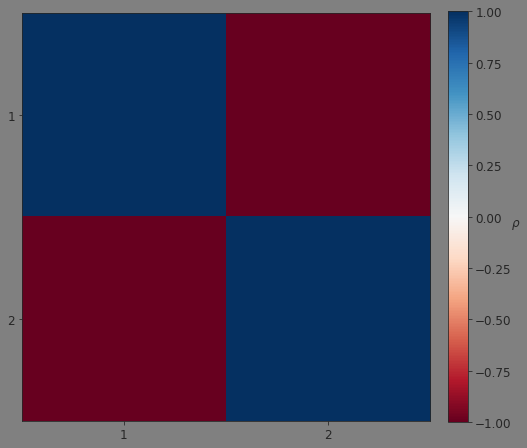

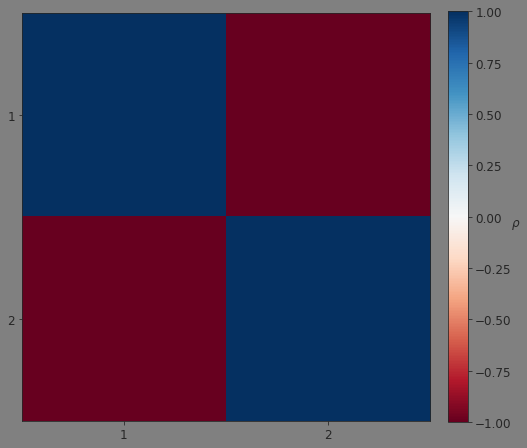

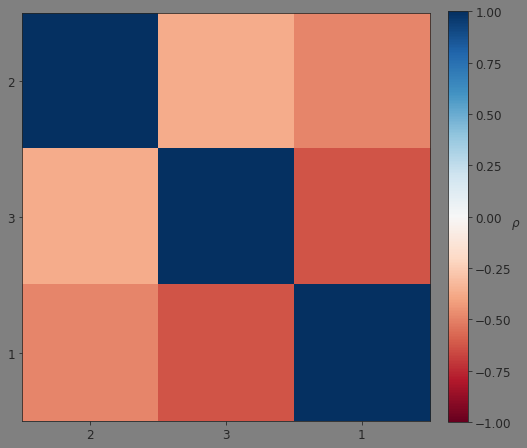

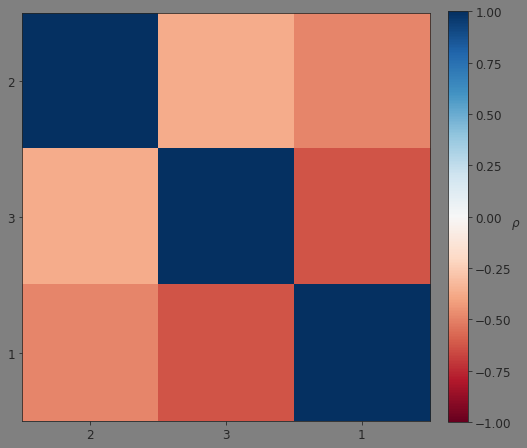

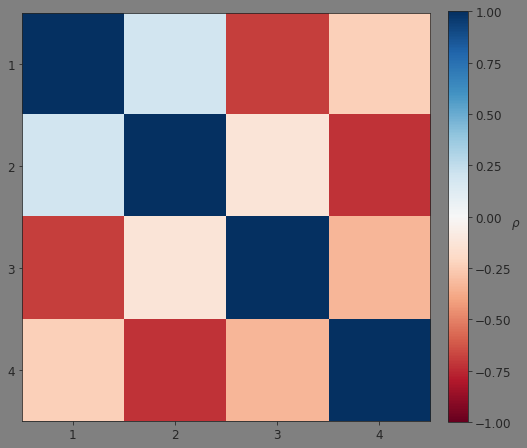

...

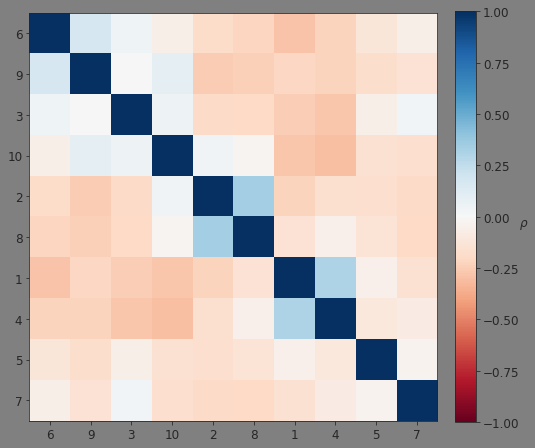

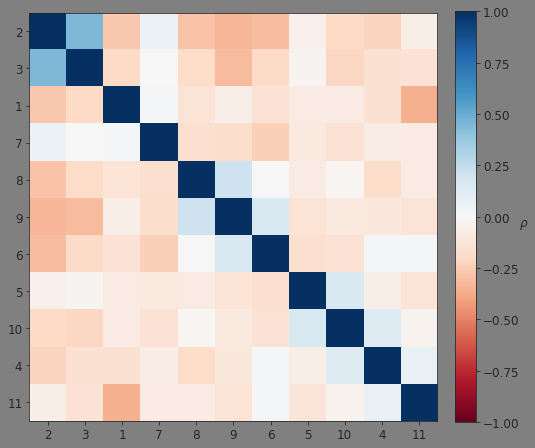

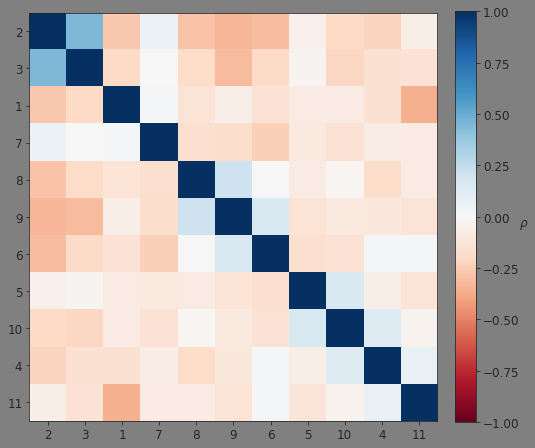

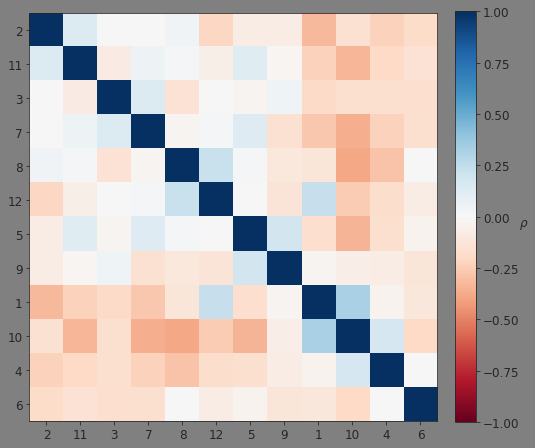

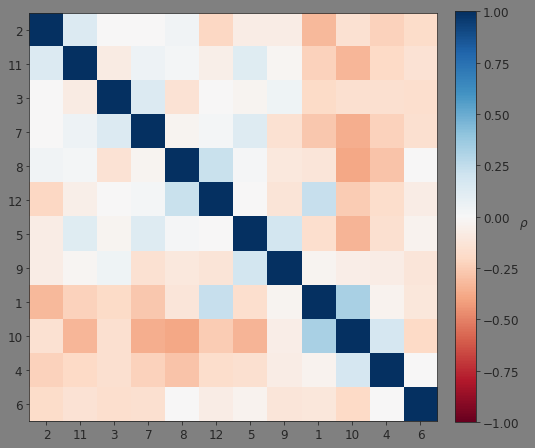

In [23]:
#model and inference
run_label='all_model_sigma0'
meta_data_names=['partisanship',
             'partyvote',
             'caruse',
             'livingenv',
             'agedec',
             'sex',
             'prov']
model_str="~ "+' + '.join(meta_data_names)
Krange=np.arange(2,13)
numseeds=2

#run over response types
st=time.time()
for restype in restypelist:
    
    #select data
    resp_data=fdf.loc[fdf.restype==restype,['id','res','resclean']+meta_data_names].copy().reset_index(drop=True)
    
    #set model and inference parameters
    batch_params={}
    batch_params['batch_name']=restype + "_reponses_" + run_label
    batch_params['model_str']=model_str
    batch_params['all_meta_data_names']=meta_data_names
    batch_params['sigma_prior']=0 #0 for uniform prior, 1 enforces hard 0-correlation constraint
    batch_params['seedlist']=range(1,numseeds+1)
    batch_params['Krange']=Krange

    pre_process_stm(resp_data)
    
    batch_run_and_save(batch_params)#,plot_flag=False)
print('took '+str(time.time()-st))

## Top words and responses

Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
Removing 585 of 1281 terms (585 of 9840 tokens) due to frequency 
Removing 5 Documents with No Words 
Your corpus now has 1295 documents, 696 terms and 9255 tokens.['mu', 'sigma', 'beta', 'settings', 'vocab', 'convergence', 'theta', 'eta', 'invsigma', 'time', 'version']


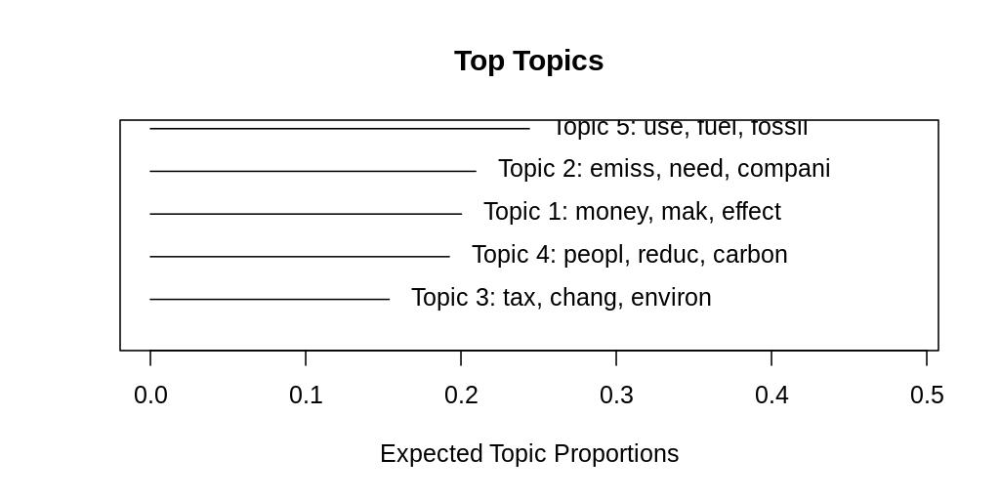

support_reponses_all_model_sigma0_K_5_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: money, mak, effect, must, caus, govern, warm, global, incent, industri

• "Peut faire réagir sur le problème même si c'est une lois pour paraître bien puisque les effets ne sont pas si grand et les provinces pas très receptive"
• "Je suis ambivalent. Si la taxe ne s'applique pas partout cela ne sert à rien. La réduction du carbone doit venir des provinces. Comment par exemple le fédéral ou le Québec peut poser un choix comme ce"
• "I believe it will reduce waste of it, however, the money collected in taxes is being incorrectly spent.  As an example, Edmonton is building LRT with the funds, but the line they are building is not t"
• "There seems to be a misnomer about the actual feasibility of sustained long term dependence of natural resources for economic usage.  The more tactile and logical step forward is to reduce our depende"
• "indirectly it affects 

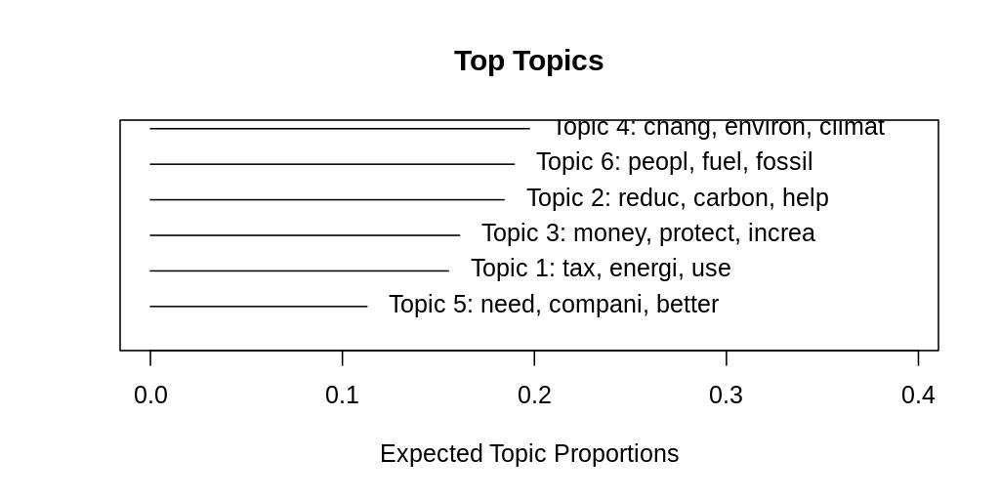

support_reponses_all_model_sigma0_K_6_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: tax, energi, use, support, sourc, like, forc, industri, incent, also

• "C'est taxe pigouvienne: on doit taxer pour faire baisser la demande et investir les revenus de cette taxe dans la transition énergétique."
• "Individuals and businesses need to switch to renewable energy sources. If there is cost pressure due to carbon tax then perhaps people will be forced to use cleaner energy sources."
• "À la condition que cette taxe puisse servir au développement d'énergie verte."
• "so we can collect and use tax money to fund and support clean energy projects"
• "la taxe devra servir a developper des energies propres ,vertes"

topic 2: reduc, carbon, help, emiss, price, way, mak, cost, put, effect

• "It may help to keep our carbon footprint small."
• "I think putting a price on carbon emissions is a small way of reminding people how much they are contributing (

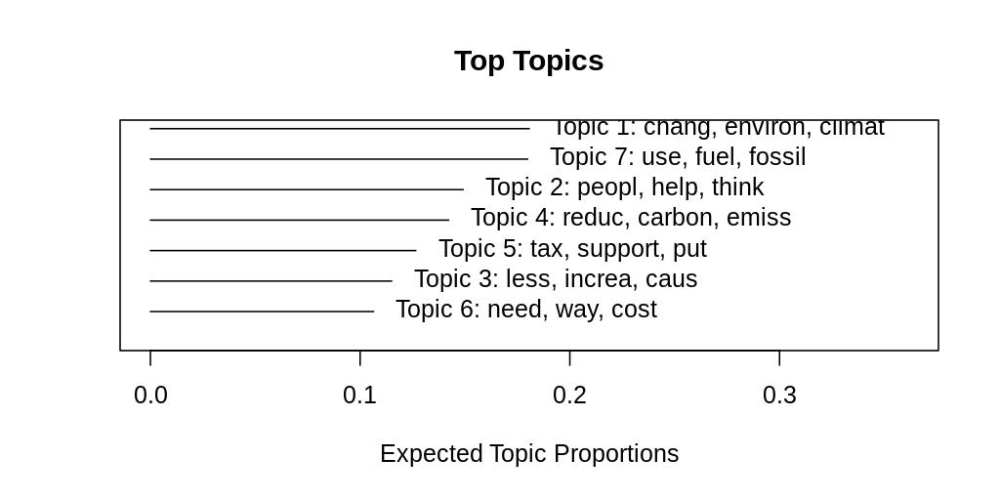

support_reponses_all_model_sigma0_K_7_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: chang, environ, climat, pollut, pay, effect, protect, product, earth, agr

• "L'impact positif principal est la conscientisation du public auprès de l'enjeu environnemental. Par contre, une telle politique a également une grande part de tord en affectant plus fortement les pers"
• "je suis d'accord si cette mesure est appliquée équitablement aux entreprises, et permet vraiment d'améliorer la situation au niveau de la pollution industrielle. Que les grands pollueurs soient forcés"
• "To protect climate changes and to improved the situations we are leaving in"
• "We have to address climate change and set an example for the rest of the world.  Increasing the price of carbon pollution is the best way to do this, according to climate experts and economists"
• "Pour que polluer ne soit plus un geste gratuit et sans conséquence"

topic 2: peopl, help, think, pric

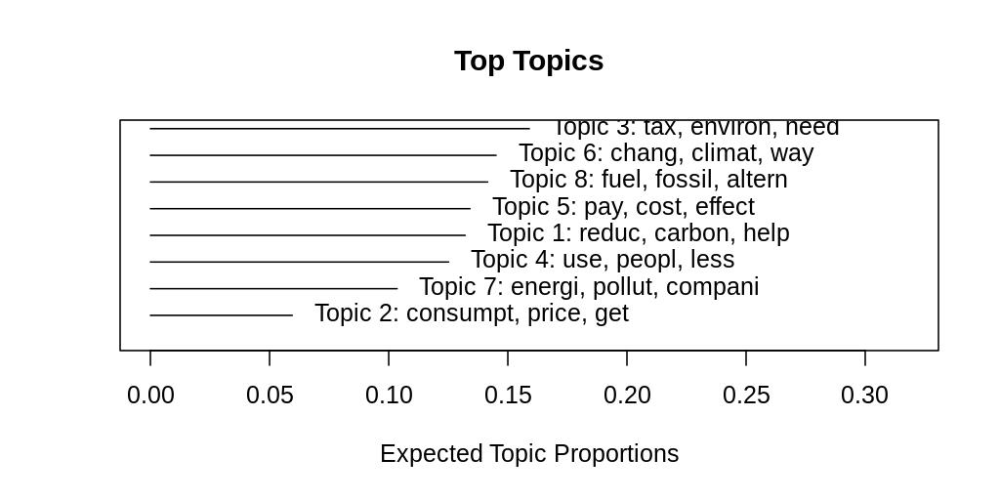

support_reponses_all_model_sigma0_K_8_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: reduc, carbon, help, emiss, price, put, someth, work, also, mean

• "We are at a critical point in time where if something drastic isn't done immediately there won't be anyone left in ten years. So doing whatever we can to try and delay if not prevent this end is extre"
• "Because eventually it will help somewhat in reducing carbon output."
• "Reduce carbon footprint - I don’t mind to pay extra if it means a more concentrated effort to reduce within the popultion"
• "Unfortunately everyone needs fuel for their vehicles so no matter what everyone will pay the prices whether there is a fee or a tax. In the end it would benifit and aid to help reduce carbon emissions"
• "personally the provincial rebate means we're actually a few dollars better off.  There's evidence that carbon pricing does reduce emmissions"

topic 2: consumpt, price, get, work, decrea, eff

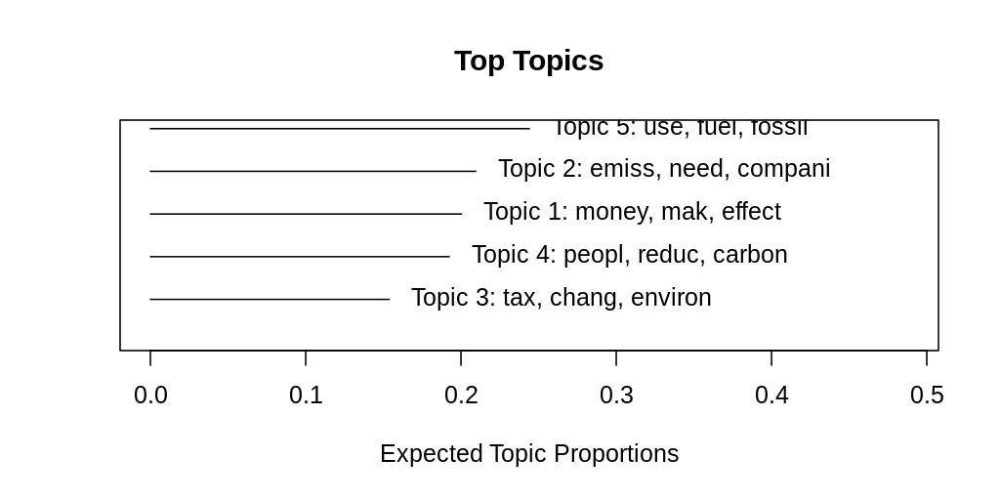

support_reponses_all_model_sigma0_K_5_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: money, mak, effect, must, caus, govern, warm, global, incent, industri

• "Peut faire réagir sur le problème même si c'est une lois pour paraître bien puisque les effets ne sont pas si grand et les provinces pas très receptive"
• "Je suis ambivalent. Si la taxe ne s'applique pas partout cela ne sert à rien. La réduction du carbone doit venir des provinces. Comment par exemple le fédéral ou le Québec peut poser un choix comme ce"
• "I believe it will reduce waste of it, however, the money collected in taxes is being incorrectly spent.  As an example, Edmonton is building LRT with the funds, but the line they are building is not t"
• "There seems to be a misnomer about the actual feasibility of sustained long term dependence of natural resources for economic usage.  The more tactile and logical step forward is to reduce our depende"
• "indirectly it affects 

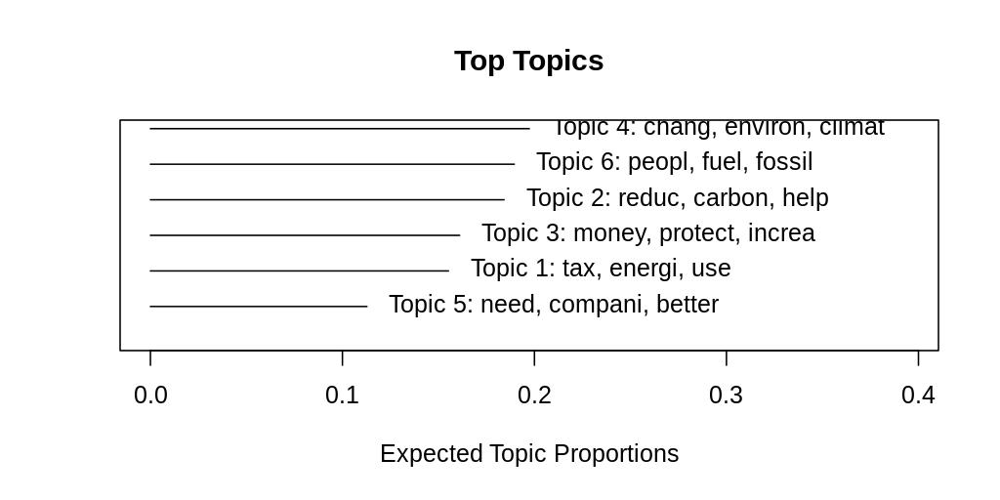

support_reponses_all_model_sigma0_K_6_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: tax, energi, use, support, sourc, like, forc, industri, incent, also

• "C'est taxe pigouvienne: on doit taxer pour faire baisser la demande et investir les revenus de cette taxe dans la transition énergétique."
• "Individuals and businesses need to switch to renewable energy sources. If there is cost pressure due to carbon tax then perhaps people will be forced to use cleaner energy sources."
• "À la condition que cette taxe puisse servir au développement d'énergie verte."
• "so we can collect and use tax money to fund and support clean energy projects"
• "la taxe devra servir a developper des energies propres ,vertes"

topic 2: reduc, carbon, help, emiss, price, way, mak, cost, put, effect

• "It may help to keep our carbon footprint small."
• "I think putting a price on carbon emissions is a small way of reminding people how much they are contributing (

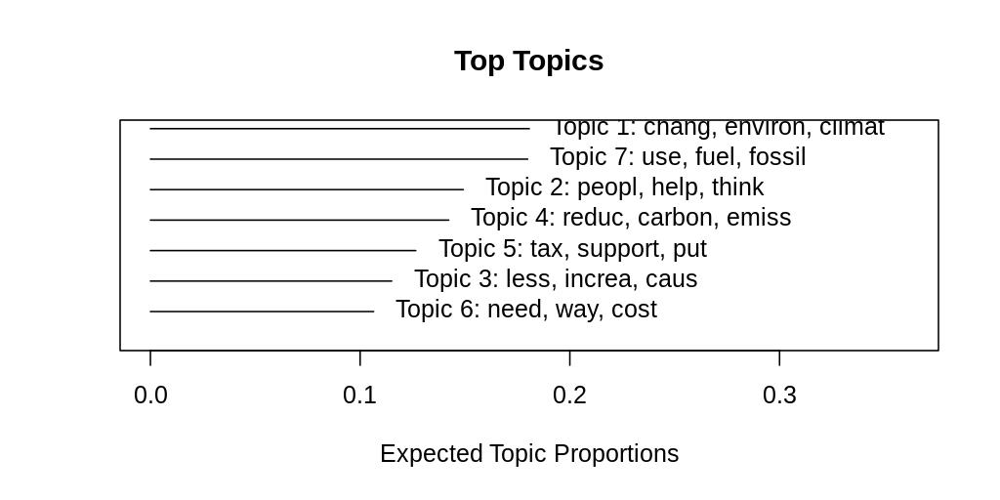

support_reponses_all_model_sigma0_K_7_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: chang, environ, climat, pollut, pay, effect, protect, product, earth, agr

• "L'impact positif principal est la conscientisation du public auprès de l'enjeu environnemental. Par contre, une telle politique a également une grande part de tord en affectant plus fortement les pers"
• "je suis d'accord si cette mesure est appliquée équitablement aux entreprises, et permet vraiment d'améliorer la situation au niveau de la pollution industrielle. Que les grands pollueurs soient forcés"
• "To protect climate changes and to improved the situations we are leaving in"
• "We have to address climate change and set an example for the rest of the world.  Increasing the price of carbon pollution is the best way to do this, according to climate experts and economists"
• "Pour que polluer ne soit plus un geste gratuit et sans conséquence"

topic 2: peopl, help, think, pric

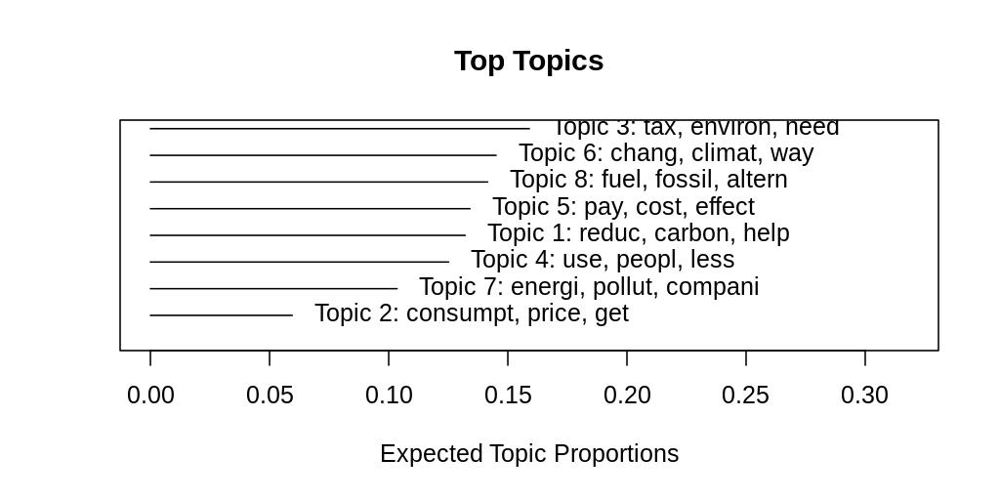

support_reponses_all_model_sigma0_K_8_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: reduc, carbon, help, emiss, price, put, someth, work, also, mean

• "We are at a critical point in time where if something drastic isn't done immediately there won't be anyone left in ten years. So doing whatever we can to try and delay if not prevent this end is extre"
• "Because eventually it will help somewhat in reducing carbon output."
• "Reduce carbon footprint - I don’t mind to pay extra if it means a more concentrated effort to reduce within the popultion"
• "Unfortunately everyone needs fuel for their vehicles so no matter what everyone will pay the prices whether there is a fee or a tax. In the end it would benifit and aid to help reduce carbon emissions"
• "personally the provincial rebate means we're actually a few dollars better off.  There's evidence that carbon pricing does reduce emmissions"

topic 2: consumpt, price, get, work, decrea, eff

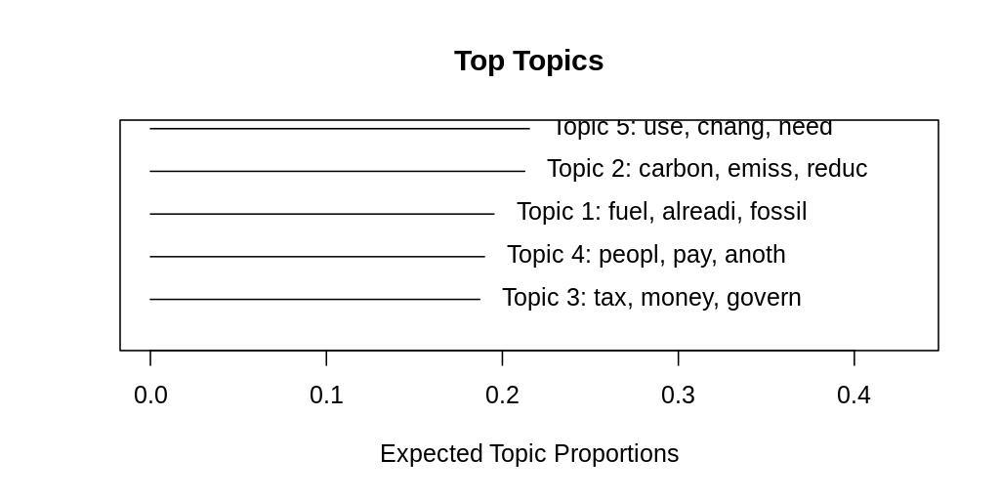

oppose_reponses_all_model_sigma0_K_5_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: fuel, alreadi, fossil, live, enough, climat, work, make, drive, heat

• "In Saskatchewan you have to drive, there is no option to walk to work or school when you live half an hour away. This may work for Quebec residents but not for major farming provinces."
• "Summers are warm, winters are cold.  This is normal in Canada.  Extremes in temp, on occasion, have happened for hundreds of years.  Fossil fuels are are waiting for extraction and are required and sh"
• "I live in Northern Quebec and we are required to heat our homes drive further distances, which results in much more dependence on fossil fuels."
• "Based on where you live Fossel fuels are required for heat light and travel"
• "a tax on fossil fuels will cripple the economy, it will cause all goods and services to get more expensive therefore causing every Canadian family more stress to make ends me

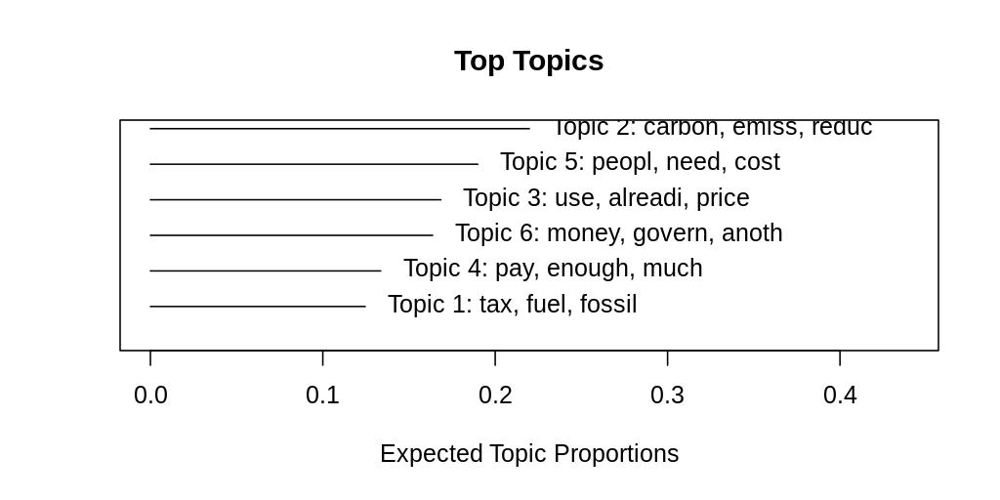

oppose_reponses_all_model_sigma0_K_6_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: tax, fuel, fossil, mani, wast, see, fund, well, done, agr

• "We have too many taxes already, there is already a tax on fuel, a tax on a tax is illegal in my opinion"
• "By taxing our primary source of fuel for basic transportation we elevate the cost of living for all Canadians.  I would like to see a study on a universal flat tax with elimination of all exemptions."
• "The carbon tax is a scam, the old joke about "taxing the air we breathe"... they finally figured out how to pull it off."
• "If you are to tax fossil fuels you have to have a clear agenda on using the tax dollars to transition from fossil fuel to cleaner energy.  This has not been the case with government.  No transparency"
• "I would agree to a revenue neutral system for co2 not for income balancing or a fund to be spent by politicians."

topic 2: carbon, emiss, reduc, canada, chang, clima

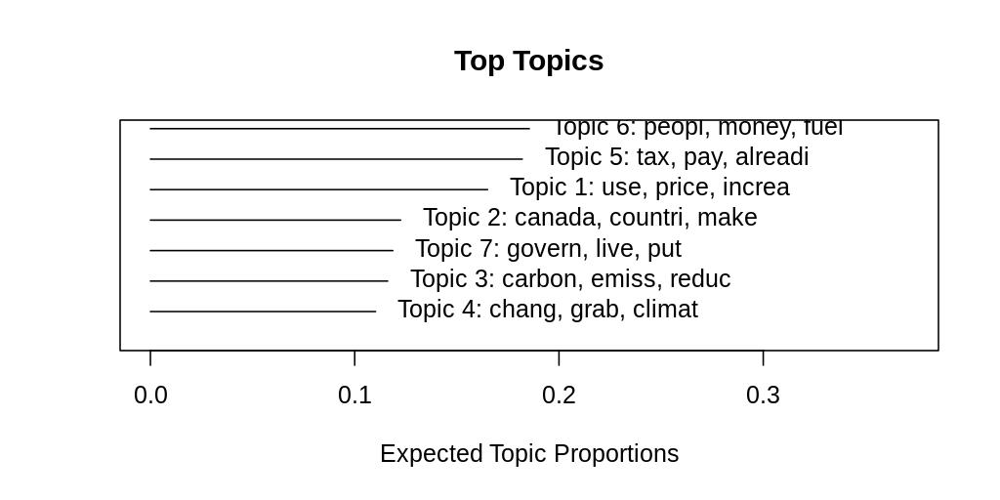

oppose_reponses_all_model_sigma0_K_7_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: use, price, increa, work, car, altern, electr, stop, energi, better

• "Nous sommes obligés de nous déplacer et d'utiliser l'essence. Nous serons pris en otage. Il faut plutôt privilégier des crédits d'impôt pour l'achat de véhicules électriques et l'installation de borne"
• "je trouve d'augmenter le prix, ils devraient inventer d'autre moyen de transport sans utilisation d'essence"
• "People still have to use their cars, they'll be annoyed by the increase in the gas' price, but they won't stop. If electric cars were the same price as other cars, though, they would most probably mak"
• "En dehors des grandes villes, la population a besoin d'une voiture pour se déplacer et les distances à parcourir sont très grandes en région.  L'augmentation du fardeau financier attribuable au pétrol"
• "En région nous n'avons pas le choix de nous déplacer en voiture et le 

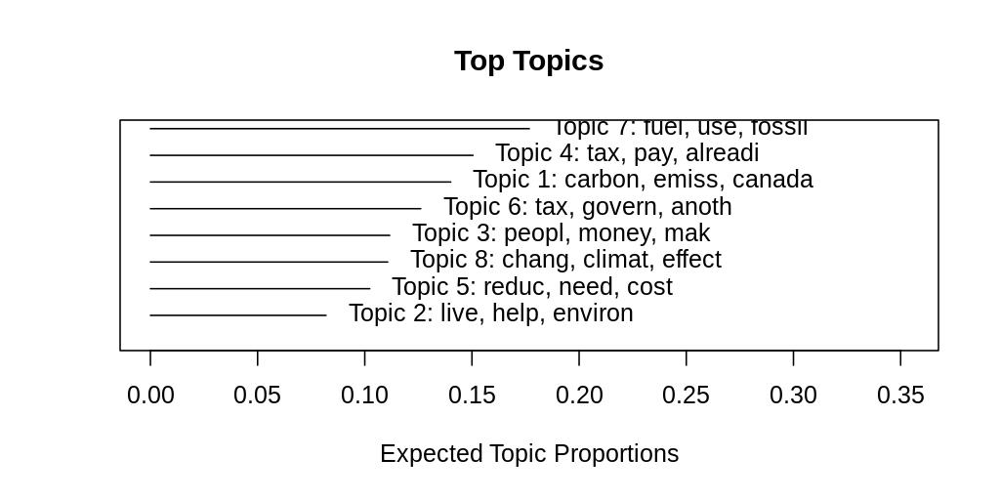

oppose_reponses_all_model_sigma0_K_8_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: carbon, emiss, canada, countri, world, pollut, compani, big, one, littl

• "Canada has some of the lowest carbon emissions in the world. Time to go after the worst offenders -China for one."
• "Canada’s emissions are a drop in the bucket compared to other countries.  Countries like China need to get on board as well. Canada cannot do it alone and should not be forced into it"
• "We produce very little emissions as compared to say...China, India US."
• "Is it really revenue neutral?  Oppose cap and trade schemes as this has been shown to be corrupt - The Carbon Rush documentary"
• "CO2 is a necessary element of earth's atmosphere to sustain life on earth. It is not a pollutant.  A carbon tax is just part of a wealth redistribution scheme."

topic 2: live, help, environ, make, problem, amount, rai, vehicl, rather, realli

• "I haven't seen anything that gives

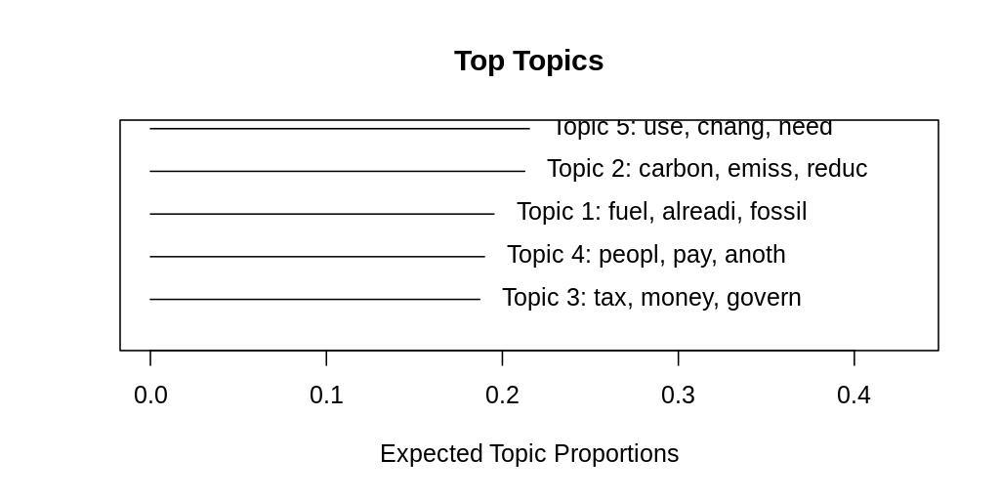

oppose_reponses_all_model_sigma0_K_5_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: fuel, alreadi, fossil, live, enough, climat, work, make, drive, heat

• "In Saskatchewan you have to drive, there is no option to walk to work or school when you live half an hour away. This may work for Quebec residents but not for major farming provinces."
• "Summers are warm, winters are cold.  This is normal in Canada.  Extremes in temp, on occasion, have happened for hundreds of years.  Fossil fuels are are waiting for extraction and are required and sh"
• "I live in Northern Quebec and we are required to heat our homes drive further distances, which results in much more dependence on fossil fuels."
• "Based on where you live Fossel fuels are required for heat light and travel"
• "a tax on fossil fuels will cripple the economy, it will cause all goods and services to get more expensive therefore causing every Canadian family more stress to make ends me

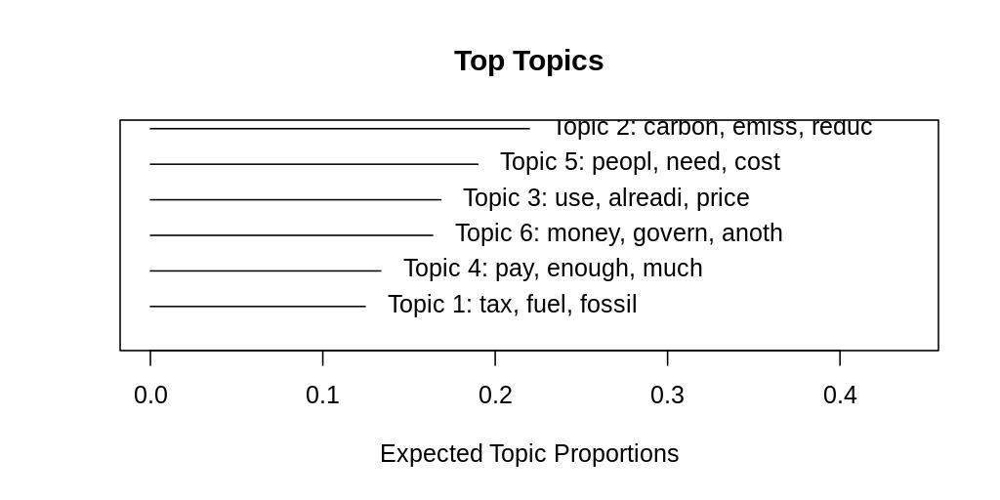

oppose_reponses_all_model_sigma0_K_6_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: tax, fuel, fossil, mani, wast, see, fund, well, done, agr

• "We have too many taxes already, there is already a tax on fuel, a tax on a tax is illegal in my opinion"
• "By taxing our primary source of fuel for basic transportation we elevate the cost of living for all Canadians.  I would like to see a study on a universal flat tax with elimination of all exemptions."
• "The carbon tax is a scam, the old joke about "taxing the air we breathe"... they finally figured out how to pull it off."
• "If you are to tax fossil fuels you have to have a clear agenda on using the tax dollars to transition from fossil fuel to cleaner energy.  This has not been the case with government.  No transparency"
• "I would agree to a revenue neutral system for co2 not for income balancing or a fund to be spent by politicians."

topic 2: carbon, emiss, reduc, canada, chang, clima

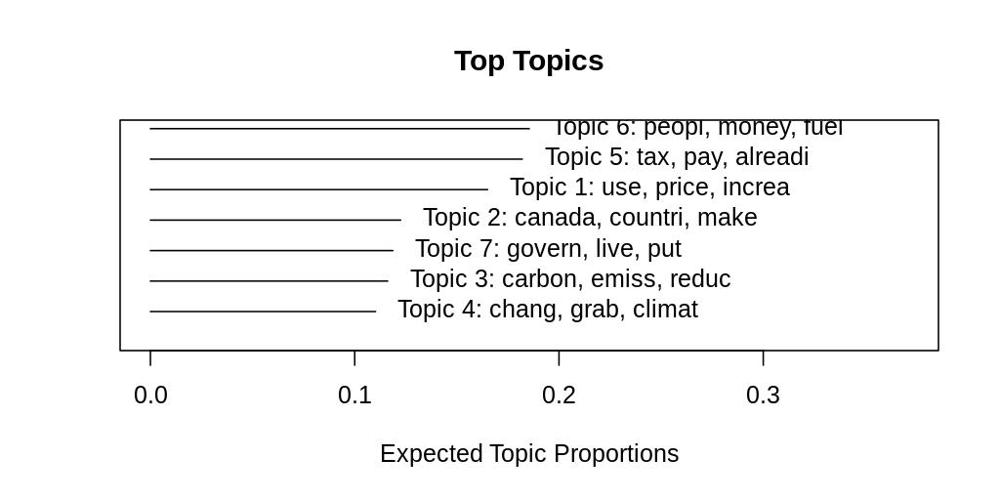

oppose_reponses_all_model_sigma0_K_7_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: use, price, increa, work, car, altern, electr, stop, energi, better

• "Nous sommes obligés de nous déplacer et d'utiliser l'essence. Nous serons pris en otage. Il faut plutôt privilégier des crédits d'impôt pour l'achat de véhicules électriques et l'installation de borne"
• "je trouve d'augmenter le prix, ils devraient inventer d'autre moyen de transport sans utilisation d'essence"
• "People still have to use their cars, they'll be annoyed by the increase in the gas' price, but they won't stop. If electric cars were the same price as other cars, though, they would most probably mak"
• "En dehors des grandes villes, la population a besoin d'une voiture pour se déplacer et les distances à parcourir sont très grandes en région.  L'augmentation du fardeau financier attribuable au pétrol"
• "En région nous n'avons pas le choix de nous déplacer en voiture et le 

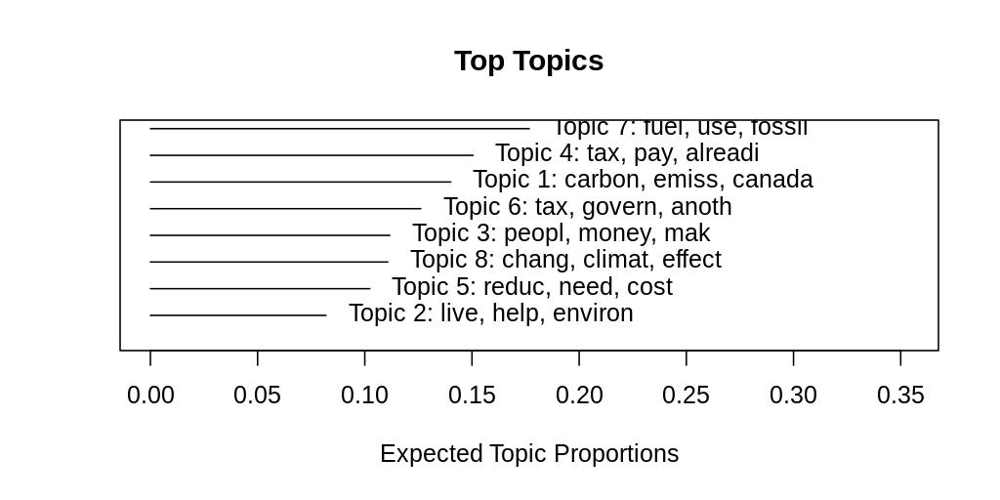

oppose_reponses_all_model_sigma0_K_8_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: carbon, emiss, canada, countri, world, pollut, compani, big, one, littl

• "Canada has some of the lowest carbon emissions in the world. Time to go after the worst offenders -China for one."
• "Canada’s emissions are a drop in the bucket compared to other countries.  Countries like China need to get on board as well. Canada cannot do it alone and should not be forced into it"
• "We produce very little emissions as compared to say...China, India US."
• "Is it really revenue neutral?  Oppose cap and trade schemes as this has been shown to be corrupt - The Carbon Rush documentary"
• "CO2 is a necessary element of earth's atmosphere to sustain life on earth. It is not a pollutant.  A carbon tax is just part of a wealth redistribution scheme."

topic 2: live, help, environ, make, problem, amount, rai, vehicl, rather, realli

• "I haven't seen anything that gives

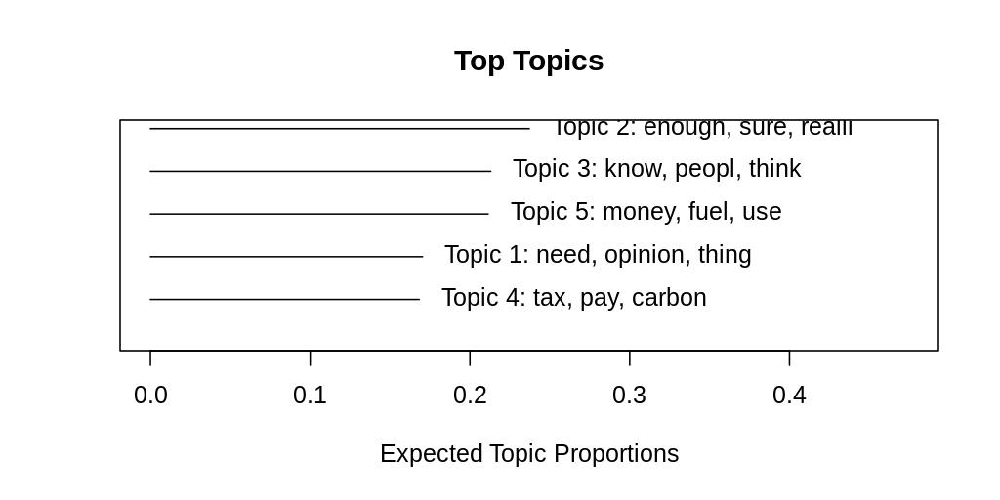

notsure_reponses_all_model_sigma0_K_5_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: need, opinion, thing, get, end, pollut, research, may, bad, caus

• "The consumer pays more, the industries use the same amount and the environmental effects/pollution is just as bad or worse than before.  I would like to be able to afford less polluting services and p"
• "I do support it but ultimately I think we need to take the pressure tax wise off the backs of average Canadian households and start taxing larger corporations and businesses higher rates instead."
• "Every policy comes with pros and cons. Sometimes what we deicde to be the most appropriate policy can turn out to be the opposite; sometimes what we think is the right thing can turn out to be less be"
• "I'd need to do more research to see if there are more pros or cons!"
• "I haven't heard the arguments, and therefore, still undecided"

topic 2: enough, sure, realli, inform, much, say, ide

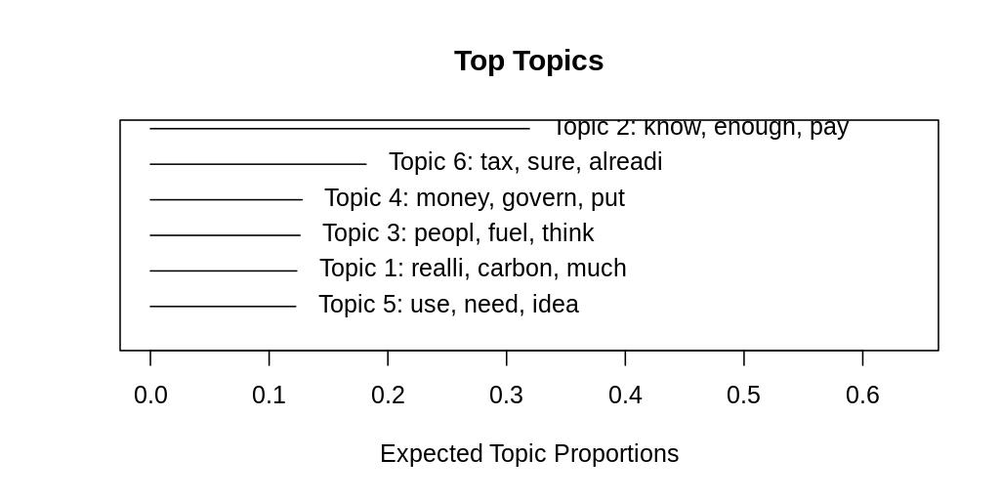

notsure_reponses_all_model_sigma0_K_6_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: realli, carbon, much, emiss, abl, read, bad, like, support, live

• "This is because not everyone might be able to afford it"
• "It doesn't really impact me at the moment so I personally don't support or oppose it."
• "je n'écoute plus et ne lis presque plus les nouvelles : Trop de négativité et d'un mandat àl'autre, chaque gouvernement nous vole un peu plus, fait de mauvais choix, c'est décourageant.  Comme je ne p"
• "Because co2 is an emission that causes global warming"
• "I would say I am torn between both. Although I support any means of reducing carbon emissions in Canada, paying extra tax would indefinitely affect those living in a much poorer condition."

topic 2: know, enough, pay, inform, opinion, subject, much, say, mak, issu

• "Je ne me suis pas informé sur le sujet alors je n'en connais pas spécialement les enjeux principaux."
• "do not know

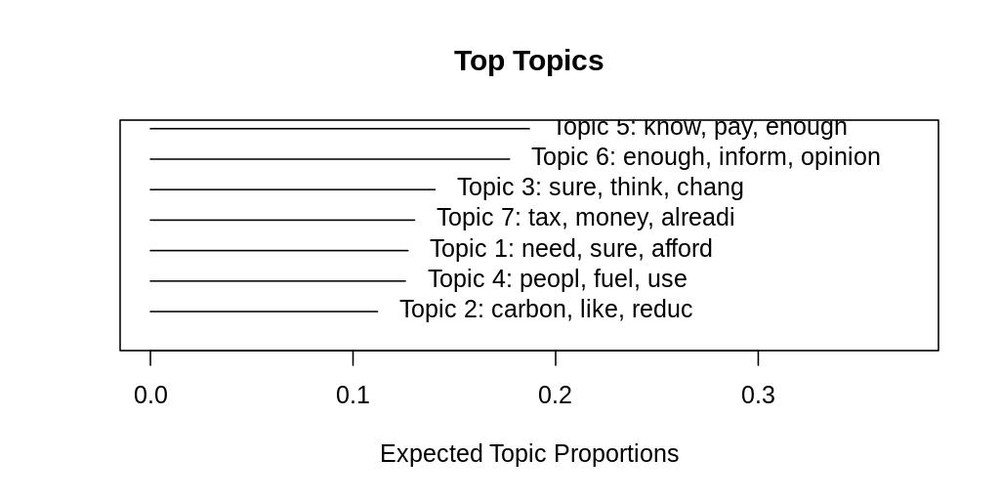

notsure_reponses_all_model_sigma0_K_7_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: need, sure, afford, help, thing, get, work, research, abl, good

• "Not sure if it's worth it."
• "I do support it but ultimately I think we need to take the pressure tax wise off the backs of average Canadian households and start taxing larger corporations and businesses higher rates instead."
• "I'd need to do more research to see if there are more pros or cons!"
• "i need more information about this to decide"
• "I do not know a great deal about the research that this decision was based on."

topic 2: carbon, like, reduc, anoth, increa, emiss, pollut, reason, end, big

• "I can see the benefits of having the offenders pay for their pollution, however it stands to reason that increased levy will be passed on directly to the end consumer which means I will end up paying"
• "It?s not going to reduce emissions. It?s just a tax grab. I?d be shocked if stuff 

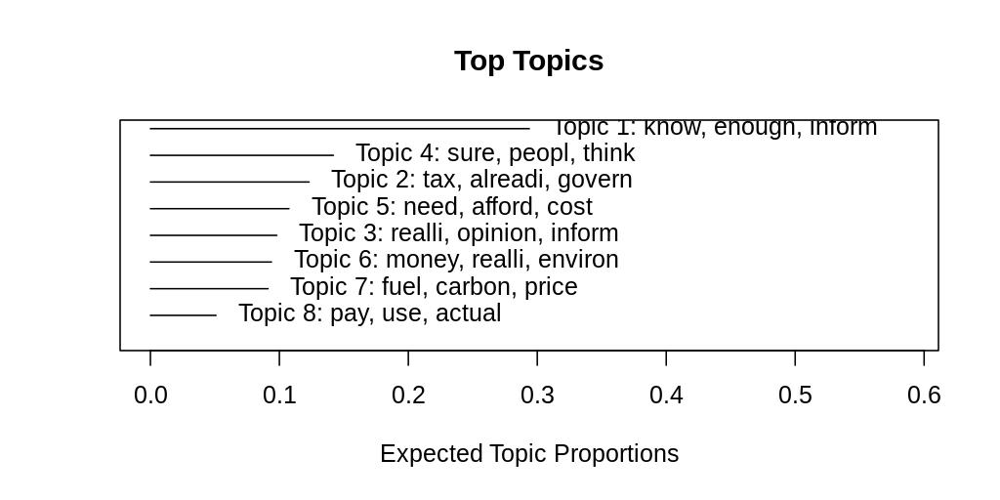

notsure_reponses_all_model_sigma0_K_8_seed_1
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: know, enough, inform, much, mak, opinion, say, subject, read, research

• "don't know enough about the whole situation to make an informed comment"
• "Not familiar Dont know enough about this"
• "je ne connais rien sur ce sujet, ça ne m'intéresse pas du tout"
• "I’m not informed enough to make a choice other than what I have stated"
• "I don't have enough information or knowledge about this topic."

topic 2: tax, alreadi, govern, anoth, idea, way, one, like, mak, news

• "le gouvernement devrait subventionner l'éléctrification des transports et les technologies à l'hydrogène plutôt que de taxer davantage ce qui est déjà suffisement taxer"
• "On va se faire avoir d'une manière une d'une autre avec ou sans taxe. Et onnpaxe assez de taxe comme ça."
• "Je trouve que les citoyens sont déjà assez taxés"
• "I am already paying a carbon tax on utility usage and pl

/tmp/ipykernel_3808943/2259033841.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=pl.subplots(1,2,figsize=(2*3.5,3.5))


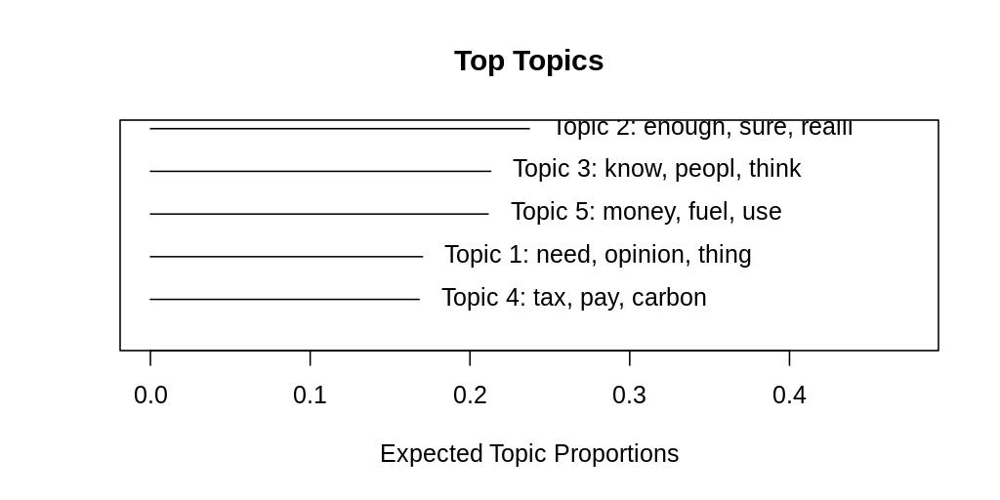

notsure_reponses_all_model_sigma0_K_5_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: need, opinion, thing, get, end, pollut, research, may, bad, caus

• "The consumer pays more, the industries use the same amount and the environmental effects/pollution is just as bad or worse than before.  I would like to be able to afford less polluting services and p"
• "I do support it but ultimately I think we need to take the pressure tax wise off the backs of average Canadian households and start taxing larger corporations and businesses higher rates instead."
• "Every policy comes with pros and cons. Sometimes what we deicde to be the most appropriate policy can turn out to be the opposite; sometimes what we think is the right thing can turn out to be less be"
• "I'd need to do more research to see if there are more pros or cons!"
• "I haven't heard the arguments, and therefore, still undecided"

topic 2: enough, sure, realli, inform, much, say, ide

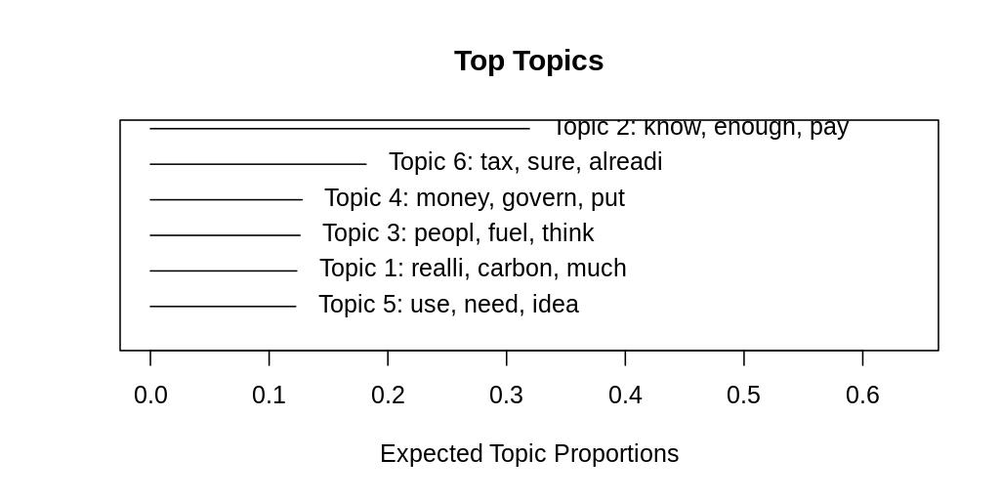

notsure_reponses_all_model_sigma0_K_6_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: realli, carbon, much, emiss, abl, read, bad, like, support, live

• "This is because not everyone might be able to afford it"
• "It doesn't really impact me at the moment so I personally don't support or oppose it."
• "je n'écoute plus et ne lis presque plus les nouvelles : Trop de négativité et d'un mandat àl'autre, chaque gouvernement nous vole un peu plus, fait de mauvais choix, c'est décourageant.  Comme je ne p"
• "Because co2 is an emission that causes global warming"
• "I would say I am torn between both. Although I support any means of reducing carbon emissions in Canada, paying extra tax would indefinitely affect those living in a much poorer condition."

topic 2: know, enough, pay, inform, opinion, subject, much, say, mak, issu

• "Je ne me suis pas informé sur le sujet alors je n'en connais pas spécialement les enjeux principaux."
• "do not know

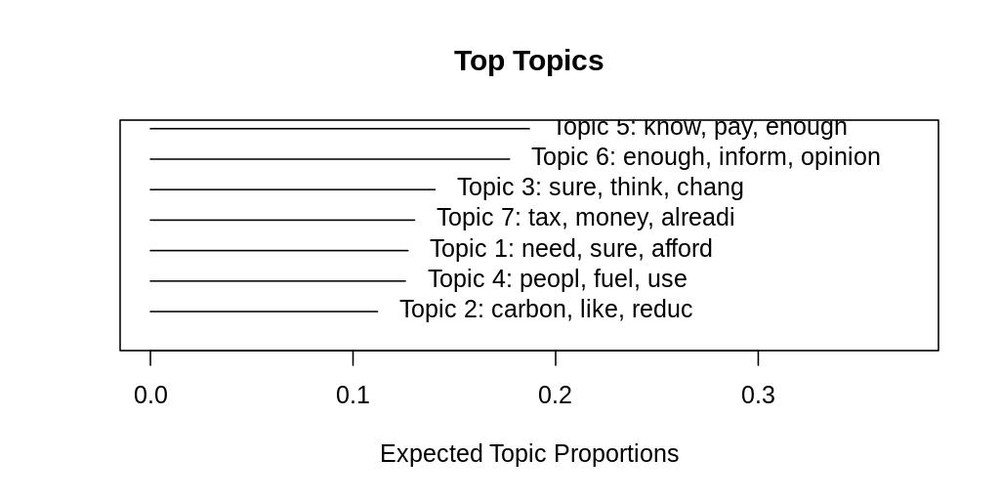

notsure_reponses_all_model_sigma0_K_7_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: need, sure, afford, help, thing, get, work, research, abl, good

• "Not sure if it's worth it."
• "I do support it but ultimately I think we need to take the pressure tax wise off the backs of average Canadian households and start taxing larger corporations and businesses higher rates instead."
• "I'd need to do more research to see if there are more pros or cons!"
• "i need more information about this to decide"
• "I do not know a great deal about the research that this decision was based on."

topic 2: carbon, like, reduc, anoth, increa, emiss, pollut, reason, end, big

• "I can see the benefits of having the offenders pay for their pollution, however it stands to reason that increased levy will be passed on directly to the end consumer which means I will end up paying"
• "It?s not going to reduce emissions. It?s just a tax grab. I?d be shocked if stuff 

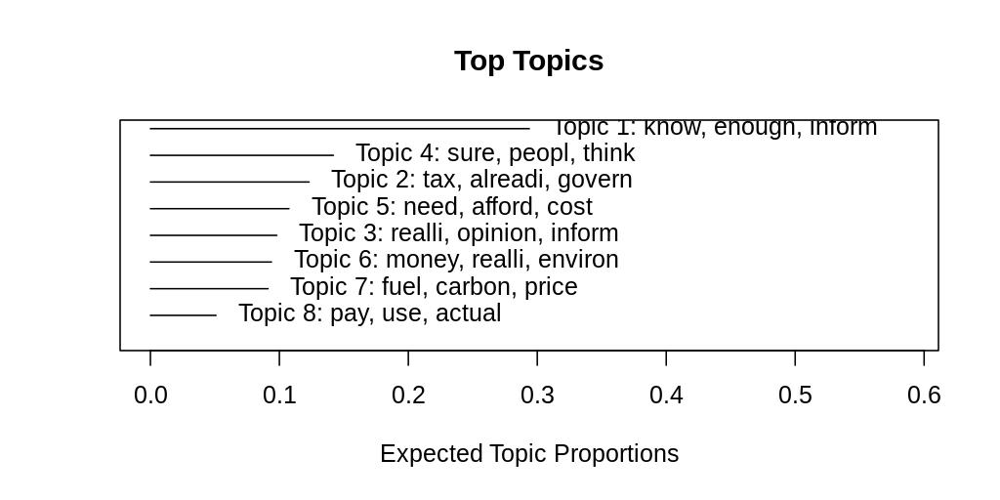

notsure_reponses_all_model_sigma0_K_8_seed_2
model: ~ partisanship + partyvote + caruse + livingenv + agedec + sex + prov

topic 1: know, enough, inform, much, mak, opinion, say, subject, read, research

• "don't know enough about the whole situation to make an informed comment"
• "Not familiar Dont know enough about this"
• "je ne connais rien sur ce sujet, ça ne m'intéresse pas du tout"
• "I’m not informed enough to make a choice other than what I have stated"
• "I don't have enough information or knowledge about this topic."

topic 2: tax, alreadi, govern, anoth, idea, way, one, like, mak, news

• "le gouvernement devrait subventionner l'éléctrification des transports et les technologies à l'hydrogène plutôt que de taxer davantage ce qui est déjà suffisement taxer"
• "On va se faire avoir d'une manière une d'une autre avec ou sans taxe. Et onnpaxe assez de taxe comme ça."
• "Je trouve que les citoyens sont déjà assez taxés"
• "I am already paying a carbon tax on utility usage and pl

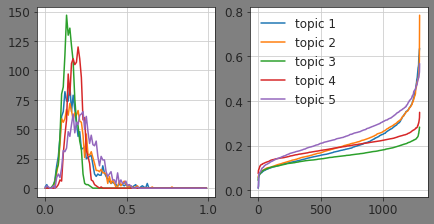

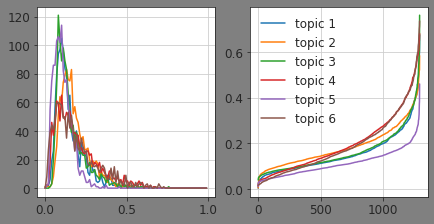

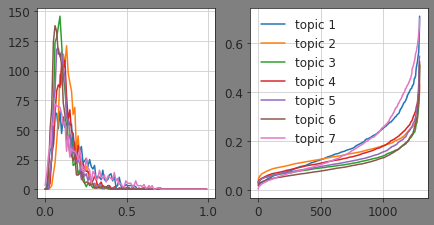

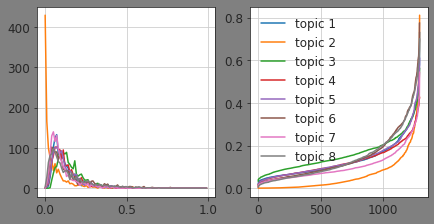

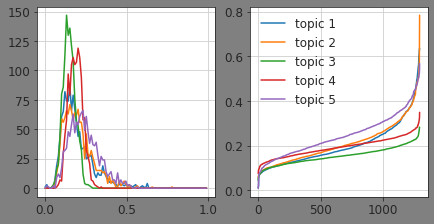

...

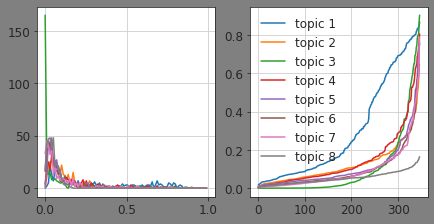

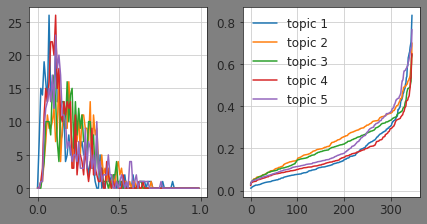

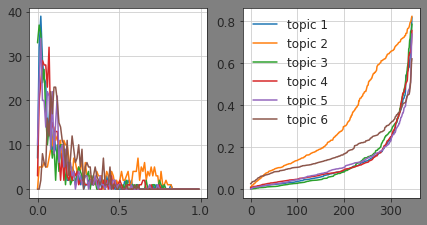

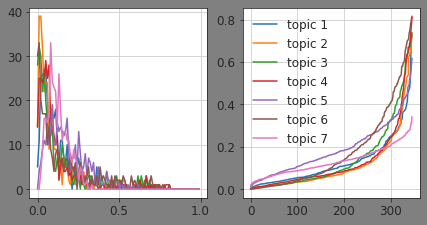

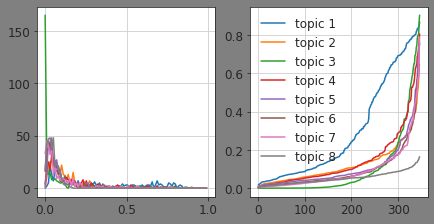

In [25]:
run_label='all_model_sigma0'

#specify batch
for restype in restypelist:
    batch_name = restype + "_reponses_" + run_label
    params=np.load(models_dir+batch_name+'.npy',allow_pickle=True).item()

    #run preprocessing on data to have access to text responses (produces 'processsed_corpus' in R)
    resp_data=fdf.loc[fdf.restype==restype,['id','res','resclean']+params['all_meta_data_names']].copy().reset_index(drop=True)
    pre_process_stm(resp_data)

    #load specific model output
    for seed in [1,2]:
        for K in [5,6,7,8]:
            run_name=params['batch_name']+'_K_'+str(K)+'_seed_'+str(seed)
            robjects.r('load(file = "'+models_dir+run_name+'.rda")')
            fitobj=dict(robjects.r.fitobj.items())
            print(list(fitobj.keys()))

            #plot prevalence
            fig,ax=pl.subplots(1,2,figsize=(2*3.5,3.5))
            binvec=np.linspace(0,1,100)
            for topic_id in range(fitobj['theta'].shape[1]):
                tmpdat=fitobj['theta'][:,topic_id]
                counts,bins=np.histogram(tmpdat,bins=binvec)
                ax[0].plot(bins[:-1],counts)
                ax[1].plot(np.sort(tmpdat),label='topic '+str(topic_id+1))
                ax[1].legend(frameon=False)
            fig.savefig(fig_dir+run_name+"_prevalence_rank.png", transparent=True,bbox_inches="tight",dpi=300)

            #top words
            with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=512, res=150) as img:
                robjects.r.plot(robjects.globalenv["fitobj"])
            img_obj=Image(data=img.getvalue())
            open(fig_dir+run_name+"_toptopics", "wb").write(img_obj.data)
            display(img_obj)

            shownwords=10
            pd.options.display.max_colwidth=100
            test1=robjects.r('labelTopics(fitobj,n='+str(shownwords)+')')
            topicwords=pd.Series(np.asarray(test1.rx[1][0]).reshape((shownwords,K)).T.tolist(),index=range(1,K+1))
            topicwords.index.name='topicid'

            #top responses
            showndocs=5
            tmp=robjects.r('findThoughts(fitobj,texts='+\
                   'processed_corpus$meta$res'+\
                   ',n='+str(showndocs)+')')
            top_responses={}
            for topic_id,indvec in enumerate(dict(tmp.items())['index']):
                top_responses["topic "+str(topic_id+1)]=[robjects.r('processed_corpus$meta$res['+str(ind)+']')[0] for ind in indvec]
            #     print(robjects.r('processed_corpus$meta['+str(np.argmax(fitobj['theta'][:,topicid-1])+1)+',]$res')) #check same

            with open(data_dir+run_name+'_top_responses.txt','w') as f:
                f.write(run_name+'\n')
                f.write('model: '+model_str+'\n\n')  
                for topic,responses in top_responses.items():
                    f.write(topic+': '+''.join([str(word)+', ' for word in topicwords[int(topic[-1])]])[:-2]+'\n') 
                    f.write('\n')
                    for response in responses:
                        f.write(u'\u2022 "'+response+'"\n')
                    f.write('\n')
            with open(data_dir+run_name+'_top_responses.txt') as f:     
                print(f.read())

# Pick out a single model and infer

In [30]:
run_label='all_model_sigma0'
restype='oppose'
K=7
seed=1
batch_name = restype + "_reponses_" + run_label
params=np.load(models_dir+batch_name+'.npy',allow_pickle=True).item()
params['all_meta_data_names']=meta_data_names
run_name=params['batch_name']+'_K_'+str(K)+'_seed_'+str(seed)
robjects.r('load(file = "'+models_dir+run_name+'.rda")')

resp_data=fdf.loc[fdf.restype==restype,['id','res','resclean']+params['all_meta_data_names']].copy().reset_index(drop=True)
pre_process_stm(resp_data)
#run effect
stm_effects=robjects.r(
    'stm_effects <- estimateEffect(formula = 1:'+str(K)+' '+params['model_str']+', '+\
                              'stmobj = fitobj,'+\
                              'metadata = processed_corpus$meta,'+\
                              'uncertainty = "Global")'
    );
robjects.r('print(summary(stm_effects))')

Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
Removing 777 of 1683 terms (777 of 13475 tokens) due to frequency 
Removing 5 Documents with No Words 
Your corpus now has 1567 documents, 906 terms and 12698 tokens.
Call:
estimateEffect(formula = 1:7 ~ partisanship + partyvote + caruse + 
    livingenv + agedec + sex + prov, stmobj = fitobj, metadata = processed_corpus$meta, 
    uncertainty = "Global")


Topic 1:

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)           0.1226449  0.0994713   1.233 0.217776    
partisanshipnone     -0.0110394  0.0151114  -0.731 0.465174    
partisanshipnotsure  -0.0113546  0.0161077  -0.705 0.480969    
partisanshipright    -0.0180677  0.0157365  -1.148 0.251088    
partyvoteno vote      0.0202398  0.0131325   1.541 0.123474    
partyvoteprogressive  0.0392687  0.0104932   3.742 0.000189 ***
carusedriver     

sexMale              -0.0194319  0.0085529  -2.272  0.02323 *  
sexOther             -0.0262534  0.0785992  -0.334  0.73841    
provBC                0.0305769  0.0128421   2.381  0.01739 *  
provON                0.0521500  0.0123917   4.208 2.72e-05 ***
provQC                0.0731266  0.0151970   4.812 1.64e-06 ***
provSK                0.0057877  0.0101727   0.569  0.56948    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


Topic 6:

Coefficients:
                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)           0.167424   0.064234   2.606 0.009236 ** 
partisanshipnone      0.005139   0.010725   0.479 0.631912    
partisanshipnotsure   0.031855   0.012051   2.643 0.008294 ** 
partisanshipright    -0.015547   0.011545  -1.347 0.178310    
partyvoteno vote      0.037446   0.009643   3.883 0.000107 ***
partyvoteprogressive  0.010381   0.007612   1.364 0.172854    
carusedriver         -0.006255   0.012550  -0.498 0.618266    
carusenone         

call,[RTYPES.LANGSXP]
topics,[RTYPES.INTSXP]
tables,[RTYPES.VECSXP]


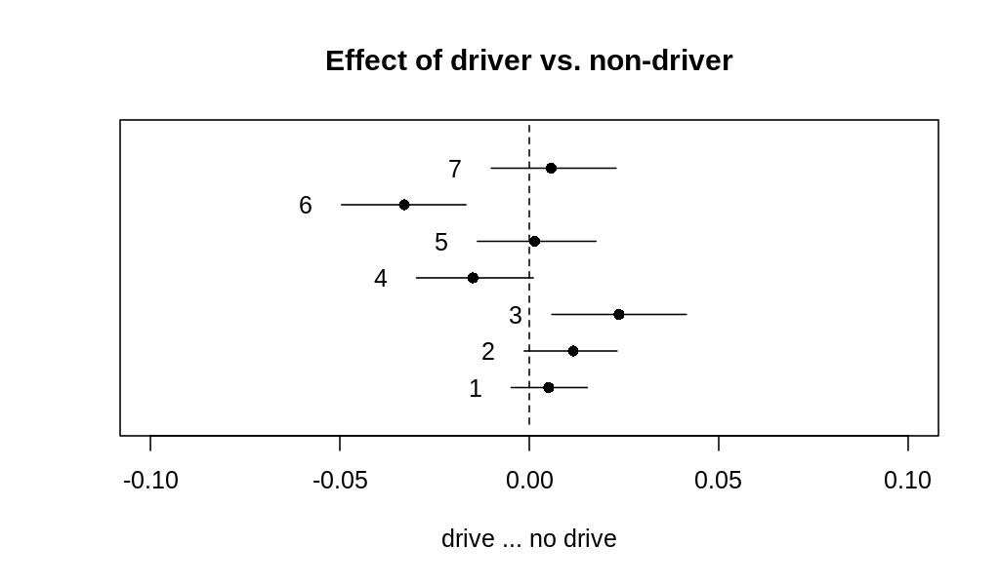

In [59]:
if False:
    plot_str=  'covariate = "partisanship",' +\
        'method = "difference",' +\
         'cov.value1 = "left",' +\
         'cov.value2 = "right",' +\
         'xlim = c(-0.1, 0.1),' +\
         'labeltype = "custom",' +\
         'main = "Effect of left vs. right",' +\
         'xlab = "left ... right")'
elif True:
    plot_str= 'covariate = "caruse",' +\
        'method = "difference",' +\
         'cov.value1 = "driver",' +\
         'cov.value2 = "none",' +\
         'xlim = c(-0.1, 0.1),' +\
         'labeltype = "custom",' +\
         'main = "Effect of driver vs. non-driver",' +\
         'xlab = "drive ... no drive")'
# else:
#     plot_str='method = "pointestimate",'
  
with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=600, res=150) as img:
    robjects.r(
        'plot(stm_effects,' +\
         'topics = 1:'+str(K)+',' +\
         'model = fitobj,' +\
        plot_str);
img_obj=Image(data=img.getvalue())
open(fig_dir+batch_name+'_'+str(K)+"cov_variation.jpeg", "wb").write(img_obj.data)
display(img_obj)

Extra:

## Run inference

In [54]:
yield_seed = lambda x: robjects.NULL if x==None else x
robjects.globalenv["fit"] = robjects.r.stm(
    documents=robjects.r("processed_corpus$documents"), 
    vocab=robjects.r("processed_corpus$vocab"), 
    K=8,#0, 
    prevalence=robjects.r('''~ partisanship'''),#c('partisanship','caruse')]"),robjects.r("partisanship'"),# + caruse',#
    max_em_its=max_em_its,
    data=robjects.r("processed_corpus$meta"),
    init_type=init_type, 
    seed=yield_seed(seed),
#     emtol=emtol,
#     verbose=verbose, 
#     reportevery=reportevery,
#     LDAbeta=LDAbeta, 
#     interactions=interactions,
#     ngroups=ngroups, 
#     gamma_prior=gamma_prior,
#     sigma_prior=sigma_prior, 
#     kappa_prior=kappa_prior,
    )

NameError: name 'max_em_its' is not defined

print topics as ranked word prevalence 

In [ ]:
robjects.r('findThoughts(fitobj,topics=7,texts=doc_df[-c(processed_corpus_temp$docs.removed,processed_corpus$docs.removed),]$resclean,n='+str(showndocs)+')')

In [147]:
robjects.r('load(file = "'+models_dir+batch_name+'_'+str(K)+'.rda")')

'fitobj'


In [148]:
fitobjcheck=dict(robjects.r.fitobj.items())
print(list(fitobjcheck.keys()))
print(len(fitobjcheck['vocab']))
# stmclean_dictionary=pd.Series(list(preprocessing_output['vocab']),name='word')
# stmclean_corpus=pd.DataFrame.from_records([doc for doc in preprocessing_output['documents'].items()],index=[0]).drop(0,axis=1)
# stmclean_corpus.index.name= None

['mu', 'sigma', 'beta', 'settings', 'vocab', 'convergence', 'theta', 'eta', 'invsigma', 'time', 'version']
696


In [153]:
print(len(fitobjcheck['theta']))

1295


In [155]:
resp_data=fdf.loc[fdf.restype==restype,['resclean']+meta_data_names].copy().reset_index(drop=True)
with localconverter(robjects.default_converter + pandas2ri.converter):
    robjects.globalenv['doc_df'] = robjects.conversion.py2rpy(resp_data)
    robjects.r("processed_corpus_temp = textProcessor(doc_df$resclean, metadata=doc_df, lowercase=TRUE)");
preprocessing_output=dict(robjects.r.processed_corpus_temp.items())
print(list(preprocessing_output.keys()))
print(len(preprocessing_output['documents']))
occurs_in_morethan=1
robjects.r(
    'processed_corpus = prepDocuments(processed_corpus_temp$documents,'+\
    'processed_corpus_temp$vocab,'+\
    'processed_corpus_temp$meta,'+\
    'lower.thresh='+str(occurs_in_morethan)+')')
processed_corpus=dict(robjects.r.processed_corpus.items())
print(list(processed_corpus.keys()))
print(len(processed_corpus['documents']))

Building corpus... 
Converting to Lower Case... 
Removing punctuation... 
Removing stopwords... 
Removing numbers... 
Stemming... 
Creating Output... 
['documents', 'vocab', 'meta', 'docs.removed']
1300
Removing 585 of 1281 terms (585 of 9840 tokens) due to frequency 
Removing 5 Documents with No Words 
Your corpus now has 1295 documents, 696 terms and 9255 tokens.['documents', 'vocab', 'meta', 'words.removed', 'docs.removed', 'tokens.removed', 'wordcounts']
1295


In [78]:
shownwords=10
pd.options.display.max_colwidth=100
test1=robjects.r('labelTopics(fitobj,n='+str(shownwords)+')')
topicwords=pd.Series(np.asarray(test1.rx[1][0]).reshape((shownwords,K)).T.tolist(),index=range(1,K+1))
topicwords.index.name='topicid'
topicwords



topicid
1            [chang, environ, help, climat, pollut, pay, effect, protect, must, earth]
2                     [peopl, think, price, mak, better, like, get, car, make, decrea]
3                [less, increa, caus, govern, anoth, save, drive, solut, take, import]
4    [reduc, carbon, emiss, money, compani, consumpt, warm, global, industri, product]
5                 [tax, support, put, good, planet, believ, may, also, toward, consum]
6                  [need, way, cost, hope, someth, futur, gener, work, thing, resourc]
7          [use, fuel, fossil, energi, altern, encourag, sourc, find, incent, develop]
dtype: object

Plot topic prevalence

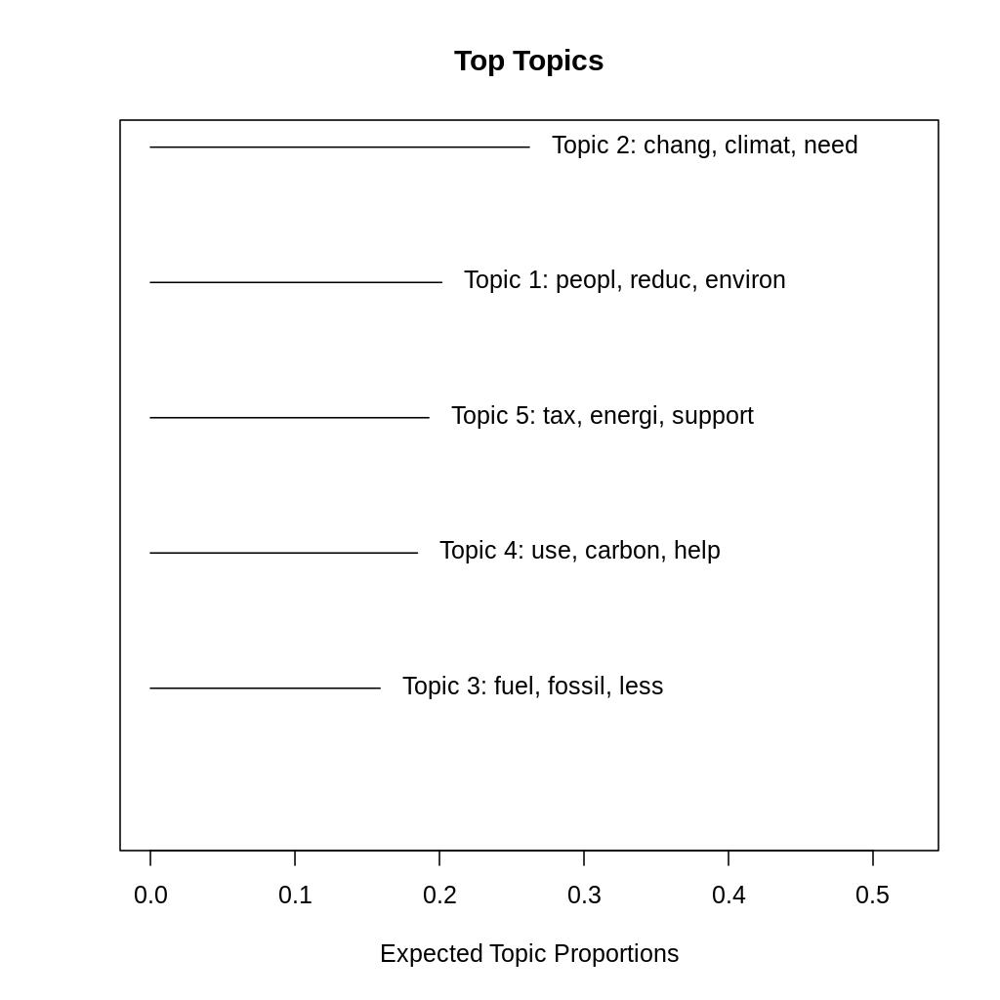

In [344]:
with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=1024, res=150) as img:
    robjects.r.plot(robjects.globalenv["fit"])
img_obj=Image(data=img.getvalue())
open(fig_dir+"toptopics", "wb").write(img_obj.data)
display(img_obj)

In [346]:
corrdata=robjects.r.topicCorr(robjects.globalenv["fit"])

/tmp/ipykernel_2050951/3065893445.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  pl.grid(b=None)
/tmp/ipykernel_2050951/3065893445.py:13: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb=pl.colorbar(fraction=0.046,pad=0.04)


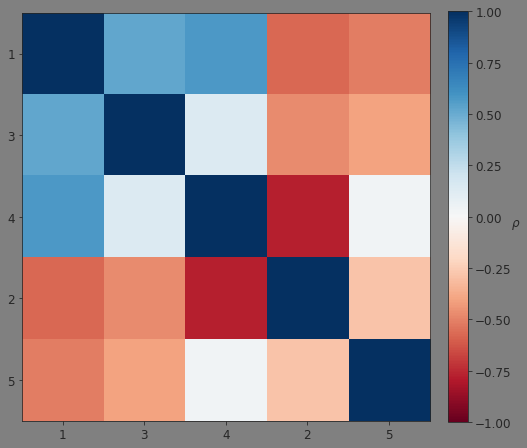

In [367]:
import scipy.cluster.hierarchy as sch
d=sch.distance.pdist(corrdata[2])
L=sch.linkage(d,method='complete')
ind=sch.fcluster(L,0.5*d.max(),'distance')
new_order = np.array([np.arange(K)[i] for i in list((np.argsort(ind)))])
# new_order=np.array([1,2,3,5,6,4,7])-1
pl.imshow(corrdata[2][:,new_order][new_order],cmap='RdBu',vmin=-1,vmax=1)
pl.gca().set_yticks(np.arange(K));
pl.gca().set_yticklabels(new_order+1);
pl.gca().set_xticks(np.arange(K));
pl.gca().set_xticklabels(new_order+1);
pl.grid(b=None)
cb=pl.colorbar(fraction=0.046,pad=0.04)
cb.set_label(r'$\rho$',rotation=0)

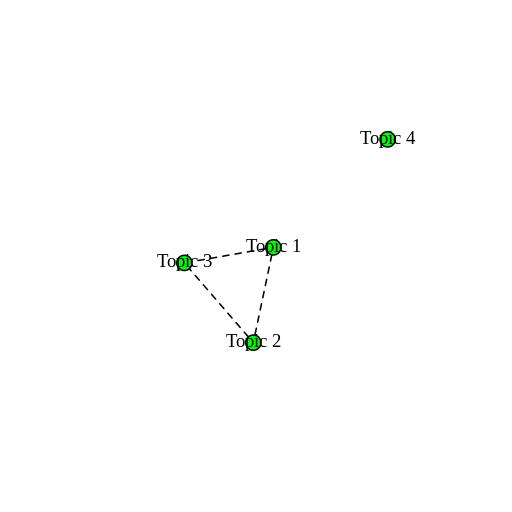

In [340]:
with grdevices.render_to_bytesio(grdevices.jpeg,width=512, height=512, res=150) as img:
    robjects.r.plot(corrdata)
img_obj=Image(data=img.getvalue())
open(fig_dir+"corrtopics", "wb").write(img_obj.data)
display(img_obj)

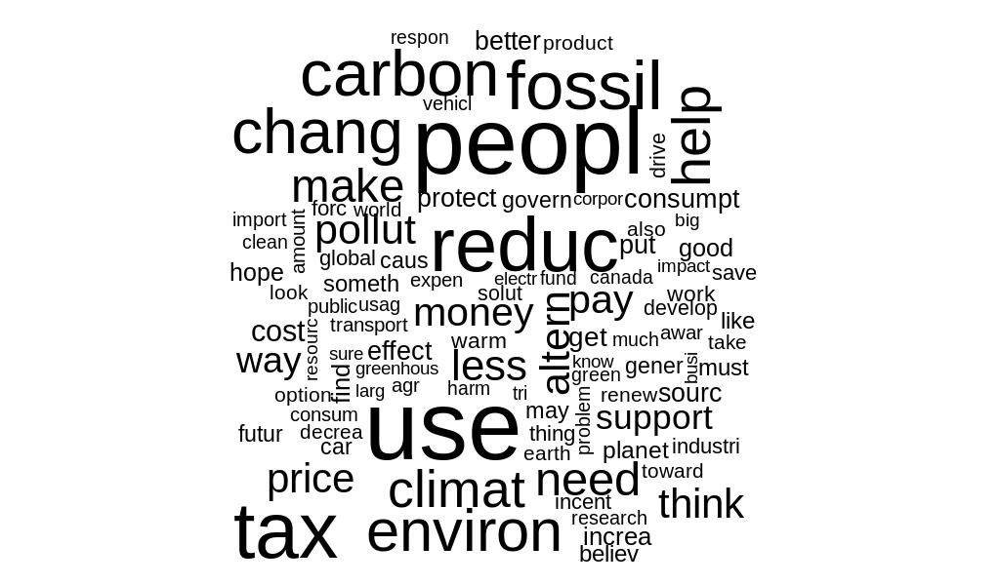

In [419]:
with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=600, res=150) as img:
    robjects.r.cloud(robjects.globalenv["fit"])
img_obj=Image(data=img.getvalue())
open(fig_dir+"cloudtopics", "wb").write(img_obj.data)
display(img_obj)

## Run Effect estimation

In [231]:
stm_effects=robjects.r(
    'topics_of_interest <-c(8,9) \n' +\
    'topic_labels <- c("science","support") \n'+\
    'stm_effects <- estimateEffect(topics_of_interest ~ partisanship + caruse, '+\
                              'stmobj = fit,'+\
                              'meta = processed_corpus$meta,'+\
                              'uncertainty = "Global")'
    );

In [232]:
robjects.r('print(summary(stm_effects))');


Call:
estimateEffect(formula = topics_of_interest ~ partisanship + 
    caruse, stmobj = fit, metadata = processed_corpus$meta, uncertainty = "Global")


Topic 8:

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)          0.098111   0.011975   8.193 6.09e-16 ***
partisanshipnone    -0.004328   0.007079  -0.611    0.541    
partisanshipnotsure -0.012225   0.009156  -1.335    0.182    
partisanshipright    0.006498   0.006999   0.928    0.353    
carusedriver        -0.009398   0.012487  -0.753    0.452    
carusenone          -0.007994   0.012239  -0.653    0.514    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


Topic 9:

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)          0.055547   0.007875   7.054 2.83e-12 ***
partisanshipnone    -0.008724   0.005187  -1.682 0.092855 .  
partisanshipnotsure  0.005824   0.007915   0.736 0.461997    
partisanshipright    0.021914   0.006615   3.3

Plot result

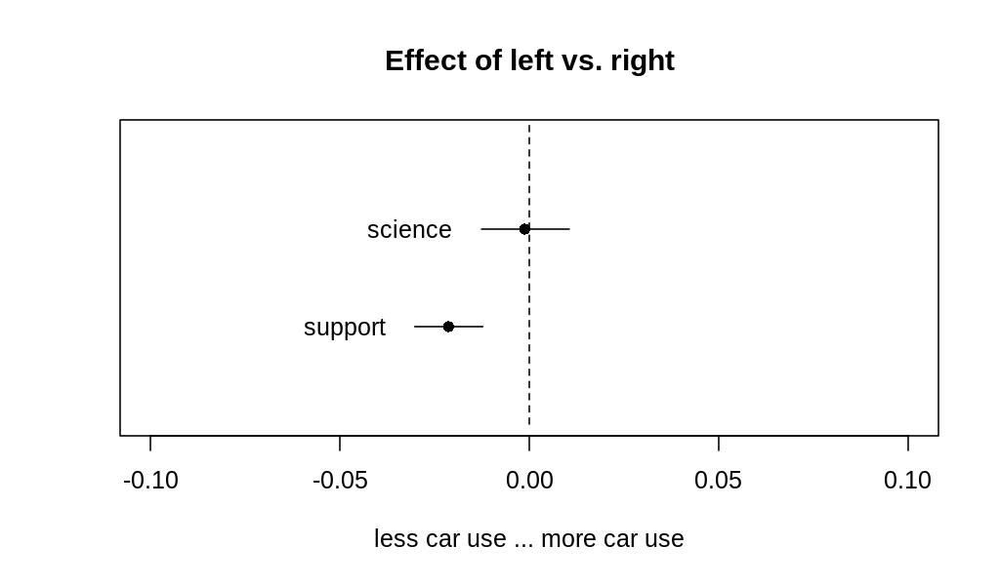

In [237]:
with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=600, res=150) as img:
    robjects.r(
        'plot(stm_effects, \n' +\
#          'covariate = "partisanship", \n' +\
         'covariate = "caruse", \n' +\
         'topics = topics_of_interest, \n' +\
         'model = fit, \n' +\
         'method = "difference", \n' +\
#          'cov.value1 = "left", \n' +\
#          'cov.value2 = "right", \n' +\
         'cov.value1 = "driver", \n' +\
         'cov.value2 = "none", \n' +\
         'xlim = c(-0.1, 0.1), \n' +\
         'labeltype = "custom", \n' +\
         'custom.labels = topic_labels, \n' +\
         'main = "Effect of left vs. right", \n' +\
         'xlab = "less car use ... more car use")'
        );
img_obj=Image(data=img.getvalue())
open(fig_dir+"cov_variation", "wb").write(img_obj.data)
display(img_obj)

So there is a significant negative effect of caruse on the support topic ("use, tax, fossil, less, better, sure, one")

## Validation

In [238]:
robjects.globalenv["fitsk"] = robjects.r('searchK(processed_corpus$documents,processed_corpus$vocab,K=c(5:35))')

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	.....
	 Recovering initialization...
 	......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -5.950) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.771, relative change = 3.012e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.686, relative change = 1.473e-02) 
...........................................................................................................
Completed E-Step (0

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.558, relative change = 3.990e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.557, relative change = 4.011e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 59 (approx. per word bound = -5.557, relative change = 4.074e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.557, relative change = 4.178e-05) 
Topic 1: use, re

Topic 1: use, reduc, carbon, money, encourag 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, climat, energi, pollut 
 Topic 4: emiss, less, get, must, caus 
 Topic 5: chang, need, make, think, price 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 86 (approx. per word bound = -5.551, relative change = 3.812e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 87 (approx. per word bound = -5.550, relative change = 3.839e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.550, relative change = 3.840e-05) 
........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.545, relative change = 2.936e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.544, relative change = 2.851e-05) 
Topic 1: use, reduc, carbon, money, encourag 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, climat, energi, pollut 
 Topic 4: emiss, less, get, must, caus 
 Topic 5: chang, need, make, think, price 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 116 (approx. per word bound = -5.544, relative change = 2.743e-05) 
.....................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.541, relative change = 2.282e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.541, relative change = 2.320e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.541, relative change = 2.346e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.541, relative change = 2.354e-05) 
Topic 1: use

Topic 1: use, reduc, carbon, money, encourag 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, climat, energi, pollut 
 Topic 4: emiss, less, get, planet, must 
 Topic 5: chang, need, make, think, price 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.537, relative change = 2.612e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.537, relative change = 2.530e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 173 (approx. per word bound = -5.537, relative change = 2.436e-05) 
...................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 199 (approx. per word bound = -5.533, relative change = 3.619e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 200 (approx. per word bound = -5.533, relative change = 3.715e-05) 
Topic 1: use, reduc, carbon, money, encourag 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, energi, pollut, way 
 Topic 4: emiss, less, get, planet, must 
 Topic 5: chang, need, climat, make, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 201 (approx. per word bound = -5.533, relative change = 3.745e-05) 
.....................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 227 (approx. per word bound = -5.529, relative change = 1.559e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 228 (approx. per word bound = -5.529, relative change = 1.528e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 229 (approx. per word bound = -5.529, relative change = 1.560e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 230 (approx. per word bound = -5.529, relative change = 1.617e-05) 
Topic 1: use

Topic 1: use, reduc, carbon, money, encourag 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, energi, pollut, way 
 Topic 4: emiss, less, get, planet, must 
 Topic 5: chang, climat, need, make, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 256 (approx. per word bound = -5.526, relative change = 1.915e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 257 (approx. per word bound = -5.526, relative change = 2.031e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 258 (approx. per word bound = -5.526, relative change = 2.149e-05) 
.....................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 284 (approx. per word bound = -5.522, relative change = 2.662e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 285 (approx. per word bound = -5.522, relative change = 2.717e-05) 
Topic 1: use, reduc, carbon, energi, money 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, pollut, way, compani 
 Topic 4: emiss, less, get, protect, planet 
 Topic 5: chang, climat, need, make, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.522, relative change = 2.780e-05) 
...................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 312 (approx. per word bound = -5.519, relative change = 1.693e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 313 (approx. per word bound = -5.519, relative change = 1.762e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 314 (approx. per word bound = -5.519, relative change = 1.850e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 315 (approx. per word bound = -5.519, relative change = 1.954e-05) 
Topic 1: use

Exception ignored from cffi callback <function _consolewrite_ex at 0x7fecbd88db80>:
Traceback (most recent call last):
  File "/home/mptouzel/anaconda3/lib/python3.9/site-packages/rpy2/rinterface_lib/callbacks.py", line 129, in _consolewrite_ex
    @ffi_proxy.callback(ffi_proxy._consolewrite_ex_def,
KeyboardInterrupt: 


........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 318 (approx. per word bound = -5.519, relative change = 2.421e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 319 (approx. per word bound = -5.518, relative change = 2.613e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 320 (approx. per word bound = -5.518, relative change = 2.809e-05) 
Topic 1: use, reduc, carbon, energi, money 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, pollut, way, compani 
 Topic 4: emiss, less, get, protect, planet 
 Topic 5: chang, climat, need, make, think 
......................................

Exception ignored from cffi callback <function _processevents at 0x7fecbda2d3a0>:
Traceback (most recent call last):
  File "/home/mptouzel/anaconda3/lib/python3.9/site-packages/rpy2/rinterface_lib/callbacks.py", line 277, in _processevents
    try:
KeyboardInterrupt: 


.......................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 326 (approx. per word bound = -5.517, relative change = 2.387e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 327 (approx. per word bound = -5.517, relative change = 2.221e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 328 (approx. per word bound = -5.517, relative change = 2.082e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 329 (approx. per word bound = -5.517, relative change = 1.953e-05) 
................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 355 (approx. per word bound = -5.513, relative change = 3.507e-05) 
Topic 1: use, reduc, carbon, energi, less 
 Topic 2: peopl, fuel, environ, help, altern 
 Topic 3: tax, fossil, pollut, way, compani 
 Topic 4: emiss, get, protect, planet, must 
 Topic 5: chang, climat, need, make, think 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 356 (approx. per word bound = -5.513, relative change = 3.176e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 357 (approx. per word bound = -5.513, relative change = 2.692e-05) 
....................................

Topic 1: reduc, help, make, compani, get 
 Topic 2: fossil, less, altern, pollut, put 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, price, better 
 Topic 5: fuel, tax, emiss, climat, pay 
 Topic 6: energi, need, think, encourag, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 21 (approx. per word bound = -5.568, relative change = 1.231e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 22 (approx. per word bound = -5.567, relative change = 1.125e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 23 (approx. per word bound = -5.567, relative change = 1.02

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.560, relative change = 2.849e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.560, relative change = 2.787e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.560, relative change = 2.731e-05) 
Topic 1: reduc, help, make, compani, get 
 Topic 2: fossil, less, altern, pollut, put 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, price, better 
 Topic 5: fuel, tax, emiss, climat, pay 
 Topic 6: energi, need, think, encourag

Topic 1: reduc, help, make, compani, get 
 Topic 2: fossil, less, altern, pollut, put 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, price, better 
 Topic 5: fuel, tax, emiss, climat, pay 
 Topic 6: energi, need, think, encourag, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.556, relative change = 3.074e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.556, relative change = 3.174e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.556, relative change = 3.27

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.551, relative change = 3.433e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 104 (approx. per word bound = -5.551, relative change = 3.400e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 105 (approx. per word bound = -5.550, relative change = 3.363e-05) 
Topic 1: reduc, help, make, compani, get 
 Topic 2: fossil, less, altern, pollut, put 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, price, better 
 Topic 5: fuel, tax, emiss, climat, pay 
 Topic 6: energi, need, think, encou

Topic 1: reduc, help, make, compani, get 
 Topic 2: fossil, less, altern, pollut, fuel 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, price, better 
 Topic 5: tax, fuel, emiss, climat, pay 
 Topic 6: energi, need, think, encourag, cost 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.545, relative change = 4.140e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.545, relative change = 4.311e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.545, relative change = 

Completing Iteration 157 (approx. per word bound = -5.539, relative change = 3.344e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.539, relative change = 3.174e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -5.539, relative change = 2.985e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 160 (approx. per word bound = -5.539, relative change = 2.820e-05) 
Topic 1: reduc, help, make, compani, get 
 Topic 2: fuel, fossil, less, altern, pollut 
 Topic 3: use, environ, money, effect, protect 
 Topic 4: peopl, carbon, chang, pr

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 24 (approx. per word bound = -5.555, relative change = 1.615e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.554, relative change = 1.470e-04) 
Topic 1: use, emiss, cost, consumpt, put 
 Topic 2: fuel, tax, environ, need, pay 
 Topic 3: climat, way, encourag, find, caus 
 Topic 4: peopl, less, altern, think, money 
 Topic 5: reduc, help, pollut, price, get 
 Topic 6: fossil, carbon, energi, better, good 
 Topic 7: chang, make, support, may, work 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word b

 Topic 2: fuel, tax, environ, need, pay 
 Topic 3: climat, way, encourag, find, caus 
 Topic 4: peopl, less, altern, think, money 
 Topic 5: reduc, help, price, pollut, get 
 Topic 6: fossil, carbon, energi, better, good 
 Topic 7: chang, make, support, may, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.541, relative change = 4.703e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.541, relative change = 4.457e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.540, relative change = 4.333e-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 77 (approx. per word bound = -5.536, relative change = 2.983e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.536, relative change = 3.100e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.536, relative change = 3.219e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.536, relative change = 3.317e-05) 
Topic 1: use, em

Topic 1: use, emiss, cost, consumpt, put 
 Topic 2: fuel, tax, environ, need, pay 
 Topic 3: climat, way, encourag, find, caus 
 Topic 4: peopl, less, altern, think, money 
 Topic 5: reduc, help, price, pollut, get 
 Topic 6: fossil, carbon, energi, better, sourc 
 Topic 7: chang, make, support, believ, may 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.527, relative change = 2.062e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.527, relative change = 1.931e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per 

Completing Iteration 156 (approx. per word bound = -5.524, relative change = 2.279e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 157 (approx. per word bound = -5.524, relative change = 2.363e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 158 (approx. per word bound = -5.524, relative change = 2.423e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 159 (approx. per word bound = -5.524, relative change = 2.462e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.520, relative change = 3.718e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.520, relative change = 3.788e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.520, relative change = 3.859e-05) 
Topic 1: use, emiss, cost, consumpt, put 
 Topic 2: tax, fuel, environ, need, pay 
 Topic 3: climat, way, encourag, find, caus 
 Topic 4: peopl, less, altern, think, money 
 Topic 5: reduc, help, price, pollut, get 
 Topic 6: fossil, carbon, energi, fuel, sourc 
 Topic 7: chang, make, support, believ, may 
..........................................................................................

Completed M-Step. 
Completing Iteration 210 (approx. per word bound = -5.515, relative change = 2.502e-05) 
Topic 1: use, emiss, cost, consumpt, put 
 Topic 2: tax, environ, need, pay, fuel 
 Topic 3: climat, way, encourag, find, caus 
 Topic 4: peopl, less, altern, think, money 
 Topic 5: reduc, help, price, pollut, get 
 Topic 6: fuel, fossil, carbon, energi, sourc 
 Topic 7: chang, make, support, believ, may 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 211 (approx. per word bound = -5.515, relative change = 2.517e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 212 (approx. per word bound = -5.515, relative change = 2.497e-05) 
..........................................................................................

 Topic 2: peopl, fuel, fossil, think, price 
 Topic 3: reduc, consum, agr, green, larg 
 Topic 4: carbon, emiss, better, hope, must 
 Topic 5: use, tax, help, need, less 
 Topic 6: environ, make, way, increa, car 
 Topic 7: energi, get, protect, planet, someth 
 Topic 8: chang, climat, cost, compani, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 36 (approx. per word bound = -5.541, relative change = 1.063e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 37 (approx. per word bound = -5.540, relative change = 1.079e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 38 (approx. per word b

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 61 (approx. per word bound = -5.528, relative change = 8.125e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 62 (approx. per word bound = -5.527, relative change = 8.178e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 63 (approx. per word bound = -5.527, relative change = 8.231e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 64 (approx. per word bound = -5.526, relative change = 8.289e-05) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 113 (approx. per word bound = -5.512, relative change = 2.788e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.511, relative change = 2.779e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.511, relative change = 2.819e-05) 
Topic 1: altern, pay, encourag, effect, find 
 Topic 2: peopl, fuel, fossil, think, price 
 Topic 3: reduc, govern, consum, vehicl, agr 
 Topic 4: carbon, emiss, better, hope, believ 
 Topic 5: use, tax, help, need, less 
 Topic 6: environ, make, way, increa,

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 139 (approx. per word bound = -5.506, relative change = 5.856e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 140 (approx. per word bound = -5.505, relative change = 5.806e-05) 
Topic 1: altern, pay, encourag, effect, find 
 Topic 2: peopl, fuel, fossil, think, price 
 Topic 3: reduc, govern, consum, vehicl, agr 
 Topic 4: carbon, emiss, better, hope, believ 
 Topic 5: use, tax, help, need, less 
 Topic 6: environ, make, way, increa, car 
 Topic 7: energi, get, protect, planet, someth 
 Topic 8: chang, climat, cost, compani, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.499, relative change = 3.681e-05) 
Topic 1: altern, pay, encourag, effect, find 
 Topic 2: peopl, fuel, fossil, use, think 
 Topic 3: reduc, govern, consum, vehicl, agr 
 Topic 4: carbon, emiss, better, hope, caus 
 Topic 5: tax, help, need, use, less 
 Topic 6: environ, make, way, increa, car 
 Topic 7: energi, get, protect, planet, someth 
 Topic 8: chang, climat, cost, compani, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 166 (approx. per word bound = -5.499, relative change = 3.737e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-S

Topic 1: altern, pay, encourag, effect, find 
 Topic 2: use, peopl, fuel, fossil, think 
 Topic 3: reduc, govern, consum, vehicl, agr 
 Topic 4: carbon, emiss, better, hope, caus 
 Topic 5: tax, help, need, less, pollut 
 Topic 6: environ, make, way, increa, car 
 Topic 7: energi, get, protect, planet, someth 
 Topic 8: chang, climat, cost, compani, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.494, relative change = 2.592e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.494, relative change = 2.496e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed 

 Topic 7: energi, get, protect, planet, must 
 Topic 8: chang, climat, cost, compani, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 216 (approx. per word bound = -5.491, relative change = 2.116e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 217 (approx. per word bound = -5.491, relative change = 2.225e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 218 (approx. per word bound = -5.491, relative change = 2.365e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing

Completed M-Step. 
Completing Iteration 241 (approx. per word bound = -5.488, relative change = 1.481e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 242 (approx. per word bound = -5.488, relative change = 1.464e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 243 (approx. per word bound = -5.487, relative change = 1.626e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 244 (approx. per word bound = -5.487, relative change = 1.817e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 45 (approx. per word bound = -5.541, relative change = 5.581e-05) 
Topic 1: reduc, fossil, emiss, need, consumpt 
 Topic 2: tax, environ, hope, must, industri 
 Topic 3: altern, price, encourag, peopl, effect 
 Topic 4: make, get, believ, caus, option 
 Topic 5: energi, support, futur, forc, incent 
 Topic 6: use, fuel, less, pay, pollut 
 Topic 7: peopl, carbon, chang, compani, sourc 
 Topic 8: help, think, way, put, good 
 Topic 9: climat, money, cost, increa, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 46 (approx. per word bound = -5.541, relative change = 5.769e-05) 
......................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 95 (approx. per word bound = -5.526, relative change = 4.025e-05) 
Topic 1: reduc, fossil, emiss, need, consumpt 
 Topic 2: tax, environ, hope, must, industri 
 Topic 3: altern, price, encourag, effect, like 
 Topic 4: make, get, believ, caus, option 
 Topic 5: energi, support, sourc, futur, forc 
 Topic 6: use, fuel, less, pay, pollut 
 Topic 7: peopl, carbon, chang, compani, someth 
 Topic 8: help, think, way, put, good 
 Topic 9: climat, money, cost, increa, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.526, relative change = 4.004e-05) 
.......................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.514, relative change = 3.159e-05) 
Topic 1: fuel, reduc, fossil, emiss, need 
 Topic 2: tax, environ, hope, must, industri 
 Topic 3: altern, price, encourag, effect, like 
 Topic 4: make, get, believ, caus, option 
 Topic 5: energi, support, sourc, futur, forc 
 Topic 6: use, less, pay, pollut, better 
 Topic 7: peopl, chang, carbon, compani, someth 
 Topic 8: help, think, way, put, good 
 Topic 9: climat, money, cost, increa, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 146 (approx. per word bound = -5.514, relative change = 3.367e-05) 
.......................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.506, relative change = 1.512e-05) 
Topic 1: fuel, reduc, fossil, carbon, emiss 
 Topic 2: tax, environ, hope, must, industri 
 Topic 3: altern, price, encourag, effect, like 
 Topic 4: make, get, believ, option, world 
 Topic 5: energi, support, sourc, futur, forc 
 Topic 6: use, less, pay, pollut, better 
 Topic 7: peopl, chang, compani, someth, may 
 Topic 8: help, think, way, put, good 
 Topic 9: climat, money, cost, increa, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.506, relative change = 1.268e-05) 
.......................................................................................................

 Topic 6: use, price, product, decrea, earth 
 Topic 7: fuel, tax, fossil, less, pay 
 Topic 8: help, need, money, believ, govern 
 Topic 9: pollut, compani, consumpt, must, solut 
 Topic 10: energi, think, encourag, better, effect 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 46 (approx. per word bound = -5.525, relative change = 1.030e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -5.525, relative change = 9.900e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 48 (approx. per word bound = -5.524, relative change = 9.319e-05) 
.............................

Topic 1: reduc, support, get, hope, industri 
 Topic 2: environ, make, cost, planet, car 
 Topic 3: carbon, emiss, climat, protect, increa 
 Topic 4: sourc, good, like, world, expen 
 Topic 5: peopl, chang, altern, way, put 
 Topic 6: use, price, product, decrea, earth 
 Topic 7: fuel, tax, fossil, less, pay 
 Topic 8: help, need, money, believ, govern 
 Topic 9: pollut, compani, consumpt, must, solut 
 Topic 10: energi, think, encourag, better, effect 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.514, relative change = 1.097e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.513, relative change = 1.136e-04) 
..................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 119 (approx. per word bound = -5.496, relative change = 5.439e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.496, relative change = 5.397e-05) 
Topic 1: reduc, support, get, hope, industri 
 Topic 2: environ, make, cost, planet, car 
 Topic 3: carbon, chang, emiss, climat, protect 
 Topic 4: sourc, good, like, world, expen 
 Topic 5: peopl, altern, way, put, forc 
 Topic 6: use, price, product, decrea, earth 
 Topic 7: fuel, tax, fossil, less, pay 
 Topic 8: help, need, money, believ, someth 
 Topic 9: pollut, compani, consumpt, must, solut 
 Topic 10: energi, think, encourag, better, effect 
..................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.491, relative change = 3.664e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.491, relative change = 3.774e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.490, relative change = 3.948e-05) 
Topic 1: reduc, support, get, hope, industri 
 Topic 2: environ, make, cost, planet, car 
 Topic 3: carbon, chang, emiss, climat, protect 
 Topic 4: sourc, good, like, world, expen 
 Topic 5: peopl, altern, way, put, forc 
 Topic 6: use, price, product, decre

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 167 (approx. per word bound = -5.485, relative change = 4.548e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 168 (approx. per word bound = -5.485, relative change = 4.696e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 169 (approx. per word bound = -5.485, relative change = 4.786e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 170 (approx. per word bound = -5.484, relative change = 4.782e-05) 
Topic 1: red

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 191 (approx. per word bound = -5.480, relative change = 3.596e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 192 (approx. per word bound = -5.480, relative change = 3.628e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 193 (approx. per word bound = -5.480, relative change = 3.448e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.480, relative change = 3.056e-05) 
............

 Topic 3: chang, help, climat, caus, done 
 Topic 4: energi, sourc, effect, hope, find 
 Topic 5: peopl, think, encourag, get, forc 
 Topic 6: need, make, pollut, someth, industri 
 Topic 7: altern, like, govern, consum, sure 
 Topic 8: carbon, emiss, planet, increa, work 
 Topic 9: use, price, pay, way, futur 
 Topic 10: reduc, cost, may, car, warm 
 Topic 11: fuel, fossil, gener, vehicl, usag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 41 (approx. per word bound = -5.501, relative change = 1.435e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 42 (approx. per word bound = -5.501, relative change = 1.427e-04) 
...........................................................................................................
C

Completing Iteration 64 (approx. per word bound = -5.484, relative change = 1.103e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.483, relative change = 1.123e-04) 
Topic 1: tax, environ, consumpt, protect, believ 
 Topic 2: less, money, support, compani, put 
 Topic 3: chang, help, climat, effect, caus 
 Topic 4: energi, sourc, hope, find, incent 
 Topic 5: peopl, think, encourag, get, forc 
 Topic 6: need, make, pollut, industri, save 
 Topic 7: altern, like, govern, also, consum 
 Topic 8: carbon, emiss, planet, increa, work 
 Topic 9: use, price, pay, way, futur 
 Topic 10: reduc, cost, may, car, drive 
 Topic 11: fuel, fossil, gener, vehicl, usag 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 88 (approx. per word bound = -5.474, relative change = 5.102e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 89 (approx. per word bound = -5.474, relative change = 4.855e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 90 (approx. per word bound = -5.474, relative change = 4.773e-05) 
Topic 1: tax, environ, consumpt, protect, believ 
 Topic 2: less, money, support, compani, put 
 Topic 3: chang, help, climat, effect, someth 
 Topic 4: energi, sourc, hope, find, incent 
 Topic 5: peopl, think, encourag, get, forc 
 Topic 6: need, make, pollut,

 Topic 2: less, money, support, compani, put 
 Topic 3: chang, help, climat, effect, someth 
 Topic 4: energi, altern, sourc, hope, find 
 Topic 5: peopl, think, encourag, get, forc 
 Topic 6: need, make, pollut, industri, save 
 Topic 7: like, govern, also, consum, sure 
 Topic 8: carbon, emiss, planet, increa, work 
 Topic 9: use, price, pay, way, futur 
 Topic 10: reduc, cost, may, car, drive 
 Topic 11: fuel, fossil, vehicl, usag, corpor 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 136 (approx. per word bound = -5.456, relative change = 3.293e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 137 (approx. per word bound = -5.456, relative change = 2.972e-05) 
...........................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 182 (approx. per word bound = -5.451, relative change = 1.719e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 183 (approx. per word bound = -5.451, relative change = 1.740e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 184 (approx. per word bound = -5.451, relative change = 1.840e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 185 (approx. per word bound = -5.450, relative change = 1.970e-05) 
Topic 1: tax

 Topic 8: carbon, emiss, planet, increa, work 
 Topic 9: use, price, pay, way, thing 
 Topic 10: reduc, cost, may, car, drive 
 Topic 11: fuel, fossil, vehicl, usag, corpor 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 206 (approx. per word bound = -5.448, relative change = 1.509e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 207 (approx. per word bound = -5.448, relative change = 1.532e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 208 (approx. per word bound = -5.448, relative change = 1.599e-05) 
.....................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 253 (approx. per word bound = -5.442, relative change = 2.848e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 254 (approx. per word bound = -5.442, relative change = 2.872e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 255 (approx. per word bound = -5.442, relative change = 2.908e-05) 
Topic 1: tax, environ, consumpt, protect, much 
 Topic 2: less, money, support, put, better 
 Topic 3: chang, help, climat, effect, someth 
 Topic 4: energi, altern, compani, sourc, hope 
 Topic 5: peopl, think, encourag, get, forc 
 Topic 6: need, make, poll

Completing Iteration 8 (approx. per word bound = -5.590, relative change = 2.774e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 9 (approx. per word bound = -5.579, relative change = 2.078e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 10 (approx. per word bound = -5.570, relative change = 1.598e-03) 
Topic 1: use, encourag, find, warm, option 
 Topic 2: make, think, protect, futur, solut 
 Topic 3: fuel, fossil, chang, good, must 
 Topic 4: environ, money, like, someth, toward 
 Topic 5: need, altern, compani, think, product 
 Topic 6: less, car, save, increa, electr 
 Topic 7: tax, price, consumpt, pay, believ 
 Topic 8: peopl, climat, emiss, support, planet 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbo

Completed M-Step. 
Completing Iteration 55 (approx. per word bound = -5.506, relative change = 7.116e-05) 
Topic 1: use, encourag, find, option, awar 
 Topic 2: make, think, protect, futur, solut 
 Topic 3: fuel, fossil, chang, good, must 
 Topic 4: environ, money, like, someth, believ 
 Topic 5: need, altern, compani, product, damag 
 Topic 6: less, peopl, increa, car, save 
 Topic 7: tax, price, pay, consumpt, industri 
 Topic 8: peopl, emiss, climat, support, better 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, cost, effect, put, govern 
 Topic 11: energi, pollut, sourc, work, incent 
 Topic 12: help, hope, caus, earth, fund 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.506, relative change = 6.809e-05) 
........................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.498, relative change = 4.590e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.498, relative change = 4.240e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.498, relative change = 3.969e-05) 
Topic 1: use, encourag, find, option, awar 
 Topic 2: make, think, protect, futur, solut 
 Topic 3: fuel, fossil, chang, good, must 
 Topic 4: environ, money, like, someth, believ 
 Topic 5: need, altern, compani, product, damag 
 Topic 6: peopl, less, increa, c

 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, cost, effect, put, govern 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic 12: help, hope, caus, earth, fund 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 101 (approx. per word bound = -5.493, relative change = 4.227e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 102 (approx. per word bound = -5.492, relative change = 4.326e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 103 (approx. per word bound = -5.492, relative change = 4.427e-05) 
...................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 125 (approx. per word bound = -5.486, relative change = 3.870e-05) 
Topic 1: use, encourag, find, option, awar 
 Topic 2: make, think, protect, must, futur 
 Topic 3: fuel, fossil, chang, good, stop 
 Topic 4: environ, money, like, someth, believ 
 Topic 5: need, altern, product, damag, one 
 Topic 6: peopl, less, increa, car, drive 
 Topic 7: tax, price, pay, consumpt, industri 
 Topic 8: emiss, climat, support, better, planet 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, cost, effect, put, govern 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic 12: help, hope, caus, earth, fund 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 126 (approx. per word bound = -5.

 Topic 4: environ, money, like, someth, believ 
 Topic 5: need, altern, look, tri, damag 
 Topic 6: peopl, less, increa, car, drive 
 Topic 7: tax, price, pay, consumpt, industri 
 Topic 8: emiss, climat, support, better, planet 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, cost, put, effect, govern 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic 12: help, hope, caus, earth, harm 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 171 (approx. per word bound = -5.474, relative change = 4.341e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 172 (approx. per word bound = -5.474, relative change = 4.420e-05) 
....................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 194 (approx. per word bound = -5.465, relative change = 7.599e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 195 (approx. per word bound = -5.465, relative change = 7.161e-05) 
Topic 1: use, encourag, find, option, research 
 Topic 2: make, think, protect, must, futur 
 Topic 3: fuel, fossil, good, stop, direct 
 Topic 4: environ, money, like, believ, someth 
 Topic 5: need, altern, look, tri, damag 
 Topic 6: peopl, less, increa, car, drive 
 Topic 7: tax, price, pay, consumpt, industri 
 Topic 8: chang, climat, emiss, support, planet 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, cost, put, effect, govern 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic

Completed M-Step. 
Completing Iteration 240 (approx. per word bound = -5.454, relative change = 2.574e-05) 
Topic 1: use, encourag, find, option, research 
 Topic 2: make, think, better, protect, must 
 Topic 3: fuel, fossil, good, stop, direct 
 Topic 4: environ, money, like, believ, someth 
 Topic 5: need, altern, look, tri, one 
 Topic 6: peopl, less, increa, car, drive 
 Topic 7: tax, price, pay, consumpt, industri 
 Topic 8: chang, climat, support, planet, warm 
 Topic 9: reduc, way, get, may, thing 
 Topic 10: carbon, emiss, cost, put, effect 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic 12: help, hope, caus, earth, harm 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 241 (approx. per word bound = -5.454, relative change = 2.379e-05) 
..........................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 263 (approx. per word bound = -5.452, relative change = 2.148e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 264 (approx. per word bound = -5.452, relative change = 2.245e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 265 (approx. per word bound = -5.452, relative change = 2.395e-05) 
Topic 1: use, encourag, find, option, research 
 Topic 2: make, think, better, protect, must 
 Topic 3: fuel, fossil, good, stop, direct 
 Topic 4: environ, money, like, believ, someth 
 Topic 5: need, altern, look, tri, one 
 Topic 6: peopl, less, increa, ca

 Topic 9: reduc, way, get, may, amount 
 Topic 10: carbon, emiss, cost, put, effect 
 Topic 11: energi, pollut, compani, sourc, work 
 Topic 12: help, hope, caus, earth, harm 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 286 (approx. per word bound = -5.448, relative change = 1.530e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 287 (approx. per word bound = -5.448, relative change = 1.493e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 288 (approx. per word bound = -5.448, relative change = 1.498e-05) 
...................................................................................

Topic 1: use, pay, consumpt, product, must 
 Topic 2: pollut, planet, someth, warm, sourc 
 Topic 3: need, way, support, look, know 
 Topic 4: environ, cost, save, resourc, impact 
 Topic 5: carbon, money, caus, thing, decrea 
 Topic 6: peopl, make, get, better, incent 
 Topic 7: good, awar, much, problem, agr 
 Topic 8: tax, think, effect, govern, user 
 Topic 9: reduc, help, futur, work, car 
 Topic 10: emiss, less, encourag, hope, industri 
 Topic 11: fuel, fossil, price, protect, increa 
 Topic 12: chang, climat, believ, renew, fund 
 Topic 13: energi, altern, put, compani, find 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.485, relative change = 2.302e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Compl

Topic 1: use, pay, consumpt, like, product 
 Topic 2: pollut, planet, someth, warm, global 
 Topic 3: need, way, support, look, know 
 Topic 4: environ, cost, protect, save, resourc 
 Topic 5: carbon, money, caus, thing, decrea 
 Topic 6: peopl, make, get, better, incent 
 Topic 7: good, solut, awar, problem, much 
 Topic 8: tax, think, effect, govern, user 
 Topic 9: reduc, help, futur, work, car 
 Topic 10: emiss, less, encourag, hope, industri 
 Topic 11: fuel, fossil, price, increa, forc 
 Topic 12: chang, climat, believ, mean, address 
 Topic 13: energi, altern, compani, sourc, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 76 (approx. per word bound = -5.455, relative change = 4.033e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
C

Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.439, relative change = 6.980e-05) 
Topic 1: use, pay, consumpt, like, product 
 Topic 2: pollut, planet, someth, warm, global 
 Topic 3: need, way, support, look, know 
 Topic 4: environ, cost, protect, save, resourc 
 Topic 5: carbon, money, thing, decrea, caus 
 Topic 6: peopl, make, get, better, car 
 Topic 7: good, solut, awar, problem, much 
 Topic 8: tax, think, effect, govern, user 
 Topic 9: reduc, help, futur, gener, take 
 Topic 10: emiss, less, hope, encourag, industri 
 Topic 11: fuel, fossil, price, increa, forc 
 Topic 12: chang, climat, believ, address, part 
 Topic 13: energi, altern, compani, sourc, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.439, relative change = 6.586e-05) 
...................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.435, relative change = 1.539e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.435, relative change = 1.320e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.435, relative change = 1.161e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 145 (approx. per word bound = -5.435, relative change = 1.067e-05) 
Topic 1: use

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 18 (approx. per word bound = -5.482, relative change = 4.599e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 19 (approx. per word bound = -5.480, relative change = 4.079e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 20 (approx. per word bound = -5.478, relative change = 3.775e-04) 
Topic 1: carbon, better, futur, harm, greenhous 
 Topic 2: energi, altern, consumpt, planet, compani 
 Topic 3: chang, like, agr, find, climat 
 Topic 4: need, someth, must, govern, look 
 Topic 5: way, get, good, renew, problem 
 Topic 6: environ, believ, work,

Topic 1: carbon, better, futur, harm, greenhous 
 Topic 2: energi, altern, compani, consumpt, planet 
 Topic 3: chang, climat, like, agr, contribut 
 Topic 4: need, someth, must, look, solut 
 Topic 5: way, get, good, thing, renew 
 Topic 6: environ, believ, work, decrea, import 
 Topic 7: peopl, caus, car, drive, option 
 Topic 8: help, think, money, support, peopl 
 Topic 9: reduc, emiss, make, encourag, may 
 Topic 10: use, less, peopl, pay, effect 
 Topic 11: tax, put, industri, toward, much 
 Topic 12: fuel, fossil, protect, save, product 
 Topic 13: price, cost, increa, warm, global 
 Topic 14: pollut, sourc, gener, respon, big 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 41 (approx. per word bound = -5.452, relative change = 1.213e-04) 
...........................................................................................................
Com

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 84 (approx. per word bound = -5.439, relative change = 5.064e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 85 (approx. per word bound = -5.438, relative change = 5.312e-05) 
Topic 1: carbon, better, futur, harm, greenhous 
 Topic 2: energi, altern, compani, consumpt, planet 
 Topic 3: chang, climat, effect, like, agr 
 Topic 4: need, someth, must, solut, look 
 Topic 5: way, get, good, thing, renew 
 Topic 6: environ, believ, work, decrea, import 
 Topic 7: peopl, caus, car, drive, option 
 Topic 8: help, think, money, support, produc 
 Topic 9: reduc, emiss, make, encourag, may 
 Topic 10: use, peopl, less, pay, hope 
 Topic 11: tax, put, industri, toward, much 
 Topic 12:

 Topic 6: environ, believ, work, decrea, import 
 Topic 7: peopl, caus, car, drive, option 
 Topic 8: help, think, money, support, produc 
 Topic 9: reduc, emiss, make, encourag, may 
 Topic 10: use, peopl, less, pay, hope 
 Topic 11: tax, put, industri, toward, much 
 Topic 12: fuel, fossil, protect, save, product 
 Topic 13: price, cost, increa, warm, global 
 Topic 14: pollut, sourc, govern, gener, respon 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 106 (approx. per word bound = -5.431, relative change = 4.336e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 107 (approx. per word bound = -5.431, relative change = 4.089e-05) 
.............................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.420, relative change = 4.277e-05) 
Topic 1: carbon, better, futur, harm, greenhous 
 Topic 2: energi, altern, compani, consumpt, find 
 Topic 3: chang, climat, effect, like, agr 
 Topic 4: need, planet, must, someth, solut 
 Topic 5: way, get, good, thing, problem 
 Topic 6: environ, protect, believ, work, decrea 
 Topic 7: peopl, car, drive, option, take 
 Topic 8: help, think, money, support, produc 
 Topic 9: reduc, emiss, make, encourag, may 
 Topic 10: use, peopl, less, pay, hope 
 Topic 11: tax, put, industri, toward, much 
 Topic 12: fuel, fossil, save, product, renew 
 Topic 13: price, cost, increa, warm, global 
 Topic 14: pollut, sourc, govern, gener, respon 
...........................................................................................................
Co

 Topic 2: help, cost, hope, drive, toward 
 Topic 3: pay, planet, like, must, save 
 Topic 4: altern, think, find, someth, forc 
 Topic 5: need, better, futur, warm, global 
 Topic 6: chang, climat, way, thing, caus 
 Topic 7: environ, protect, option, usag, respon 
 Topic 8: reduc, emiss, energi, consumpt, sourc 
 Topic 9: use, fossil, price, car, product 
 Topic 10: peopl, less, money, get, increa 
 Topic 11: good, work, earth, import, much 
 Topic 12: make, pollut, compani, solut, look 
 Topic 13: effect, industri, world, believ, larg 
 Topic 14: tax, encourag, support, may, green 
 Topic 15: carbon, price, footprint, base, govern 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 36 (approx. per word bound = -5.449, relative change = 1.244e-04) 
...........................................................................................................
Com

 Topic 14: tax, encourag, support, may, green 
 Topic 15: carbon, price, emiss, mean, govern 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.441, relative change = 6.140e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.440, relative change = 5.930e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 58 (approx. per word bound = -5.440, relative change = 5.878e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 78 (approx. per word bound = -5.433, relative change = 5.838e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 79 (approx. per word bound = -5.433, relative change = 5.397e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.433, relative change = 5.190e-05) 
Topic 1: fuel, put, incent, amount, know 
 Topic 2: help, cost, hope, toward, drive 
 Topic 3: pay, planet, like, must, save 
 Topic 4: altern, think, find, someth, forc 
 Topic 5: need, better, futur, warm, global 
 Topic 6: chang, climat, way, caus, thing 
 To

 Topic 8: reduc, energi, consumpt, sourc, develop 
 Topic 9: use, fossil, car, product, harm 
 Topic 10: peopl, less, money, get, increa 
 Topic 11: good, work, earth, govern, import 
 Topic 12: make, pollut, compani, solut, look 
 Topic 13: effect, believ, industri, world, larg 
 Topic 14: tax, encourag, support, may, green 
 Topic 15: carbon, emiss, price, mean, put 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 121 (approx. per word bound = -5.421, relative change = 5.167e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 122 (approx. per word bound = -5.421, relative change = 5.386e-05) 
...........................................................................................................
Completed E-Step (0 second

Completing Iteration 141 (approx. per word bound = -5.415, relative change = 2.069e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 142 (approx. per word bound = -5.415, relative change = 1.557e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 143 (approx. per word bound = -5.415, relative change = 1.245e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 144 (approx. per word bound = -5.415, relative change = 1.245e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing I

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 164 (approx. per word bound = -5.413, relative change = 1.694e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 165 (approx. per word bound = -5.413, relative change = 1.623e-05) 
Topic 1: fuel, fossil, incent, amount, know 
 Topic 2: help, cost, hope, drive, toward 
 Topic 3: pay, planet, like, must, save 
 Topic 4: altern, think, find, forc, decrea 
 Topic 5: need, better, futur, warm, global 
 Topic 6: chang, climat, way, someth, caus 
 Topic 7: environ, protect, option, also, usag 
 Topic 8: reduc, energi, consumpt, sourc, develop 
 Topic 9: use, car, product, wast, discourag 
 Topic 10: peopl, less, get, increa, buy 
 Topic 11: good, work, govern, earth, import 
 Topic 12:

Completing Iteration 6 (approx. per word bound = -5.520, relative change = 6.062e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 7 (approx. per word bound = -5.495, relative change = 4.438e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 8 (approx. per word bound = -5.478, relative change = 3.119e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 9 (approx. per word bound = -5.467, relative change = 2.112e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 49 (approx. per word bound = -5.407, relative change = 8.751e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.407, relative change = 8.946e-05) 
Topic 1: need, like, someth, believ, industri 
 Topic 2: protect, planet, save, world, earth 
 Topic 3: help, climat, increa, usag, fund 
 Topic 4: energi, altern, sourc, find, encourag 
 Topic 5: peopl, less, think, cost, encourag 
 Topic 6: better, caus, import, everyon, creat 
 Topic 7: money, support, good, may, sure 
 Topic 8: carbon, way, effect, put, warm 
 Topic 9: environ, look, tri, awar, damag 
 Topic 10: tax, chang, price, decrea, expen 
 Topic 11: pollut, futur, must, work, gener 
 Topic 12

 Topic 4: energi, altern, encourag, sourc, find 
 Topic 5: peopl, less, think, cost, car 
 Topic 6: better, caus, awar, import, everyon 
 Topic 7: money, support, good, may, sure 
 Topic 8: carbon, way, effect, put, warm 
 Topic 9: environ, look, tri, damag, might 
 Topic 10: tax, price, decrea, wast, habit 
 Topic 11: pollut, futur, work, must, gener 
 Topic 12: make, pay, much, big, small 
 Topic 13: reduc, emiss, hope, drive, vehicl 
 Topic 14: use, fuel, fossil, consumpt, product 
 Topic 15: compani, thing, option, one, improv 
 Topic 16: get, govern, greenhous, mean, realli 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.390, relative change = 2.160e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completin

 Topic 5: chang, peopl, caus, use, global 
 Topic 6: pollut, pay, product, take, respon 
 Topic 7: planet, need, futur, gener, save 
 Topic 8: tax, energi, sourc, use, someth 
 Topic 9: need, better, like, altern, user 
 Topic 10: use, less, altern, get, earth 
 Topic 11: environ, encourag, protect, find, energi 
 Topic 12: reduc, emiss, cost, industri, usag 
 Topic 13: fuel, fossil, energi, import, toward 
 Topic 14: carbon, tax, emiss, price, increa 
 Topic 15: everyon, mean, part, well, footprint 
 Topic 16: peopl, make, think, consumpt, car 
 Topic 17: compani, good, thing, creat, peopl 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 11 (approx. per word bound = -5.438, relative change = 1.464e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step

 Topic 9: need, better, like, tri, user 
 Topic 10: use, less, altern, get, earth 
 Topic 11: environ, encourag, protect, find, cleaner 
 Topic 12: reduc, emiss, cost, industri, usag 
 Topic 13: fuel, fossil, solut, decrea, import 
 Topic 14: tax, carbon, price, emiss, increa 
 Topic 15: put, problem, agr, stop, everyon 
 Topic 16: peopl, make, think, consumpt, car 
 Topic 17: compani, good, thing, creat, produc 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 31 (approx. per word bound = -5.398, relative change = 1.857e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 32 (approx. per word bound = -5.397, relative change = 1.503e-04) 
...........................................................................................

 Topic 12: reduc, emiss, cost, industri, usag 
 Topic 13: fuel, fossil, decrea, solut, altern 
 Topic 14: tax, carbon, price, increa, much 
 Topic 15: put, toward, problem, agr, everyon 
 Topic 16: peopl, make, think, consumpt, car 
 Topic 17: compani, good, thing, larg, creat 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.389, relative change = 6.792e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.388, relative change = 6.918e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.388, relative chan

 Topic 15: put, toward, problem, agr, everyon 
 Topic 16: peopl, make, think, consumpt, car 
 Topic 17: compani, good, thing, corpor, larg 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 71 (approx. per word bound = -5.379, relative change = 1.005e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 72 (approx. per word bound = -5.379, relative change = 5.716e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 73 (approx. per word bound = -5.379, relative change = 5.744e-05) 
...........................................................................................................
Completed E-St

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 91 (approx. per word bound = -5.374, relative change = 5.992e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 92 (approx. per word bound = -5.374, relative change = 6.186e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 93 (approx. per word bound = -5.374, relative change = 6.207e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 94 (approx. per word bound = -5.373, relative change = 6.032e-05) 
................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.365, relative change = 1.814e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.365, relative change = 1.400e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.365, relative change = 1.078e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 
Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 40 (approx. per word bound = -5.399, relative change = 7.667e-05) 
Topic 1: altern, encourag, support, car, also 
 Topic 2: environ, help, harm, damag, impact 
 Topic 3: protect, hope, must, greenhous, start 
 Topic 4: way, effect, green, cleaner, thing 
 Topic 5: increa, may, caus, forc, product 
 Topic 6: industri, develop, corpor, big, creat 
 Topic 7: reduc, emiss, consumpt, put, usag 
 Topic 8: energi, sourc, solut, renew, clean 
 Topic 9: less, cost, better, awar, decrea 
 Topic 10: peopl, make, money, find, take 
 Topic 11: chang, climat, expen, someth, address 
 Topic 12: planet, work, save, much, know 
 Topic 13: use, fuel, fossil, think, amount 
 Topic 14: pollut, compani, like, futur, incent 
 Topic 15: pay, drive, earth, everyon, contribut 
 Topic 16: good, fund, sure, busi, long 
 Topic 17: need, 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 60 (approx. per word bound = -5.392, relative change = 6.020e-05) 
Topic 1: altern, encourag, support, car, also 
 Topic 2: environ, help, harm, impact, damag 
 Topic 3: protect, hope, must, greenhous, start 
 Topic 4: way, effect, thing, green, cleaner 
 Topic 5: increa, may, caus, forc, product 
 Topic 6: industri, develop, corpor, big, creat 
 Topic 7: reduc, emiss, consumpt, put, usag 
 Topic 8: energi, sourc, solut, renew, clean 
 Topic 9: less, cost, better, decrea, awar 
 Topic 10: peopl, make, money, find, take 
 Topic 11: chang, climat, someth, expen, address 
 Topic 12: planet, work, save, much, know 
 Topic 13: use, fuel, fossil, think, amount 
 Topic 14: pollut, compani, like, futur, incent 
 Topic 15: pay, drive, earth, everyon, contribut 
 Topic 16: good, govern, fund, sure, busi 
 Topic 17: need

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 80 (approx. per word bound = -5.385, relative change = 3.929e-05) 
Topic 1: altern, encourag, support, car, also 
 Topic 2: environ, help, harm, impact, damag 
 Topic 3: protect, hope, must, greenhous, start 
 Topic 4: way, effect, thing, user, well 
 Topic 5: increa, may, caus, forc, product 
 Topic 6: industri, develop, corpor, big, creat 
 Topic 7: reduc, emiss, consumpt, put, usag 
 Topic 8: energi, sourc, find, solut, renew 
 Topic 9: less, cost, better, decrea, awar 
 Topic 10: peopl, make, money, take, might 
 Topic 11: chang, climat, someth, expen, address 
 Topic 12: planet, work, save, much, know 
 Topic 13: use, fuel, fossil, think, amount 
 Topic 14: pollut, compani, like, futur, incent 
 Topic 15: pay, drive, earth, everyon, contribut 
 Topic 16: good, govern, fund, sure, busi 
 Topic 17: need, ge

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.381, relative change = 5.421e-05) 
Topic 1: altern, encourag, support, car, also 
 Topic 2: environ, help, harm, impact, damag 
 Topic 3: protect, hope, must, greenhous, start 
 Topic 4: way, effect, thing, user, well 
 Topic 5: increa, may, caus, forc, product 
 Topic 6: industri, develop, corpor, big, creat 
 Topic 7: reduc, emiss, consumpt, put, usag 
 Topic 8: energi, sourc, find, solut, renew 
 Topic 9: less, cost, better, decrea, awar 
 Topic 10: peopl, make, money, take, might 
 Topic 11: chang, climat, someth, expen, address 
 Topic 12: planet, work, save, much, know 
 Topic 13: use, fuel, fossil, think, amount 
 Topic 14: pollut, compani, like, futur, incent 
 Topic 15: pay, drive, earth, world, everyon 
 Topic 16: good, govern, fund, sure, busi 
 Topic 17: need, get, 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 120 (approx. per word bound = -5.374, relative change = 2.074e-05) 
Topic 1: altern, encourag, support, car, also 
 Topic 2: environ, help, harm, impact, damag 
 Topic 3: protect, hope, must, greenhous, start 
 Topic 4: way, effect, thing, user, well 
 Topic 5: increa, may, caus, forc, product 
 Topic 6: industri, develop, corpor, big, creat 
 Topic 7: reduc, emiss, consumpt, put, usag 
 Topic 8: energi, sourc, find, solut, renew 
 Topic 9: less, cost, better, decrea, awar 
 Topic 10: peopl, make, money, might, take 
 Topic 11: chang, climat, someth, address, part 
 Topic 12: planet, work, save, much, know 
 Topic 13: use, fuel, fossil, think, amount 
 Topic 14: pollut, compani, like, futur, incent 
 Topic 15: pay, drive, world, earth, everyon 
 Topic 16: money, good, govern, support, fund 
 Topic 17: need, ge

 Topic 15: encourag, compani, forc, look, consum 
 Topic 16: cost, solut, expen, usag, resourc 
 Topic 17: reduc, carbon, emiss, price, footprint 
 Topic 18: tax, use, pay, amount, hope 
 Topic 19: help, agr, price, behaviour, happen 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 36 (approx. per word bound = -5.358, relative change = 1.176e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 37 (approx. per word bound = -5.357, relative change = 1.283e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 38 (approx. per word bound = -5.357, relative change = 1.455e-04) 
...........................

 Topic 10: less, money, may, like, might 
 Topic 11: need, get, work, incent, problem 
 Topic 12: energi, altern, support, sourc, find 
 Topic 13: fuel, use, fossil, consumpt, put 
 Topic 14: someth, believ, respon, long, done 
 Topic 15: encourag, compani, forc, look, consum 
 Topic 16: cost, solut, expen, usag, resourc 
 Topic 17: reduc, carbon, emiss, price, footprint 
 Topic 18: tax, pay, use, increa, product 
 Topic 19: help, agr, behaviour, price, happen 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.350, relative change = 1.263e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.350, relative change = 1.144e-05) 
..........................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 18 (approx. per word bound = -5.373, relative change = 1.453e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 19 (approx. per word bound = -5.372, relative change = 1.201e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 20 (approx. per word bound = -5.372, relative change = 9.053e-05) 
Topic 1: price, cost, consumpt, amount, impact 
 Topic 2: import, busi, mean, big, individu 
 Topic 3: caus, like, damag, also, lessen 
 Topic 4: peopl, make, think, car, transport 
 Topic 5: money, govern, develop, earth, corpor 
 Topic 6: need, awar, becom, st

 Topic 12: use, fuel, fossil, less, product 
 Topic 13: reduc, carbon, emiss, footprint, canada 
 Topic 14: someth, warm, global, respon, problem 
 Topic 15: support, put, hope, thing, toward 
 Topic 16: planet, save, greenhous, well, produc 
 Topic 17: must, believ, solut, decrea, agr 
 Topic 18: tax, pay, increa, sure, industri 
 Topic 19: way, good, start, behaviour, combat 
 Topic 20: fuel, fossil, usag, tri, stop 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 56 (approx. per word bound = -5.362, relative change = 9.233e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 57 (approx. per word bound = -5.361, relative change = 9.385e-05) 
.....................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 10 (approx. per word bound = -5.412, relative change = 1.615e-03) 
Topic 1: pollut, cost, incent, increa, usag 
 Topic 2: earth, problem, anyth, small, year 
 Topic 3: climat, protect, futur, gener, know 
 Topic 4: energi, altern, encourag, sourc, develop 
 Topic 5: warm, global, peopl, everyon, action 
 Topic 6: planet, good, save, contribut, countri 
 Topic 7: way, work, decrea, need, agr 
 Topic 8: consumpt, peopl, effect, wast, one 
 Topic 9: fuel, fossil, environ, produc, car 
 Topic 10: think, money, respon, peopl, might 
 Topic 11: find, forc, altern, resourc, price 
 Topic 12: tax, support, product, industri, may 
 Topic 13: put, stop, toward, user, air 
 Topic 14: pay, world, much, need, higher 
 Topic 15: make, peopl, better, like, option 
 Topic 16: solut, sure, greenhous, renew, invest 
 Topic 17: 

 Topic 13: put, toward, stop, user, mean 
 Topic 14: pay, much, higher, footprint, everyth 
 Topic 15: make, peopl, better, like, option 
 Topic 16: solut, sure, greenhous, cleaner, invest 
 Topic 17: chang, corpor, habit, fight, fund 
 Topic 18: use, peopl, amount, discourag, actual 
 Topic 19: help, someth, govern, believ, caus 
 Topic 20: reduc, carbon, emiss, less, consum 
 Topic 21: price, need, step, individu, proper 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 46 (approx. per word bound = -5.369, relative change = 1.341e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 47 (approx. per word bound = -5.368, relative change = 1.184e-04) 
................................................................................

Completed M-Step. 
Completing Iteration 65 (approx. per word bound = -5.357, relative change = 5.020e-05) 
Topic 1: pollut, cost, increa, hope, usag 
 Topic 2: earth, problem, small, anyth, year 
 Topic 3: climat, environ, protect, futur, gener 
 Topic 4: energi, altern, encourag, sourc, incent 
 Topic 5: warm, car, global, take, caus 
 Topic 6: planet, good, must, save, world 
 Topic 7: way, get, work, thing, decrea 
 Topic 8: consumpt, effect, wast, one, direct 
 Topic 9: fuel, fossil, environ, produc, friend 
 Topic 10: think, money, respon, might, collect 
 Topic 11: compani, find, forc, transport, public 
 Topic 12: tax, support, may, industri, cut 
 Topic 13: put, stop, toward, user, mean 
 Topic 14: pay, much, higher, footprint, everyth 
 Topic 15: peopl, make, better, like, option 
 Topic 16: solut, sure, greenhous, cleaner, invest 
 Topic 17: chang, corpor, fund, habit, fight 
 Topic 18: use, peopl, amount, discourag, lessen 
 Topic 19: help, someth, govern, believ, start 
 To

 Topic 8: way, get, greenhous, well, seem 
 Topic 9: make, think, compani, hope, incent 
 Topic 10: use, peopl, less, car, like 
 Topic 11: futur, work, gener, long, term 
 Topic 12: industri, might, public, friend, transport 
 Topic 13: fuel, fossil, put, price, lessen 
 Topic 14: drive, price, one, higher, countri 
 Topic 15: warm, global, option, electr, corpor 
 Topic 16: better, solut, sure, make, busi 
 Topic 17: reduc, carbon, emiss, consumpt, harm 
 Topic 18: tax, support, may, agr, govern 
 Topic 19: help, increa, thing, believ, realli 
 Topic 20: altern, find, look, forc, stop 
 Topic 21: discourag, curb, feel, motiv, perhap 
 Topic 22: money, green, invest, technolog, goe 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 16 (approx. per word bound = -5.359, relative change = 4.931e-04) 
.............................................................

 Topic 10: make, peopl, chang, encourag, consum 
 Topic 11: help, long, chang, reduc, term 
 Topic 12: use, product, tax, much, price 
 Topic 13: use, less, peopl, fossil, cost 
 Topic 14: pay, respon, resourc, tax, everyth 
 Topic 15: save, car, peopl, planet, countri 
 Topic 16: look, solut, greenhous, forc, altern 
 Topic 17: pollut, compani, earth, step, individu 
 Topic 18: tax, carbon, fuel, fossil, put 
 Topic 19: climat, need, chang, agr, behaviour 
 Topic 20: think, altern, use, support, develop 
 Topic 21: like, fuel, fossil, feel, user 
 Topic 22: futur, take, planet, reduc, clean 
 Topic 23: emiss, reduc, peopl, actual, moni 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 6 (approx. per word bound = -5.441, relative change = 5.668e-03) 
...........................................................................................................
C

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 24 (approx. per word bound = -5.346, relative change = 1.298e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 25 (approx. per word bound = -5.346, relative change = 1.057e-04) 
Topic 1: energi, sourc, hope, renew, incent 
 Topic 2: environ, protect, gener, import, children 
 Topic 3: better, someth, know, part, done 
 Topic 4: encourag, car, transport, expen, altern 
 Topic 5: warm, global, caus, damag, buy 
 Topic 6: awar, everyon, price, becom, best 
 Topic 7: good, find, work, tri, order 
 Topic 8: way, effect, get, thing, one 
 Topic 9: fuel, fossil, money, amount, rai 
 Topic 10: peopl, make, direct, consum, form 
 Topic 11: help, impact, long, term, curb 
 Topic 12: pric

 Topic 20: think, altern, support, green, develop 
 Topic 21: like, user, feel, reason, lead 
 Topic 22: must, futur, take, toward, fund 
 Topic 23: reduc, emiss, moni, evid, noth 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 41 (approx. per word bound = -5.340, relative change = 4.645e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 42 (approx. per word bound = -5.340, relative change = 5.789e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 43 (approx. per word bound = -5.339, relative change = 6.091e-05) 
.................................................................................

Topic 1: energi, sourc, hope, renew, wast 
 Topic 2: environ, protect, gener, import, futur 
 Topic 3: better, someth, world, know, part 
 Topic 4: encourag, car, transport, expen, public 
 Topic 5: warm, global, caus, problem, damag 
 Topic 6: awar, everyon, place, price, becom 
 Topic 7: good, work, find, option, tri 
 Topic 8: way, get, effect, thing, one 
 Topic 9: fuel, fossil, amount, rai, away 
 Topic 10: peopl, make, form, differ, direct 
 Topic 11: help, impact, long, may, small 
 Topic 12: price, consumpt, increa, product, decrea 
 Topic 13: use, less, cost, harm, discourag 
 Topic 14: pay, respon, resourc, believ, price 
 Topic 15: planet, save, earth, might, think 
 Topic 16: forc, solut, incent, look, industri 
 Topic 17: pollut, compani, cost, larg, step 
 Topic 18: tax, carbon, put, sure, canada 
 Topic 19: chang, climat, need, agr, address 
 Topic 20: altern, money, think, support, green 
 Topic 21: like, corpor, big, user, feel 
 Topic 22: must, take, toward, fund, cle

 Topic 10: peopl, make, differ, consid, pocket 
 Topic 11: help, may, impact, long, small 
 Topic 12: price, consumpt, increa, product, decrea 
 Topic 13: use, less, harm, discourag, stop 
 Topic 14: pay, respon, believ, resourc, price 
 Topic 15: planet, save, earth, think, might 
 Topic 16: forc, incent, solut, look, industri 
 Topic 17: pollut, compani, cost, direct, larg 
 Topic 18: tax, carbon, put, sure, canada 
 Topic 19: chang, climat, need, agr, address 
 Topic 20: altern, money, think, support, develop 
 Topic 21: like, corpor, big, user, also 
 Topic 22: must, toward, take, fund, clean 
 Topic 23: reduc, emiss, noth, moni, evid 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 96 (approx. per word bound = -5.328, relative change = 4.291e-05) 
..........................................................................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 114 (approx. per word bound = -5.325, relative change = 2.054e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 115 (approx. per word bound = -5.325, relative change = 1.966e-05) 
Topic 1: energi, sourc, hope, renew, wast 
 Topic 2: environ, protect, futur, gener, import 
 Topic 3: better, someth, world, know, part 
 Topic 4: encourag, car, transport, expen, public 
 Topic 5: warm, global, caus, problem, damag 
 Topic 6: awar, everyon, price, place, best 
 Topic 7: good, work, find, option, tri 
 Topic 8: way, get, effect, thing, one 
 Topic 9: fuel, fossil, amount, rai, away 
 Topic 10: peopl, make, differ, consid, pocket 
 Topic 11: help, may, impact, long, small 
 Topic 12: 

 Topic 20: altern, money, think, support, develop 
 Topic 21: like, corpor, big, user, also 
 Topic 22: must, toward, take, fund, clean 
 Topic 23: reduc, emiss, noth, moni, evid 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 131 (approx. per word bound = -5.323, relative change = 1.134e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 132 (approx. per word bound = -5.323, relative change = 1.280e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 133 (approx. per word bound = -5.323, relative change = 1.386e-05) 
...............................................................................

 Topic 24: tax, know, money, encourag, comment 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 11 (approx. per word bound = -5.362, relative change = 1.139e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 12 (approx. per word bound = -5.358, relative change = 7.556e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 13 (approx. per word bound = -5.354, relative change = 5.855e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 14 (approx. per word bound = -5.353

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 4 (approx. per word bound = -5.455, relative change = 9.545e-03) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 5 (approx. per word bound = -5.421, relative change = 6.130e-03) 
Topic 1: energi, expen, harm, fuel, renew 
 Topic 2: planet, gener, import, protect, children 
 Topic 3: help, part, fight, slow, environ 
 Topic 4: environ, incent, protect, need, friend 
 Topic 5: warm, global, caus, greenhous, everyon 
 Topic 6: contribut, awar, form, earth, need 
 Topic 7: way, good, thing, toward, act 
 Topic 8: effect, research, tax, type, well 
 Topic 9: use, reduc, tax, car, decrea 
 Topic 10: peopl, hope, forc, price, transport 
 Topic 11: futur, resourc, long, motiv, cost 
 Topi

 Topic 12: consumpt, may, tax, save, much 
 Topic 13: fuel, fossil, usag, high, solar 
 Topic 14: pay, tax, user, want, everyth 
 Topic 15: better, world, canada, countri, mean 
 Topic 16: solut, look, tri, produc, higher 
 Topic 17: pollut, believ, respon, behaviour, realli 
 Topic 18: money, tax, govern, goe, combat 
 Topic 19: chang, climat, agr, know, address 
 Topic 20: make, think, peopl, wast, amount 
 Topic 21: someth, done, direct, step, measur 
 Topic 22: altern, encourag, sourc, find, develop 
 Topic 23: use, less, peopl, cost, product 
 Topic 24: reduc, carbon, emiss, put, sure 
 Topic 25: work, curb, econom, possibl, coal 
 Topic 26: need, support, tax, peopl, preserv 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 21 (approx. per word bound = -5.312, relative change = 1.696e-04) 
...............................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 37 (approx. per word bound = -5.303, relative change = 4.174e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 38 (approx. per word bound = -5.303, relative change = 4.400e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 39 (approx. per word bound = -5.303, relative change = 4.705e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 40 (approx. per word bound = -5.303, relative change = 5.499e-05) 
Topic 1: energi,

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 20 (approx. per word bound = -5.330, relative change = 2.051e-04) 
Topic 1: carbon, expen, ecolog, moni, road 
 Topic 2: need, start, user, problem, program 
 Topic 3: protect, planet, futur, warm, global 
 Topic 4: make, electr, invest, price, renew 
 Topic 5: caus, decrea, greenhous, corpor, rai 
 Topic 6: better, everyon, one, great, option 
 Topic 7: good, way, thing, seem, idea 
 Topic 8: chang, climat, address, fight, effect 
 Topic 9: fuel, fossil, use, amount, wast 
 Topic 10: peopl, think, car, forc, public 
 Topic 11: cost, resourc, long, term, life 
 Topic 12: use, encourag, product, may, much 
 Topic 13: reduc, emiss, big, put, low 
 Topic 14: pay, respon, everyth, see, mayb 
 Topic 15: drive, earth, take, care, live 
 Topic 16: solut, look, sure, industri, option 
 Topic 17: pollut, consumpt, comp

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 4 (approx. per word bound = -5.440, relative change = 1.098e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 5 (approx. per word bound = -5.409, relative change = 5.720e-03) 
Topic 1: use, peopl, less, drive, may 
 Topic 2: protect, planet, must, environ, improv 
 Topic 3: better, need, gener, futur, issu 
 Topic 4: energi, develop, cleaner, encourag, peopl 
 Topic 5: caus, earth, peopl, damag, motiv 
 Topic 6: everyon, awar, need, human, creat 
 Topic 7: good, warm, global, idea, money 
 Topic 8: effect, way, address, lessen, lower 
 Topic 9: think, compani, amount, make, decrea 
 Topic 10: peopl, get, like, less, respon 
 Topic 11: find, long, cost, payer, promot 
 Topic 12:

 Topic 4: develop, energi, cleaner, friend, invest 
 Topic 5: caus, earth, damag, motiv, consid 
 Topic 6: awar, everyon, creat, human, price 
 Topic 7: good, warm, global, idea, govern 
 Topic 8: effect, harm, address, habit, lessen 
 Topic 9: think, compani, amount, decrea, car 
 Topic 10: peopl, way, get, like, respon 
 Topic 11: cost, find, long, resourc, term 
 Topic 12: consum, much, back, industri, provid 
 Topic 13: fuel, fossil, stop, discourag, reduc 
 Topic 14: pay, consumpt, price, tax, footprint 
 Topic 15: world, mean, air, affect, place 
 Topic 16: solut, look, research, clean, greenhous 
 Topic 17: pollut, transport, public, part, larg 
 Topic 18: tax, increa, canada, slow, reason 
 Topic 19: chang, help, climat, someth, combat 
 Topic 20: make, price, user, higher, solar 
 Topic 21: thing, impact, take, step, direct 
 Topic 22: altern, energi, encourag, sourc, renew 
 Topic 23: reduc, carbon, emiss, price, corpor 
 Topic 24: put, sure, tax, revenu, least 
 Topic 25: wo

 Topic 5: warm, global, caus, lead, lot 
 Topic 6: everyon, one, need, awar, human 
 Topic 7: good, compani, seem, way, larg 
 Topic 8: effect, fund, tax, lessen, carbon 
 Topic 9: better, wast, produc, public, think 
 Topic 10: make, less, peopl, think, respon 
 Topic 11: find, long, altern, term, motiv 
 Topic 12: environ, protect, harm, much, earth 
 Topic 13: use, encourag, peopl, price, cost 
 Topic 14: pay, pollut, industri, tax, everyth 
 Topic 15: planet, save, world, children, reduc 
 Topic 16: solut, greenhous, sure, invest, possibl 
 Topic 17: chang, cleaner, part, fight, believ 
 Topic 18: use, tax, product, user, energi 
 Topic 19: climat, chang, thing, agr, address 
 Topic 20: fuel, use, fossil, altern, reduc 
 Topic 21: car, use, financ, might, peopl 
 Topic 22: look, gener, forc, energi, compani 
 Topic 23: emiss, carbon, reduc, cost, tax 
 Topic 24: know, differ, way, least, tax 
 Topic 25: tax, cut, year, busi, time 
 Topic 26: work, contribut, way, get, great 
 Topic

 Topic 17: believ, cleaner, part, fight, problem 
 Topic 18: tax, money, product, user, mean 
 Topic 19: chang, climat, address, agr, curb 
 Topic 20: fuel, fossil, use, discourag, amount 
 Topic 21: car, might, direct, financ, step 
 Topic 22: compani, forc, look, take, give 
 Topic 23: reduc, carbon, emiss, price, low 
 Topic 24: know, differ, least, choic, conserv 
 Topic 25: busi, time, cut, year, posit 
 Topic 26: get, work, way, contribut, small 
 Topic 27: help, impact, air, affect, countri 
 Topic 28: consumpt, hope, increa, toward, money 
 Topic 29: support, need, money, price, incentiv 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 21 (approx. per word bound = -5.301, relative change = 1.392e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M

 Topic 10: cost, peopl, think, stop, make 
 Topic 11: help, environ, may, footprint, reduc 
 Topic 12: use, environ, product, much, less 
 Topic 13: less, use, price, lessen, fossil 
 Topic 14: pay, tax, industri, economi, everyth 
 Topic 15: environ, planet, protect, save, world 
 Topic 16: solut, sure, sustain, push, compani 
 Topic 17: pollut, agr, reduc, cleaner, larg 
 Topic 18: emiss, tax, decrea, know, reduc 
 Topic 19: chang, climat, improv, combat, slow 
 Topic 20: fuel, fossil, use, altern, reduc 
 Topic 21: impact, step, right, think, etc 
 Topic 22: encourag, futur, electr, turn, exampl 
 Topic 23: tax, consumpt, price, get, peopl 
 Topic 24: problem, idea, program, least, money 
 Topic 25: work, year, measur, littl, coal 
 Topic 26: contribut, like, feel, work, must 
 Topic 27: support, discourag, money, long, tax 
 Topic 28: warm, global, limit, consumpt, action 
 Topic 29: energi, altern, sourc, use, renew 
 Topic 30: reduc, low, cut, seek, level 
.......................

 Topic 18: tax, emiss, amount, decrea, know 
 Topic 19: chang, climat, part, combat, slow 
 Topic 20: fuel, use, fossil, human, hold 
 Topic 21: impact, step, take, right, heat 
 Topic 22: encourag, electr, vehicl, turn, exampl 
 Topic 23: get, consumpt, might, higher, price 
 Topic 24: compani, problem, big, revenu, idea 
 Topic 25: work, littl, least, action, govern 
 Topic 26: like, respon, contribut, feel, must 
 Topic 27: support, money, discourag, long, term 
 Topic 28: warm, global, limit, though, layer 
 Topic 29: energi, altern, sourc, find, renew 
 Topic 30: reduc, low, seek, level, hope 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 21 (approx. per word bound = -5.295, relative change = 7.825e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed

 Topic 26: like, must, respon, contribut, feel 
 Topic 27: money, support, discourag, long, goe 
 Topic 28: warm, global, limit, deter, though 
 Topic 29: energi, altern, sourc, find, renew 
 Topic 30: reduc, low, level, hope, use 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 36 (approx. per word bound = -5.289, relative change = 6.215e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 37 (approx. per word bound = -5.289, relative change = 5.219e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 38 (approx. per word bound = -5.289, relative change = 4.225e-05) 
..............................

Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.284, relative change = 4.886e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.284, relative change = 4.810e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 53 (approx. per word bound = -5.284, relative change = 4.891e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 54 (approx. per word bound = -5.284, relative change = 4.616e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 68 (approx. per word bound = -5.280, relative change = 6.573e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 69 (approx. per word bound = -5.280, relative change = 6.110e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 70 (approx. per word bound = -5.280, relative change = 5.859e-05) 
Topic 1: carbon, price, mean, footprint, mind 
 Topic 2: futur, gener, world, import, issu 
 Topic 3: need, increa, someth, fund, done 
 Topic 4: incent, look, habit, compani, give 
 Topic 5: caus, also, greenhous, damag, lead 
 Topic 6: earth, awar, everyon, co

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.636, relative change = 4.992e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.486, relative change = 2.657e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 4 (approx. per word bound = -5.424, relative change = 1.142e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 5 (approx. per word bound = -5.393, relative change = 5.599e-03) 
Topic 1: warm, harm,

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 18 (approx. per word bound = -5.315, relative change = 2.734e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 19 (approx. per word bound = -5.313, relative change = 2.977e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 20 (approx. per word bound = -5.311, relative change = 3.791e-04) 
Topic 1: harm, warm, air, allow, earth 
 Topic 2: get, futur, program, fund, issu 
 Topic 3: support, improv, countri, lessen, slow 
 Topic 4: energi, incent, green, renew, cleaner 
 Topic 5: think, caus, increa, tax, lead 
 Topic 6: awar, everyon, agr, option, 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 34 (approx. per word bound = -5.304, relative change = 7.744e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 35 (approx. per word bound = -5.304, relative change = 9.365e-05) 
Topic 1: harm, earth, mean, air, allow 
 Topic 2: futur, get, discourag, fund, program 
 Topic 3: support, improv, countri, lessen, slow 
 Topic 4: energi, renew, incent, green, develop 
 Topic 5: think, increa, caus, damag, lead 
 Topic 6: awar, option, everyon, agr, becom 
 Topic 7: good, consum, thing, idea, reason 
 Topic 8: way, consumpt, effect, lower, combat 
 Topic 9: car, decrea, import, expen, clean 
 Topic 10: peopl, make, drive, respon, amount 
 Topic 11: cost, find, gener, resourc, order 
 

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 50 (approx. per word bound = -5.297, relative change = 7.709e-05) 
Topic 1: harm, earth, mean, air, noth 
 Topic 2: futur, get, discourag, gener, fund 
 Topic 3: support, improv, countri, lessen, slow 
 Topic 4: energi, renew, develop, incent, green 
 Topic 5: think, increa, caus, damag, also 
 Topic 6: awar, everyon, option, agr, becom 
 Topic 7: good, consum, thing, idea, reason 
 Topic 8: way, consumpt, effect, lower, best 
 Topic 9: car, decrea, import, vehicl, drive 
 Topic 10: peopl, make, respon, amount, perhap 
 Topic 11: cost, find, resourc, order, still 
 Topic 12: use, less, product, much, coal 
 Topic 13: carbon, emiss, price, corpor, big 
 Topic 14: pay, may, industri, price, tax 
 Topic 15: better, world, children, place, care 
 Topic 16: solut, sustain, econom, agr, matter 
 Topic 17: pollut, la

Topic 1: harm, earth, mean, footprint, air 
 Topic 2: futur, gener, get, discourag, allow 
 Topic 3: support, improv, countri, lessen, slow 
 Topic 4: energi, renew, develop, incent, green 
 Topic 5: think, increa, caus, amount, damag 
 Topic 6: awar, everyon, agr, option, becom 
 Topic 7: good, thing, consum, idea, reason 
 Topic 8: way, consumpt, effect, best, lower 
 Topic 9: car, drive, decrea, import, vehicl 
 Topic 10: peopl, make, respon, perhap, habit 
 Topic 11: cost, find, resourc, order, still 
 Topic 12: use, less, product, much, coal 
 Topic 13: carbon, emiss, price, corpor, big 
 Topic 14: pay, may, industri, price, long 
 Topic 15: better, world, children, place, care 
 Topic 16: solut, sustain, move, econom, agr 
 Topic 17: pollut, larg, form, charg, minim 
 Topic 18: money, govern, user, goe, collect 
 Topic 19: chang, climat, need, canada, address 
 Topic 20: fuel, fossil, base, away, produc 
 Topic 21: like, direct, impact, feel, financ 
 Topic 22: encourag, protect,

 Topic 5: think, increa, caus, amount, also 
 Topic 6: awar, everyon, agr, option, becom 
 Topic 7: good, thing, consum, idea, reason 
 Topic 8: way, consumpt, effect, best, provinc 
 Topic 9: car, drive, decrea, import, vehicl 
 Topic 10: peopl, make, respon, perhap, habit 
 Topic 11: cost, find, resourc, order, still 
 Topic 12: use, less, product, much, coal 
 Topic 13: carbon, emiss, price, corpor, big 
 Topic 14: pay, may, industri, long, oil 
 Topic 15: better, world, children, care, continu 
 Topic 16: solut, sustain, move, econom, agr 
 Topic 17: pollut, larg, form, charg, minim 
 Topic 18: money, govern, user, goe, collect 
 Topic 19: chang, climat, need, canada, address 
 Topic 20: fuel, fossil, base, away, produc 
 Topic 21: like, direct, impact, feel, financ 
 Topic 22: encourag, protect, transport, public, friend 
 Topic 23: reduc, usag, higher, effici, output 
 Topic 24: put, toward, know, sure, believ 
 Topic 25: planet, must, save, take, wast 
 Topic 26: work, contribut

 Topic 10: peopl, make, perhap, respon, consid 
 Topic 11: cost, find, resourc, order, motiv 
 Topic 12: use, less, product, much, plant 
 Topic 13: carbon, emiss, price, corpor, affect 
 Topic 14: pay, may, industri, long, oil 
 Topic 15: better, world, children, care, continu 
 Topic 16: solut, sustain, move, econom, agr 
 Topic 17: pollut, larg, form, charg, minim 
 Topic 18: money, govern, user, goe, collect 
 Topic 19: chang, climat, need, canada, address 
 Topic 20: fuel, fossil, base, away, produc 
 Topic 21: like, direct, impact, feel, financ 
 Topic 22: encourag, transport, public, friend, innov 
 Topic 23: reduc, usag, higher, output, feder 
 Topic 24: put, believ, toward, know, sure 
 Topic 25: planet, must, save, take, wast 
 Topic 26: work, contribut, cut, get, term 
 Topic 27: environ, help, economi, time, issu 
 Topic 28: warm, global, greenhous, gase, health 
 Topic 29: altern, compani, sourc, forc, look 
 Topic 30: someth, tri, done, curb, high 
 Topic 31: tax, price, 

 Topic 15: better, world, children, care, continu 
 Topic 16: solut, sustain, coal, move, agr 
 Topic 17: pollut, larg, form, charg, minim 
 Topic 18: money, govern, user, fund, goe 
 Topic 19: chang, climat, need, canada, address 
 Topic 20: fuel, fossil, base, away, produc 
 Topic 21: like, direct, impact, feel, financ 
 Topic 22: encourag, transport, public, friend, innov 
 Topic 23: reduc, usag, higher, output, feder 
 Topic 24: put, believ, toward, know, sure 
 Topic 25: planet, must, save, take, wast 
 Topic 26: work, contribut, cut, get, term 
 Topic 27: environ, help, economi, time, issu 
 Topic 28: warm, global, greenhous, gase, health 
 Topic 29: altern, compani, sourc, forc, look 
 Topic 30: someth, tri, done, curb, high 
 Topic 31: tax, price, also, hope, incom 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 111 (approx. per word bound = -5.282

...........................................................................................................
Completed E-Step (1 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.605, relative change = 5.308e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.453, relative change = 2.709e-02) 
...........................................................................................................
Completed E-Step (1 seconds). 
Completed M-Step. 
Completing Iteration 4 (approx. per word bound = -5.389, relative change = 1.172e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 5 (approx. per word bound = -5.356, relative change = 6.138e-03) 
Topic 1: carbon, gre

 Topic 20: make, anyth, might, relianc, option 
 Topic 21: direct, transport, perhap, promot, right 
 Topic 22: need, clean, high, fund, build 
 Topic 23: cost, govern, import, rebat, worth 
 Topic 24: someth, start, need, done, combat 
 Topic 25: work, save, seem, action, measur 
 Topic 26: protect, must, environ, contribut, small 
 Topic 27: help, environ, may, harm, damag 
 Topic 28: warm, global, fight, public, main 
 Topic 29: altern, energi, sourc, find, renew 
 Topic 30: reduc, carbon, emiss, greenhous, footprint 
 Topic 31: corpor, big, expen, individu, also 
 Topic 32: encourag, energi, cleaner, peopl, turn 
 Topic 33: long, cut, great, money, term 
 Topic 34: tax, peopl, support, real, way 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 16 (approx. per word bound = -5.271, relative change = 5.742e-04) 
............................................

 Topic 16: solut, industri, produc, push, sure 
 Topic 17: less, pollut, consum, expen, charg 
 Topic 18: tax, money, user, believ, realli 
 Topic 19: chang, climat, agr, address, slow 
 Topic 20: make, anyth, might, twice, activ 
 Topic 21: transport, direct, public, perhap, promot 
 Topic 22: need, clean, fund, high, solar 
 Topic 23: cost, govern, import, mean, actual 
 Topic 24: someth, start, done, combat, least 
 Topic 25: work, action, seem, curb, depend 
 Topic 26: protect, must, environ, contribut, small 
 Topic 27: help, environ, may, harm, damag 
 Topic 28: warm, global, fight, public, car 
 Topic 29: energi, altern, sourc, find, renew 
 Topic 30: reduc, carbon, emiss, footprint, greenhous 
 Topic 31: corpor, big, also, expen, individu 
 Topic 32: encourag, cleaner, option, green, turn 
 Topic 33: long, cut, great, term, transit 
 Topic 34: way, support, real, hope, peopl 
.......................................................................................................

Completed M-Step. 
Completing Iteration 10 (approx. per word bound = -5.290, relative change = 1.512e-03) 
Topic 1: carbon, emiss, consumpt, amount, greenhous 
 Topic 2: gener, futur, air, control, need 
 Topic 3: chang, agr, start, fight, part 
 Topic 4: incent, develop, give, vehicl, provid 
 Topic 5: caus, industri, main, human, long 
 Topic 6: awar, one, everyon, form, contribut 
 Topic 7: good, seem, step, order, thing 
 Topic 8: way, effect, govern, howev, lower 
 Topic 9: peopl, make, less, think, use 
 Topic 10: sourc, increa, energi, price, take 
 Topic 11: altern, find, encourag, promot, electr 
 Topic 12: use, product, friend, lessen, perhap 
 Topic 13: cost, usag, effici, base, lead 
 Topic 14: pay, everyth, tax, price, problem 
 Topic 15: world, children, live, peopl, keep 
 Topic 16: solut, produc, busi, damag, possibl 
 Topic 17: pollut, compani, public, forc, want 
 Topic 18: tax, use, money, support, green 
 Topic 19: believ, realli, behaviour, best, necessari 
 Topic 

Completing Iteration 37 (approx. per word bound = -5.250, relative change = 7.813e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 38 (approx. per word bound = -5.250, relative change = 3.068e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Model Converged 


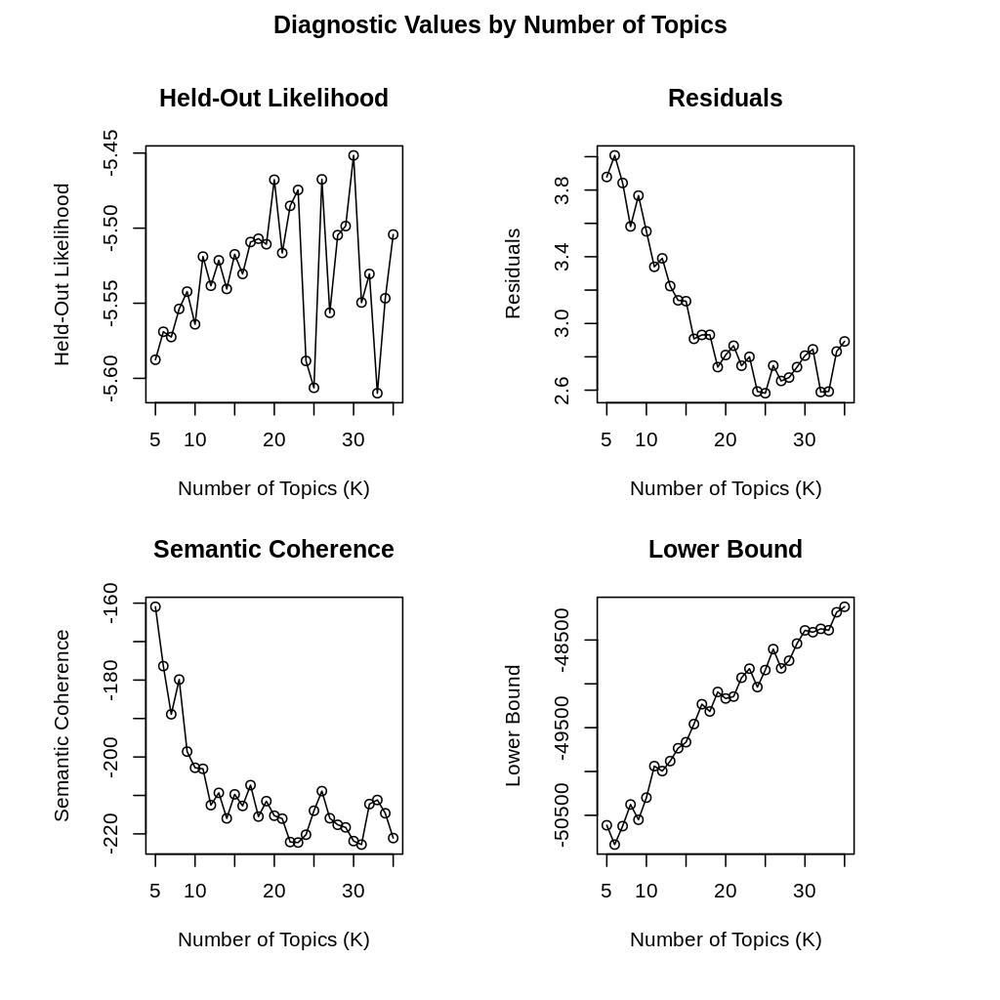

In [239]:
with grdevices.render_to_bytesio(grdevices.jpeg,width=1024, height=1024, res=150) as img:
    robjects.r(
        'plot(fitsk)'
        );
img_obj=Image(data=img.getvalue())
open(fig_dir+"kvalidation", "wb").write(img_obj.data)
display(img_obj)

In [119]:
nwords=7
K=39
test1=robjects.r('labelTopics(fit,n='+str(nwords)+')')
topicwords=pd.Series(np.asarray(test1.rx[1][0]).reshape((nwords,K)).T.tolist(),index=range(1,K+1))
topicwords.index.name='topicid'
print(topicwords.values)
robjects.r('plot(fit)')

[list(['peopl', 'make', 'think', 'might', 'twice', 'direct', 'cheap'])
 list(['less', 'price', 'product', 'expens', 'incent', 'wast', 'higher'])
 list(['better', 'must', 'earth', 'awar', 'everyon', 'place', 'let'])
 list(['altern', 'compani', 'find', 'forc', 'look', 'solut', 'resourc'])
 list(['help', 'mayb', 'implement', 'lot', 'oil', 'benefici', 'economi'])
 list(['environ', 'impact', 'improv', 'run', 'busi', 'exist', 'realiz'])
 list(['tax', 'believ', 'done', 'dont', 'want', 'goe', 'reason'])
 list(['air', 'anyth', 'actual', 'countri', 'order', 'keep', 'situat'])
 list(['way', 'get', 'thing', 'seem', 'affect', 'behavior', 'consid'])
 list(['planet', 'take', 'action', 'great', 'now', 'children', 'care'])
 list(['reduc', 'consumpt', 'cut', 'canada', 'essenti', 'compens', 'hate'])
 list(['cost', 'govern', 'cleaner', 'littl', 'technolog', 'anoth', 'profit'])
 list(['money', 'respons', 'health', 'affect', 'spend', 'extent', 'curious'])
 list(['sure', 'just', 'realli', 'much', 'real', 'kn

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f4a655dbd80> [RTYPES.NILSXP]

double assumed number of topics

In [113]:
yield_seed = lambda x: robjects.NULL if x==None else x
robjects.globalenv["fit"] = robjects.r.stm(
    robjects.r("processed_corpus$documents"), 
    robjects.r("processed_corpus$vocab"), 
    K=2*K, data=robjects.r("processed_corpus$meta"),
    init_type=init_type, seed=yield_seed(seed),max_em_its=max_em_its)

Beginning Spectral Initialization 
	 Calculating the gram matrix...
	 Finding anchor words...
 	..........
	 Recovering initialization...
 	.......
Initialization complete.
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 1 (approx. per word bound = -6.090) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 2 (approx. per word bound = -5.881, relative change = 3.440e-02) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 3 (approx. per word bound = -5.768, relative change = 1.912e-02) 
...........................................................................................................
Completed E-S

 Topic 4: use, fossil, pollut, support, must 
 Topic 5: fuel, will, emiss, dont, save 
 Topic 6: peopl, chang, environ, better, find 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, develop 
 Topic 9: climat, need, cost, get, effect 
 Topic 10: carbon, will, less, futur, caus 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 26 (approx. per word bound = -5.555, relative change = 1.327e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 27 (approx. per word bound = -5.554, relative change = 1.181e-04) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 28 (approx. per word 

Topic 1: tax, compani, consumpt, increas, forc 
 Topic 2: help, way, sourc, protect, warm 
 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fossil, pollut, support, must 
 Topic 5: fuel, will, emiss, dont, save 
 Topic 6: peopl, chang, environ, better, find 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, develop 
 Topic 9: climat, need, cost, get, effect 
 Topic 10: carbon, will, less, caus, futur 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 51 (approx. per word bound = -5.545, relative change = 4.502e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 52 (approx. per word bound = -5.544, relative change = 4.125e-05) 
..............................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 99 (approx. per word bound = -5.536, relative change = 2.166e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 100 (approx. per word bound = -5.536, relative change = 2.000e-05) 
Topic 1: tax, compani, consumpt, increas, forc 
 Topic 2: help, way, protect, sourc, warm 
 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fossil, pollut, support, must 
 Topic 5: will, fuel, emiss, dont, save 
 Topic 6: peopl, chang, environ, better, find 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, develop 
 Topic 9: climat, need, cost, get, effect 
 Topic 10: carbon, less, will, caus, futur 
.............................................................

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 147 (approx. per word bound = -5.525, relative change = 5.873e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 148 (approx. per word bound = -5.525, relative change = 5.867e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 149 (approx. per word bound = -5.525, relative change = 5.857e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 150 (approx. per word bound = -5.524, relative change = 5.830e-05) 
Topic 1: tax

 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, gas 
 Topic 9: chang, climat, need, cost, get 
 Topic 10: carbon, less, caus, futur, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 196 (approx. per word bound = -5.515, relative change = 4.526e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 197 (approx. per word bound = -5.515, relative change = 4.796e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 198 (approx. per word bound = -5.515, relative change = 4.975e-05) 
........................................................................................

 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fossil, fuel, pollut, support 
 Topic 5: will, emiss, fuel, dont, save 
 Topic 6: peopl, environ, better, find, good 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, amount 
 Topic 9: chang, climat, need, cost, get 
 Topic 10: carbon, less, caus, futur, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 221 (approx. per word bound = -5.509, relative change = 3.702e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 222 (approx. per word bound = -5.509, relative change = 3.599e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-S

Completed M-Step. 
Completing Iteration 245 (approx. per word bound = -5.506, relative change = 1.463e-05) 
Topic 1: tax, compani, consumpt, increas, industri 
 Topic 2: help, way, protect, sourc, warm 
 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fuel, fossil, pollut, support 
 Topic 5: will, emiss, dont, save, much 
 Topic 6: peopl, environ, better, find, good 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, amount 
 Topic 9: chang, climat, need, cost, get 
 Topic 10: carbon, less, caus, futur, believ 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 246 (approx. per word bound = -5.506, relative change = 1.468e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 247 (approx. per 

Completing Iteration 269 (approx. per word bound = -5.503, relative change = 2.376e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 270 (approx. per word bound = -5.503, relative change = 2.511e-05) 
Topic 1: tax, compani, consumpt, increas, industri 
 Topic 2: help, way, protect, sourc, warm 
 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fuel, fossil, pollut, support 
 Topic 5: will, emiss, dont, save, much 
 Topic 6: peopl, environ, better, find, good 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, amount 
 Topic 9: chang, climat, need, cost, get 
 Topic 10: carbon, less, caus, futur, product 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 271 (approx. per word bound = -5.50

...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 294 (approx. per word bound = -5.500, relative change = 1.897e-05) 
...........................................................................................................
Completed E-Step (0 seconds). 
Completed M-Step. 
Completing Iteration 295 (approx. per word bound = -5.499, relative change = 1.953e-05) 
Topic 1: tax, compani, consumpt, increas, industri 
 Topic 2: help, way, protect, sourc, warm 
 Topic 3: energi, make, pay, encourag, planet 
 Topic 4: use, fuel, fossil, pollut, support 
 Topic 5: will, emiss, dont, save, much 
 Topic 6: peopl, environ, better, find, good 
 Topic 7: altern, money, can, put, like 
 Topic 8: reduc, think, price, hope, drive 
 Topic 9: chang, climat, need, cost, get 
 Topic 10: carbon, less, caus, futur, product 
.........................................................

In [116]:
nwords=7
test1=robjects.r('labelTopics(fit,n='+str(nwords)+')')
topicwords=pd.Series(np.asarray(test1.rx[1][0]).reshape((nwords,2*K)).T.tolist(),index=range(1,2*K+1))
topicwords.index.name='topicid'
print(topicwords.values)
robjects.r('plot(fit)')

[list(['tax', 'compani', 'consumpt', 'increas', 'industri', 'forc', 'incent'])
 list(['help', 'way', 'protect', 'sourc', 'warm', 'govern', 'global'])
 list(['energi', 'make', 'pay', 'encourag', 'planet', 'work', 'may'])
 list(['use', 'fuel', 'fossil', 'pollut', 'support', 'must', 'transport'])
 list(['will', 'emiss', 'dont', 'save', 'much', 'decreas', 'tri'])
 list(['peopl', 'environ', 'better', 'find', 'good', 'someth', 'car'])
 list(['altern', 'money', 'can', 'put', 'like', 'develop', 'option'])
 list(['reduc', 'think', 'price', 'hope', 'drive', 'amount', 'gas'])
 list(['chang', 'climat', 'need', 'cost', 'get', 'effect', 'believ'])
 list(['carbon', 'less', 'caus', 'futur', 'product', 'just', 'harm'])]


<rpy2.rinterface_lib.sexp.NULLType object at 0x7f4a655dbd80> [RTYPES.NILSXP]

In [ ]:
data=robjects.r('processed_corpus_temp$documents')
test1=pd.DataFrame.from_records([doc for doc in data.items()],index=[0]).drop(0,axis=1)
stmclean_corpus.rename(columns={1: question_id_name+'clean_stems_keepwordvec'},inplace=True)
test1.index.name= None
test1

In [ ]:
K=5#7#12
init_type="Spectral"
seed=None
max_em_its=500
emtol=1e-5
verbose=False#True
reportevery=5
LDAbeta=True
interactions=True
ngroups=1
gamma_prior="Pooled"
sigma_prior=0
kappa_prior="L1"
# model_parameters={
#     'K': 10,  # number of topics
#     'LDAbeta': LDAbeta,
#     'gamma_prior':,
#     'sigma_prior':,
#     'kappa_prior':
# }
# inference_options = {
#     'init_type': init_type,
#     'seed':,
#     'max_em_its':,
#     'emtol':,
#     'verbose':,
#     'ngroups':1,
# }